<center> <img src="https://miro.medium.com/v2/resize:fit:1250/format:webp/1*QgI1t-7yJApi4vQigFgsLQ.jpeg" width=25% > </center>

<br><br>

<center> 
    <font size="6">Final Lab (Part 1): Keypoint Detection, Bag of Visual Words and Image Classification</font>
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59PM, 24th October, 2025 (Amsterdam time)</font> 
</center>

<br><br>

***

<br><br>

<center>

Student1 ID:  15189155\
Student1 Name: Hana Derkova

Student2 ID: \
Student2 Name: 

Student3 ID: \
Student3 Name: 

( Student4 ID: \
Student4 Name: )

</center>

### **General Guidelines**

Your code must be handed in this Jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Final Lab (Part 1) Assignment. Please also fill out your names and IDs above.

For full credit, make sure your notebook follows these guidelines:

- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Understand the problem as much as you can. When answering a question, provide evidence (qualitative and/or quantitative results, references to papers, figures, etc.) to support your arguments. Not everything might be explicitly asked for, so think about what might strengthen your arguments to make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Add a number, a title, and, if applicable, the name and unit of variables in a table, and name and unit of axes and legends in a figure.

**Late submissions are not allowed.** Assignments submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance to avoid last-minute system failure issues.

**Environment:** Since this is a project-based assignment, you are free to use any feature descriptor and machine learning tools (e.g., K-means, SVM). You should use Python for your implementation. You are free to use any Python library for this assignment, but make sure to provide a conda environment file!

**Plagiarism Note:** Keep in mind that plagiarism (submitted materials which are not your work) is a serious offense and any misconduct will be addressed according to university regulations. This includes using generative tools such as ChatGPT.

**Ensure that you save all results/answers to the questions (even if you reuse some code).**

### **Report Preparation**

Your tasks include the following:

1. **Report Preparation:** For both parts of the final project, students are expected to prepare a report. The report should include all details on implementation approaches, analysis of results for different settings, and visualizations illustrating experiments and performance of your implementation. Grading will be based on the report, so it should be as self-contained as possible. If the report contains faulty results or ambiguities, TAs can refer to your code for clarification. Only section 10 of this notebook should **not** be included in the report.

2. **Explanation of Results:** Do not just provide numbers without explanation. Discuss different settings to show your understanding of the material and processes involved.

3. **Quantitative Evaluation:** For quantitative evaluation, you are expected to provide the results based on the mAP (mean Average Precision) metric. You should report the mAP for each experimental setup. 

4. **Qualitative Evaluation:** For qualitative evaluation, you are expected to visualize the top-5 and bottom-5 ranked test images (based on classifier confidence for the target class) per setup. Provide a figure for each experimental setup Visual elements such as charts, graphs, and plots are always useful. Keep this in mind while writing your reports.

5. **Aim:** Understand the basic Image Classification pipeline using a traditional Bag of Visual Words method.

6. **Working on Assignments:** Students should work in assigned groups for **two** weeks. Any questions can be discussed on ED.

    - **Submission:** Submit your source code and report together in a zip file (`ID1_ID2_ID3_part1.zip`). The report should be a maximum of 10 pages (single-column, including tables and figures, excluding references and appendix). Express thoughts concisely. Tables and figures must be accompanied by a description. Number them and, if applicable, name variables in tables, and label axes in figures.

7. **Hyperparameter Search:** In your experiments, remember to perform a hyperparameter search to find the optimal settings for your classifier. Clearly document the search process, the parameters you explored, and how they influenced the performance of your model.

8. **Format and Testing:** The report should be in **PDF format**, and the code in **.ipynb format**. Test that all functionality works as expected in the notebook.

### **Overview**

- [Section 1: Data Preparation (0 points)](#section-1)
- [Section 2: Keypoint Detection and Feature Extraction (3 points)](#section-2)
- [Section 3: Building the Visual Vocabulary (3 points)](#section-3)
- [Section 4: Encoding Train Image Features (3 points)](#section-4)
- [Section 5: Visualizing the Bag of Visual Words for Each Class (3 points)](#section-5)
- [Section 6: Encoding Test Image Features (0 points)](#section-6)
- [Section 7: Training the Classifiers (5 points)](#section-7)
- [Section 8: Evaluating the Classifiers (12 points)](#section-8)
- [Section 9: Hyperparameter Search (16 points)](#section-9)
- [Section 10: Using CLIP for Image Classification (5 points)](#section-10)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

### **Section 1: Data Preparation (0 points)**

The goal of this lab is to implement an image classification system that can identify objects from a given set of classes. You will perform a 5-class image classification using a bag-of-words approach ([reference](http://www.robots.ox.ac.uk/~az/icvss08_az_bow.pdf)). The classes for this task are:

1. **Frog**
2. **Automobile**
3. **Bird**
4. **Cat**
5. **Deer**

The [CIFAR-10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html) will be used for this task. This dataset contains 32x32 pixel RGB images, divided into sub-directories with 5000 training images and 1000 test images for each class.

The dataset will be automatically downloaded using the code provided in this notebook. You will need to perform training on the training set, which will later be divided into two subsets: one for building the visual vocabulary and another for training the classifier. Using more samples for training generally results in better performance. However, if computational resources are limited, you may use fewer training images to save time, as long as at least 500 images per class are included.

The system must be tested using the specified subset of test images. Use all 1000 test images (per class) to observe the full performance of the model. Ensure that test images are excluded from training to maintain a fair comparison.

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset, Subset
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Define total train and test sizes
total_train_size = 5000  # Default value for total training images
total_test_size = 1000   # Default value for total test images

# Define batch sizes for DataLoader
train_batch_size = total_train_size
test_batch_size = total_test_size

# Define the number of Visual Words
num_of_visual_words = 1000  # Default value for number of visual words

# Number of classes
num_classes = 5

# Compute images per class for training and testing
images_per_class_train = total_train_size // num_classes  # e.g., 5000 // 5 = 1000 per class
images_per_class_test = total_test_size // num_classes    # e.g., 1000 // 5 = 200 per class

# Define the transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  
])

# Define the class indices for the 5 selected classes: frog, automobile, bird, cat, and deer
selected_classes = [6, 1, 2, 3, 4]  # 6: frog, 1: automobile, 2: bird, 3: cat, 4: deer
class_to_label = {orig_class: new_label for new_label, orig_class in enumerate(selected_classes)}

# Load the CIFAR-10 training set
train_set = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)

# Function to filter and remap dataset
def filter_dataset(dataset, images_per_class, selected_classes, class_to_label):
    selected_indices = []
    class_counts = {class_idx: 0 for class_idx in selected_classes}
    remapped_labels = []

    for idx, (image, label) in enumerate(dataset):
        if label in selected_classes and class_counts[label] < images_per_class:
            selected_indices.append(idx)
            remapped_labels.append(class_to_label[label])
            class_counts[label] += 1

            # Stop if we have enough samples for each class
            if all(count >= images_per_class for count in class_counts.values()):
                break

    filtered_dataset = Subset(dataset, selected_indices)
    return filtered_dataset, remapped_labels

# Filter and remap training set
filtered_train_set, train_mapped_labels = filter_dataset(train_set, images_per_class_train, selected_classes, class_to_label)

# Load the CIFAR-10 test set
test_set = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# Filter and remap test set
filtered_test_set, test_mapped_labels = filter_dataset(test_set, images_per_class_test, selected_classes, class_to_label)

# Create data loaders for the filtered datasets
train_data_loader = DataLoader(filtered_train_set, batch_size=train_batch_size, shuffle=False)
test_data_loader = DataLoader(filtered_test_set, batch_size=test_batch_size, shuffle=False)

# Extract all training data and remapped labels
train_images, _ = next(iter(train_data_loader))
train_labels = torch.tensor(train_mapped_labels)

train_images = train_images.permute(0, 2, 3, 1)
print(f"Filtered train data: {train_images.shape}")
print(f"Filtered train labels: {train_labels.shape}")

# Extract all test data and remapped labels
test_images, _ = next(iter(test_data_loader))
test_labels = torch.tensor(test_mapped_labels)

test_images = test_images.permute(0, 2, 3, 1)
print(f"Filtered test data: {test_images.shape}")
print(f"Filtered test labels: {test_labels.shape}")

Files already downloaded and verified
Files already downloaded and verified
Filtered train data: torch.Size([5000, 32, 32, 3])
Filtered train labels: torch.Size([5000])
Filtered test data: torch.Size([1000, 32, 32, 3])
Filtered test labels: torch.Size([1000])


<a id="section-2"></a>
### **Section 2: Keypoint Detection and Feature Extraction (3 points)**

In this section, you will work on detecting keypoints and extracting features from the dataset. Your task is to use **two different feature extraction techniques** to identify keypoints in the images. Visualize two images from each of the five classes (Frog, Automobile, Bird, Cat, Deer) for both feature extraction techniques. For each image, draw circles around the detected keypoints that represent their size.

This step is essential to understand how different feature extractors behave across various classes, setting the foundation for further analysis and classification in later steps.

**Hint:** You can use the OpenCV library to detect keypoints and extract features. You can also upscale the images to improve the visualization of the keypoints.

In [135]:
class_names = ['frog', 'automobile', 'bird', 'cat', 'deer']

In [154]:
def extract_orb(img, orb):
    img_uint8 = np.clip((img.numpy() * 0.5 + 0.5) * 255, 0, 255).astype(np.uint8)
    gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
    kp, desc = orb.detectAndCompute(gray, None)
    num_desc = 0 if desc is None else len(desc)
    return kp, num_desc, desc

def extract_sift(img, sift):
    img_uint8 = np.clip((img.numpy() * 0.5 + 0.5) * 255, 0, 255).astype(np.uint8)
    gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
    kp, desc = sift.detectAndCompute(gray, None)
    num_desc = 0 if desc is None else len(desc)
    return kp, num_desc, desc

In [ ]:
# # ALLL THE SIFT AND ODRB WE WANNA TRY
# sift = cv2.SIFT_create(
#     contrastThreshold=0.003,  # lower → more keypoints
#     edgeThreshold=3,           # allow more near borders
#     sigma=0.8                  # finer smoothing
# )

# sift = cv2.SIFT_create()

# sift = cv2.SIFT_create(
#     contrastThreshold=0.003,
#     edgeThreshold=1,
#     sigma=0.8
#     #nOctaveLayers=4
# )



orb = cv2.ORB_create(
    nfeatures=100,        # slightly lower than 500
    scaleFactor=1.2,      
    nlevels=3,            
    edgeThreshold=5,     # increase a bit to reduce border points
    firstLevel=0,
    WTA_K=2,
    scoreType=cv2.ORB_HARRIS_SCORE,
    patchSize=8,
    fastThreshold=25      # increase threshold → fewer detections
)

# this is minimum limit
sift = cv2.SIFT_create(nfeatures=100)
#orb = cv2.ORB_create(nfeatures=100)

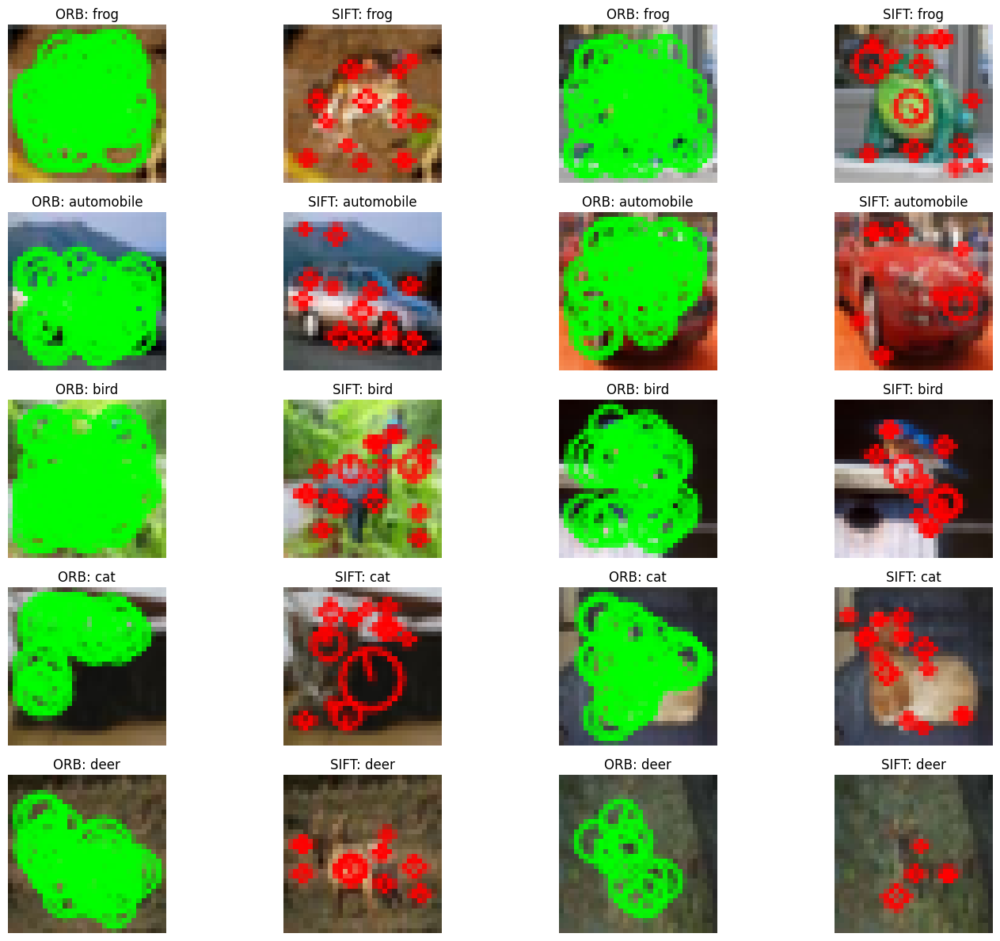

AVG SIFT FEATURES PER IMAGE: 13.5
AVG ORB FEATURES PER IMAGE: 32.5


In [146]:
indices_per_class = {i: [] for i in range(len(class_names))}
for idx, label in enumerate(train_labels):
    label = int(label)  # convert tensor to int
    if len(indices_per_class[label]) < 2:
        indices_per_class[label].append(idx)

# Flatten the list of selected indices
selected_indices = [idx for class_idx in indices_per_class for idx in indices_per_class[class_idx]]

plt.figure(figsize=(15, 12))
total_orb = 0
total_sift = 0
for i, idx in enumerate(selected_indices):
    # Unnormalize and convert to uint8
    img = train_images[idx] #.numpy()
    img_uint8 = np.clip((img.numpy() * 0.5 + 0.5) * 255, 0, 255).astype(np.uint8)
    orb_kp, num_orb, _ = extract_orb(img, orb)
    sift_kp, num_sift, _ = extract_sift(img, sift)
    total_orb += num_orb
    total_sift += num_sift
    # img = (img * 0.5 + 0.5)  # back to [0,1]
    # img = np.clip(img * 255, 0, 255).astype(np.uint8)
    # gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # # Detect keypoints
    # orb_kp, orb_dsc = orb.detectAndCompute(gray, None)
    # sift_kp, sift_dsc = sift.detectAndCompute(gray, None)

    # Draw keypoints with circle size = kp.size
    orb_vis = cv2.drawKeypoints(img_uint8, orb_kp, None, color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    sift_vis = cv2.drawKeypoints(img_uint8, sift_kp, None, color=(255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


    # # Show using OpenCV window
    # cv2.imshow('SIFT Keypoints', sift_vis)
    # cv2.waitKey(0)          # Wait for any key press
    # cv2.destroyAllWindows() 

    # Plot ORB
    plt.subplot(len(selected_indices)//2, 4, 2*i + 1)
    plt.imshow(orb_vis)
    plt.title(f"ORB: {class_names[int(train_labels[idx])]}")
    plt.axis("off")

    # Plot SIFT
    plt.subplot(len(selected_indices)//2, 4, 2*i + 2)
    plt.imshow(sift_vis)
    plt.title(f"SIFT: {class_names[int(train_labels[idx])]}")
    plt.axis("off")

plt.tight_layout()
plt.show()

print(f"AVG SIFT FEATURES PER IMAGE: {total_sift / len(selected_indices)}")

print(f"AVG ORB FEATURES PER IMAGE: {total_orb / len(selected_indices)}")

<a id="section-3"></a>
### **Section 3: Building the Visual Vocabulary (3 points)**

In this section, the task is to create a visual vocabulary by clustering feature descriptors extracted from the images using K-Means. Each cluster center in this vocabulary will represent a visual word. Use the two different extraction techniques you implemented to extract descriptors from a subset of training images that includes all categories, and then apply K-Means clustering to build the vocabulary. The number of clusters is fixed at 1000, but you can experiment with different values when you are tuning the hyperparameters in section 9.

To examine the effect of different amounts of training data, build separate visual vocabularies using 30%, 40%, and 50% subsets of the training images. For faster clustering, the `faiss` library can be used, as it provides an efficient implementation of K-Means. Then, visualize the first 10 clusters for each feature extraction technique and each subset size using PCA to reduce the dimensions to 2D.

**Hints:**
1. Begin by debugging the code with a small number of input images to ensure it functions correctly before running it on larger datasets.
2. If the `faiss` library is not available, K-Means clustering can also be performed using the `sklearn` or `scipy` libraries.
3. For visualization, use PCA from `sklearn.decomposition` to reduce the high-dimensional descriptors to 2D. Display up to 10 clusters in the scatter plot to maintain clarity.

In [147]:
import numpy as np

def split_train_for_vocab_svm(train_images, train_labels, class_names, vocab_fraction=0.5, seed=None):
    """
    Split the training dataset into two disjoint subsets: 
    one for building visual vocabulary and one for SVM training.

    Args:
        train_images: array of all training images.
        train_labels: array of labels corresponding to train_images.
        class_names: List of class names
        vocab_fraction: Fraction of images per class used for visual vocabulary (0-1). 
                        The rest goes to SVM training.
        seed: Optional random seed for reproducibility.

    Returns:
        vocab_images, vocab_indices: images and indices used for visual vocabulary
        svm_images, svm_indices: images and indices used for SVM training
    """
    if seed is not None:
        np.random.seed(seed)
    
    num_classes = len(class_names)
    
    # Count images per class
    images_per_class = np.array([(train_labels == c).sum().item() for c in range(num_classes)])
    
    # Compute number of images per class for vocabulary
    vocab_per_class = (images_per_class * vocab_fraction).astype(int)
    
    # Collect indices
    vocab_indices = []
    svm_indices = []
    
    for c in range(num_classes):
        class_idxs = np.where(train_labels.numpy() == c)[0]
        np.random.shuffle(class_idxs)
        
        # Split
        vocab_idxs_c = class_idxs[:vocab_per_class[c]]
        svm_idxs_c = class_idxs[vocab_per_class[c]:]
        
        vocab_indices.extend(vocab_idxs_c)
        svm_indices.extend(svm_idxs_c)
    
    vocab_indices = np.array(vocab_indices)
    svm_indices = np.array(svm_indices)
    
    vocab_images = train_images[vocab_indices]
    svm_images = train_images[svm_indices]
    
    print(f"Number of images for visual vocabulary: {len(vocab_indices)}")
    print(f"Number of images for SVM training: {len(svm_indices)}")
    
    return vocab_images, vocab_indices, svm_images, svm_indices


In [168]:
vocab_images, vocab_indices, svm_images, svm_indices = split_train_for_vocab_svm(train_images,
                                                                                train_labels,
                                                                                class_names,
                                                                                vocab_fraction=0.3,
                                                                                seed=None)

Number of images for visual vocabulary: 1500
Number of images for SVM training: 3500


In [19]:
# import numpy as np

# subset_percent = 0.5  # fraction for visual vocabulary
# num_classes = len(class_names)

# # Compute number of images per class for subset
# images_per_class = np.array([(train_labels == c).sum().item() for c in range(num_classes)])
# subset_per_class = (images_per_class * subset_percent).astype(int)

# # Collect indices per class
# vocab_indices = []
# svm_indices = []

# for c in range(num_classes):
#     class_idxs = np.where(train_labels.numpy() == c)[0]
#     np.random.shuffle(class_idxs)  # shuffle class indices

#     # Take first subset_per_class[c] for vocab
#     vocab_idxs_c = class_idxs[:subset_per_class[c]]
#     svm_idxs_c = class_idxs[subset_per_class[c]:]  # rest for SVM

#     vocab_indices.extend(vocab_idxs_c)
#     svm_indices.extend(svm_idxs_c)

# vocab_indices = np.array(vocab_indices)
# svm_indices = np.array(svm_indices)

# print("Number of images for visual vocabulary:", len(vocab_indices))
# print("Number of images for SVM training:", len(svm_indices))


# vocab_images = train_images[vocab_indices]

Number of images for visual vocabulary: 2500
Number of images for SVM training: 2500


In [155]:
def extract_orb_sift_from_images(images, orb, sift):
    """
    Extract ORB and SIFT descriptors from a list of images using provided detectors.

    Args:
        images: list or tensor of images (normalized [-1,1]).
        orb: initialized cv2.ORB detector.
        sift: initialized cv2.SIFT detector.

    Returns:
        orb_descriptors: stacked ORB descriptors (NumPy array)
        sift_descriptors: stacked SIFT descriptors (NumPy array)
    """
    orb_list = []
    sift_list = []
    orb_counts = []
    sift_counts = []

    for img in images:
        # --- ORB ---
        kp_orb, num_orb, desc_orb = extract_orb(img, orb)
        if desc_orb is not None:
            orb_list.append(desc_orb)
            orb_counts.append(desc_orb.shape[0])
        else:
            orb_counts.append(0)

        # --- SIFT ---
        kp_sift, num_sift, desc_sift = extract_sift(img, sift)
        if desc_sift is not None:
            sift_list.append(desc_sift)
            sift_counts.append(desc_sift.shape[0])
        else:
            sift_counts.append(0)

    # Stack descriptors
    orb_descriptors = np.vstack(orb_list) if len(orb_list) > 0 else np.empty((0, 32), dtype=np.float32)
    sift_descriptors = np.vstack(sift_list) if len(sift_list) > 0 else np.empty((0, 128), dtype=np.float32)

    # Print informative stats
    print(f"ORB descriptors shape: {orb_descriptors.shape}")
    print(f"Average ORB descriptors per image: {np.mean(orb_counts):.2f}")
    print(f"SIFT descriptors shape: {sift_descriptors.shape}")
    print(f"Average SIFT descriptors per image: {np.mean(sift_counts):.2f}")

    return orb_descriptors, sift_descriptors


In [156]:
orb_descriptors, sift_descriptors = extract_orb_sift_from_images(vocab_images, orb, sift)

ORB descriptors shape: (51244, 32)
Average ORB descriptors per image: 34.16
SIFT descriptors shape: (19347, 128)
Average SIFT descriptors per image: 12.90


In [20]:
# orb_descriptors_list = []

# for img in vocab_images:
#     # Convert to uint8
#     img_uint8 = np.clip((img.numpy() * 0.5 + 0.5) * 255, 0, 255).astype(np.uint8)
#     gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
    
#     # Detect keypoints and compute descriptors
#     kp, desc = orb.detectAndCompute(gray, None)
    
#     if desc is not None:
#         orb_descriptors_list.append(desc)

# # Stack all descriptors into a single array
# orb_descriptors = np.vstack(orb_descriptors_list)  # shape [total_descriptors, 32]
# print("ORB descriptors shape:", orb_descriptors.shape)

# sift_descriptors_list = []

# for img in vocab_images:
#     img_uint8 = np.clip((img.numpy() * 0.5 + 0.5) * 255, 0, 255).astype(np.uint8)
#     gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)

#     # Option 1: normal SIFT
#     kp, desc = sift.detectAndCompute(gray, None)
    
#     if desc is not None:
#         sift_descriptors_list.append(desc)

# # Stack all descriptors
# sift_descriptors = np.vstack(sift_descriptors_list)  # shape [total_descriptors, 128]
# print("SIFT descriptors shape:", sift_descriptors.shape)




ORB descriptors shape: (85092, 32)
SIFT descriptors shape: (32603, 128)


In [5]:
!pip install faiss-cpu

In [86]:
import faiss

# # Example: using ORB descriptors
# descriptors = orb_descriptors.astype(np.float32)  # FAISS requires float32
# num_clusters = 200  # size of visual vocabulary
# d = descriptors.shape[1]  # dimension of descriptors (32 for ORB, 128 for SIFT)

# orb_kmeans = faiss.Kmeans(d=d, k=num_clusters, niter=20, verbose=True, gpu=False)
# orb_kmeans.train(descriptors)



Sampling a subset of 51200 / 85092 for training
Clustering 51200 points in 32D to 200 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.31 s, search 0.29 s): objective=1.43195e+09 imbalance=1.274 nsplit=0       


1431945344.0

In [ ]:
def train_kmeans(orb_descriptors, sift_descriptors, num_clusters_orb=200, num_clusters_sift=200, niter=20, use_gpu=False):
    """
    Train FAISS KMeans for ORB and SIFT descriptors.

    Args:
        orb_descriptors: NumPy array of ORB descriptors (shape [n_samples, 32])
        sift_descriptors: NumPy array of SIFT descriptors (shape [n_samples, 128])
        num_clusters_orb: number of clusters for ORB visual vocabulary
        num_clusters_sift: number of clusters for SIFT visual vocabulary
        niter: number of KMeans iterations
        use_gpu: whether to use GPU (requires FAISS GPU installation)

    Returns:
        orb_kmeans: trained FAISS KMeans object for ORB
        sift_kmeans: trained FAISS KMeans object for SIFT
    """
    # --- ORB KMeans ---
    orb_desc = orb_descriptors.astype(np.float32)
    d_orb = orb_desc.shape[1]
    orb_kmeans = faiss.Kmeans(d=d_orb, k=num_clusters_orb, niter=niter, verbose=True, gpu=use_gpu)
    orb_kmeans.train(orb_desc)

    # --- SIFT KMeans ---
    sift_desc = sift_descriptors.astype(np.float32)
    d_sift = sift_desc.shape[1]
    sift_kmeans = faiss.Kmeans(d=d_sift, k=num_clusters_sift, niter=niter, verbose=True, gpu=use_gpu)
    sift_kmeans.train(sift_desc)

    return orb_kmeans, sift_kmeans


In [160]:
orb_kmeans, sift_kmeans = train_kmeans(orb_descriptors,
                                       sift_descriptors,
                                       num_clusters_orb=1000)

Clustering 51244 points in 32D to 1000 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 (1.59 s, search 1.57 s): objective=9.94136e+08 imbalance=1.338 nsplit=0       
Clustering 19347 points in 128D to 200 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 (0.30 s, search 0.28 s): objective=1.59124e+09 imbalance=1.049 nsplit=0       


In [161]:
def plot_visual_words(descriptors, kmeans, n_clusters_to_show=10, title_prefix="ORB"):
    """
    Plot the first n_clusters_to_show centroids and the descriptors assigned to them using PCA.

    Args:
        descriptors: NumPy array of shape [n_samples, d], dtype float32
        kmeans: trained FAISS KMeans object
        n_clusters_to_show: number of centroids to display
        title_prefix: string for plot title (e.g., "ORB" or "SIFT")
    """
    # Build FAISS index on centroids
    d = descriptors.shape[1]
    index = faiss.IndexFlatL2(d)
    index.add(kmeans.centroids)  # add centroids

    # Assign each descriptor to the nearest centroid
    _, cluster_labels = index.search(descriptors, 1)
    cluster_labels = cluster_labels.flatten()

    # Take first n_clusters_to_show centroids
    centroids = kmeans.centroids[:n_clusters_to_show]

    # Take only descriptors assigned to those clusters
    mask = np.isin(cluster_labels, np.arange(n_clusters_to_show))
    descriptors_subset = descriptors[mask]
    labels_subset = cluster_labels[mask]

    # Combine data and centroids for PCA
    all_points = np.vstack([descriptors_subset, centroids])
    pca = PCA(n_components=2)
    all_points_2d = pca.fit_transform(all_points)

    # Split back into descriptors and centroids
    descriptors_2d = all_points_2d[:-n_clusters_to_show]
    centroids_2d = all_points_2d[-n_clusters_to_show:]

    # Plot
    plt.figure(figsize=(8, 8))
    colors = plt.cm.tab10(np.arange(n_clusters_to_show))

    for i in range(n_clusters_to_show):
        pts = descriptors_2d[labels_subset == i]
        plt.scatter(pts[:, 0], pts[:, 1], s=10, color=colors[i], alpha=0.4, label=f'Cluster {i}')
        plt.scatter(centroids_2d[i, 0], centroids_2d[i, 1], s=200, color=colors[i], edgecolors='black', marker='X')

    plt.title(f"{title_prefix}: First {n_clusters_to_show} visual words (centroids + descriptors)")
    plt.xlabel("PCA component 1")
    plt.ylabel("PCA component 2")
    plt.legend()
    plt.grid(True)
    plt.show()


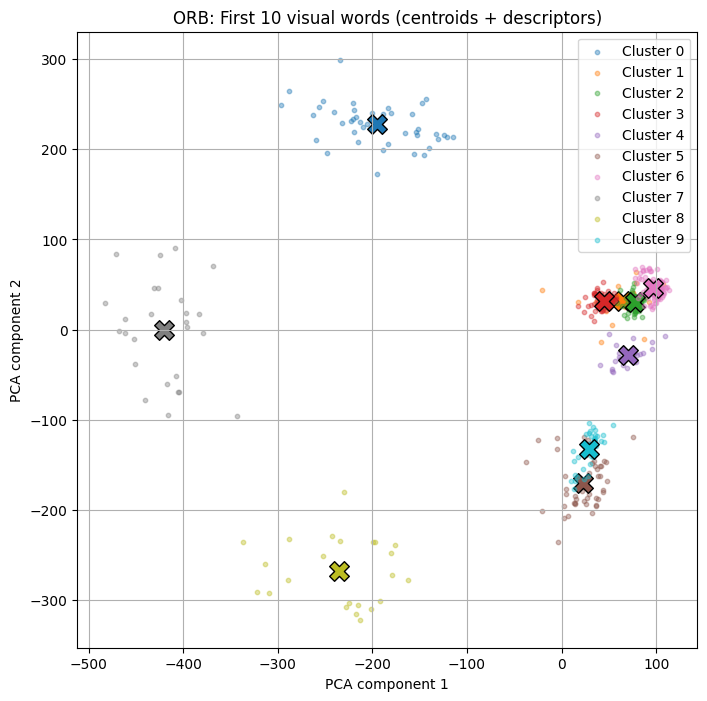

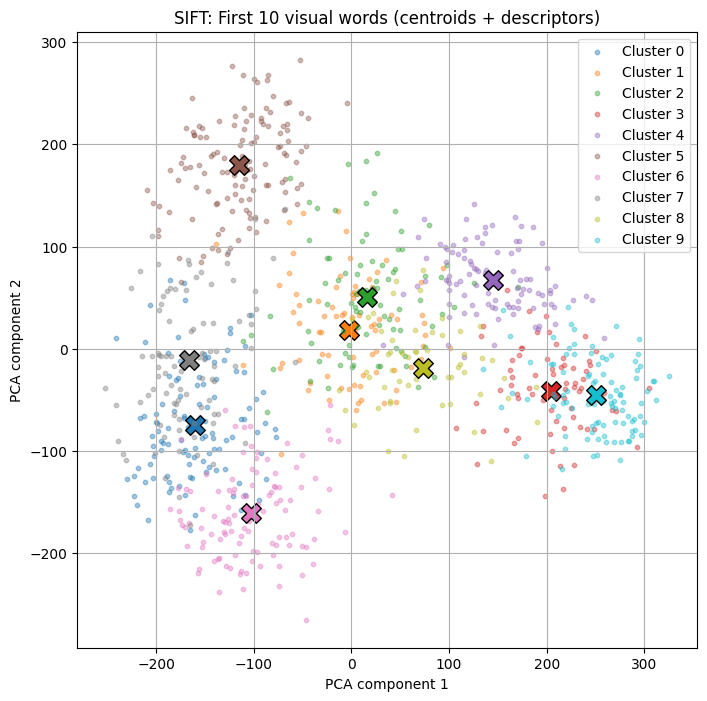

In [163]:
plot_visual_words(orb_descriptors, orb_kmeans, n_clusters_to_show=10, title_prefix="ORB")
plot_visual_words(sift_descriptors, sift_kmeans, n_clusters_to_show=10, title_prefix="SIFT")

In [ ]:
# import numpy as np

# # descriptors: [n_samples, d], float32
# # orb_kmeans.centroids: [k, d]

# # Build FAISS index on centroids
# index = faiss.IndexFlatL2(orb_descriptors.shape[1])          # L2 distance
# index.add(orb_kmeans.centroids)       # add centroids

# # Search nearest centroid for each descriptor
# distances, cluster_labels = index.search(orb_descriptors, 1)  # returns distances and indices
# cluster_labels = cluster_labels.flatten()                 # shape [n_samples]


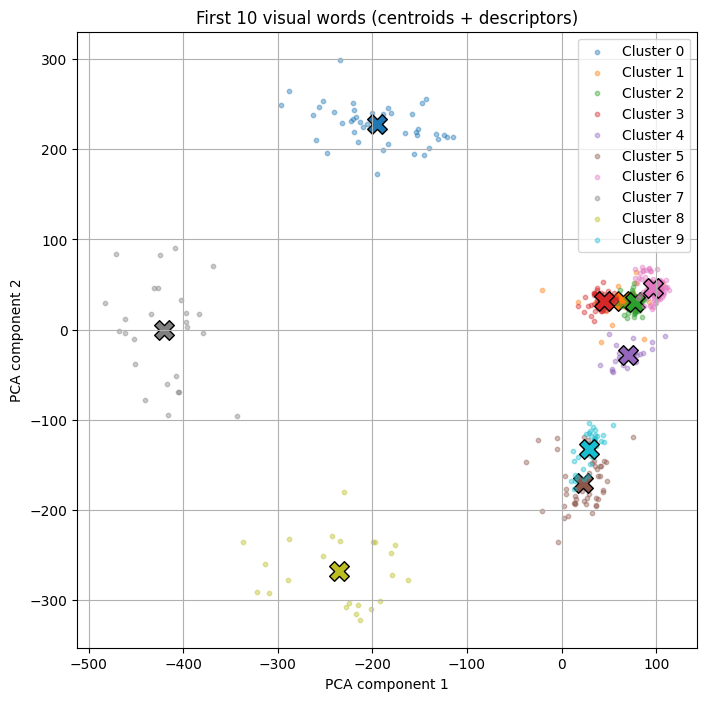

In [166]:
# # from sklearn.decomposition import PCA
# # import matplotlib.pyplot as plt

# # # Take the first 10 centroids
# # centroids = orb_kmeans.centroids[:10]  # shape [10, d]

# # # Reduce to 2D
# # pca = PCA(n_components=2)
# # centroids_2d = pca.fit_transform(centroids)  # shape [10, 2]

# # # Plot
# # plt.figure(figsize=(6, 6))
# # plt.scatter(centroids_2d[:, 0], centroids_2d[:, 1], s=100, c='red')
# # for i, (x, y) in enumerate(centroids_2d):
# #     plt.text(x+0.01, y+0.01, f'Cluster {i}', fontsize=12)
# # plt.title("First 10 visual words (cluster centers) in 2D")
# # plt.xlabel("PCA component 1")
# # plt.ylabel("PCA component 2")
# # plt.grid(True)
# # plt.show()


# from sklearn.decomposition import PCA
# import matplotlib.pyplot as plt
# import numpy as np

# # Assuming:
# # orb_kmeans = KMeans(...)
# # orb_kmeans.fit(descriptors)
# # descriptors = np.array of shape [n_samples, d]

# # Take first 10 clusters
# n_clusters_to_show = 10
# centroids = orb_kmeans.centroids[:10] 

# # Take only datapoints that belong to those clusters
# mask = np.isin(cluster_labels, np.arange(n_clusters_to_show))
# descriptors_subset = orb_descriptors[mask]
# labels_subset = cluster_labels[mask]

# # Combine data and centroids for joint PCA
# all_points = np.vstack([descriptors_subset, centroids])
# pca = PCA(n_components=2)
# all_points_2d = pca.fit_transform(all_points)

# # Split back into datapoints and centroids
# descriptors_2d = all_points_2d[:-n_clusters_to_show]
# centroids_2d = all_points_2d[-n_clusters_to_show:]

# # Plot
# plt.figure(figsize=(8, 8))
# colors = plt.cm.tab10(np.arange(n_clusters_to_show))

# for i in range(n_clusters_to_show):
#     pts = descriptors_2d[labels_subset == i]
#     plt.scatter(pts[:, 0], pts[:, 1], s=10, color=colors[i], alpha=0.4, label=f'Cluster {i}')
#     plt.scatter(centroids_2d[i, 0], centroids_2d[i, 1], s=200, color=colors[i], edgecolors='black', marker='X')

# plt.title(f"First {n_clusters_to_show} visual words (centroids + descriptors)")
# plt.xlabel("PCA component 1")
# plt.ylabel("PCA component 2")
# plt.legend()
# plt.grid(True)
# plt.show()



In [89]:
# descriptors = sift_descriptors.astype(np.float32)  # FAISS requires float32
# num_clusters = 200  # size of visual vocabulary
# d = descriptors.shape[1]  # dimension of descriptors (32 for ORB, 128 for SIFT)

# sift_kmeans = faiss.Kmeans(d=d, k=num_clusters, niter=20, verbose=True, gpu=False)
# sift_kmeans.train(descriptors)

Clustering 32603 points in 128D to 200 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.01 s
  Iteration 19 (0.68 s, search 0.64 s): objective=2.70146e+09 imbalance=1.033 nsplit=0       


2701462528.0

In [ ]:
# # descriptors: [n_samples, d], float32
# # orb_kmeans.centroids: [k, d]

# # Build FAISS index on centroids
# index = faiss.IndexFlatL2(d)          # L2 distance
# index.add(sift_kmeans.centroids)       # add centroids

# # Search nearest centroid for each descriptor
# distances, cluster_labels = index.search(descriptors, 1)  # returns distances and indices
# cluster_labels = cluster_labels.flatten()   

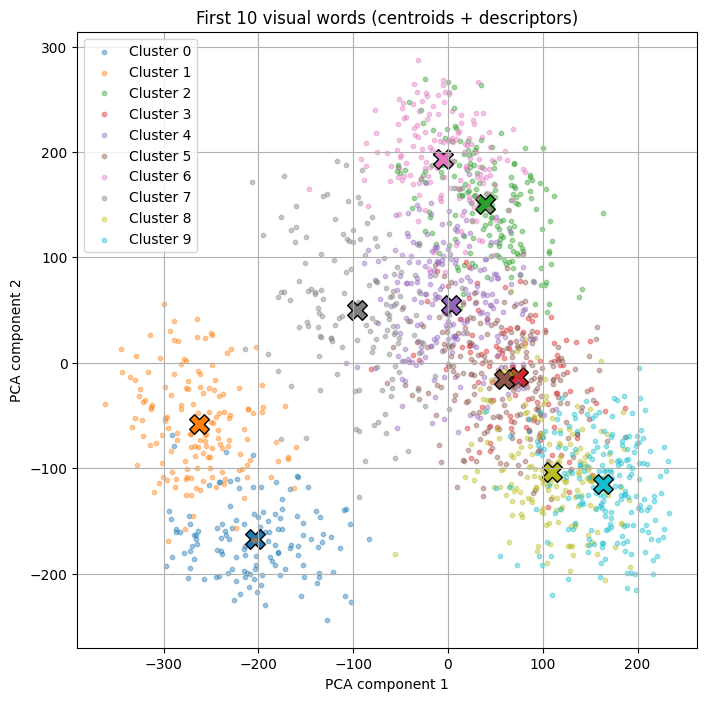

In [ ]:
# # Take the first 10 centroids
# centroids = sift_kmeans.centroids[:10]  # shape [10, d]

# mask = np.isin(cluster_labels, np.arange(n_clusters_to_show))
# descriptors_subset = descriptors[mask]
# labels_subset = cluster_labels[mask]

# # Combine data and centroids for joint PCA
# all_points = np.vstack([descriptors_subset, centroids])
# pca = PCA(n_components=2)
# all_points_2d = pca.fit_transform(all_points)

# # Split back into datapoints and centroids
# descriptors_2d = all_points_2d[:-n_clusters_to_show]
# centroids_2d = all_points_2d[-n_clusters_to_show:]

# # Plot
# plt.figure(figsize=(8, 8))
# colors = plt.cm.tab10(np.arange(n_clusters_to_show))

# for i in range(n_clusters_to_show):
#     pts = descriptors_2d[labels_subset == i]
#     plt.scatter(pts[:, 0], pts[:, 1], s=10, color=colors[i], alpha=0.4, label=f'Cluster {i}')
#     plt.scatter(centroids_2d[i, 0], centroids_2d[i, 1], s=200, color=colors[i], edgecolors='black', marker='X')

# plt.title(f"First {n_clusters_to_show} visual words (centroids + descriptors)")
# plt.xlabel("PCA component 1")
# plt.ylabel("PCA component 2")
# plt.legend()
# plt.grid(True)
# plt.show()



<a id="section-4"></a>
### **Section 4: Encoding Train Image Features (3 points)**

In this section, the task is to encode image features using the visual vocabulary created earlier. Each image will be represented as a histogram of visual words, reflecting the frequency of each visual word in the image. This representation will allow for comparing images based on their visual content.

To encode an image, identify the nearest visual word (cluster center) for each feature descriptor extracted from the image. Construct a histogram that counts the occurrences of each visual word within the image. The final output will be a collection of histograms, one for each image, where each histogram serves as the feature representation of that image. Once again,  Use the two different extraction techniques you implemented to extract descriptors from the images. Then, encode the images using the visual vocabulary created in the previous step.

**Hint:** Utilize the `faiss` library for efficient nearest neighbor search when assigning each descriptor to the nearest cluster center in the visual dictionary. If `faiss` is not available, consider using other libraries, such as `scikit-learn`, for this step. Once the histograms are obtained, they will be used for further tasks, such as training a classifier. For now, perform the encoding only for the training set.

In [ ]:
# def extract_orb(img, orb):
#     img_uint8 = np.clip((img.numpy() * 0.5 + 0.5) * 255, 0, 255).astype(np.uint8)
#     gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
#     kp, desc = orb.detectAndCompute(gray, None)
#     return desc  # may be None

# def extract_sift(img, sift):
#     img_uint8 = np.clip((img.numpy() * 0.5 + 0.5) * 255, 0, 255).astype(np.uint8)
#     gray = cv2.cvtColor(img_uint8, cv2.COLOR_RGB2GRAY)
#     kp, desc = sift.detectAndCompute(gray, None)
#     return desc


In [95]:
def encode_image(descriptors, index, num_clusters):
    """Encode descriptors into a histogram of visual words."""
    if descriptors is None or len(descriptors) == 0:
        # No keypoints detected → empty histogram
        return np.zeros(num_clusters, dtype=np.float32)
    
    descriptors = descriptors.astype(np.float32)
    _, nearest = index.search(descriptors, 1)  # nearest cluster for each descriptor
    nearest = nearest.flatten()
    
    # Count occurrences of each cluster index
    hist = np.bincount(nearest, minlength=num_clusters).astype(np.float32)
    
    # Optional: normalize histogram
    hist /= hist.sum()  # histogram sums to 1
    return hist


In [170]:
def build_visual_vocabulary_histograms(images, orb_kmeans, sift_kmeans, orb, sift):
    """
    Build Bag-of-Words histograms for a set of images using trained ORB and SIFT KMeans.

    Args:
        images: list or tensor of images to encode
        orb_kmeans: trained FAISS KMeans object for ORB
        sift_kmeans: trained FAISS KMeans object for SIFT
        orb: initialized ORB detector (cv2.ORB_create)
        sift: initialized SIFT detector (cv2.SIFT_create)

    Returns:
        orb_histograms: NumPy array of shape [num_images, num_clusters_orb]
        sift_histograms: NumPy array of shape [num_images, num_clusters_sift]
    """
    # Get vocabularies
    orb_vocab = orb_kmeans.centroids.astype(np.float32)    # [num_clusters_orb, 32]
    sift_vocab = sift_kmeans.centroids.astype(np.float32)  # [num_clusters_sift, 128]

    # Build FAISS indices
    orb_index = faiss.IndexFlatL2(orb_vocab.shape[1])
    orb_index.add(orb_vocab)

    sift_index = faiss.IndexFlatL2(sift_vocab.shape[1])
    sift_index.add(sift_vocab)

    num_clusters_orb = orb_vocab.shape[0]
    num_clusters_sift = sift_vocab.shape[0]

    orb_histograms = []
    sift_histograms = []

    for img in images:
        # --- ORB ---
        kp_orb, num_orb, desc_orb = extract_orb(img, orb)
        hist_orb = encode_image(desc_orb, orb_index, num_clusters_orb)
        orb_histograms.append(hist_orb)

        # --- SIFT ---
        kp_sift, num_sift, desc_sift = extract_sift(img, sift)
        hist_sift = encode_image(desc_sift, sift_index, num_clusters_sift)
        sift_histograms.append(hist_sift)

    # Convert to NumPy arrays
    orb_histograms = np.array(orb_histograms)
    sift_histograms = np.array(sift_histograms)

    print("ORB histograms shape:", orb_histograms.shape)
    print("SIFT histograms shape:", sift_histograms.shape)

    return orb_histograms, sift_histograms


In [171]:
orb_histograms, sift_histograms = build_visual_vocabulary_histograms(train_images,
                                                                     orb_kmeans,
                                                                     sift_kmeans,
                                                                     orb,
                                                                     sift)

ORB histograms shape: (5000, 1000)
SIFT histograms shape: (5000, 200)


In [96]:
# # YOUR CODE HERE
# # For ORB
# orb_vocab = orb_kmeans.centroids.astype(np.float32)  # shape [num_clusters, 32]

# # For SIFT
# sift_vocab = sift_kmeans.centroids.astype(np.float32)  # shape [num_clusters, 128]

# # ORB index
# orb_index = faiss.IndexFlatL2(orb_vocab.shape[1])  # L2 distance
# orb_index.add(orb_vocab)  # add cluster centers

# # SIFT index
# sift_index = faiss.IndexFlatL2(sift_vocab.shape[1])
# sift_index.add(sift_vocab)

# num_clusters_orb = orb_vocab.shape[0]
# num_clusters_sift = sift_vocab.shape[0]

# orb_histograms = []
# sift_histograms = []

# for img in train_images:  # or test_images
#     # ORB
#     desc_orb = extract_orb(img, orb)
#     hist_orb = encode_image(desc_orb, orb_index, num_clusters_orb)
#     orb_histograms.append(hist_orb)

#     # SIFT
#     desc_sift = extract_sift(img, sift)
#     hist_sift = encode_image(desc_sift, sift_index, num_clusters_sift)
#     sift_histograms.append(hist_sift)

# # Convert to numpy arrays
# orb_histograms = np.array(orb_histograms)  # shape [num_images, num_clusters_orb]
# sift_histograms = np.array(sift_histograms)  # shape [num_images, num_clusters_sift]

# print("ORB histograms:", orb_histograms.shape)
# print("SIFT histograms:", sift_histograms.shape)


ORB histograms: (5000, 200)
SIFT histograms: (5000, 200)


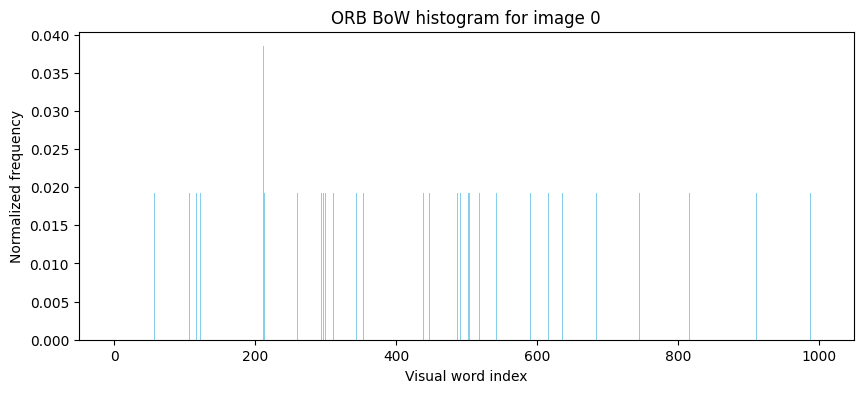

In [172]:
# Pick an image index to visualize
img_idx = 0

# ORB histogram
hist = orb_histograms[img_idx]

plt.figure(figsize=(10, 4))
plt.bar(range(len(hist)), hist, color='skyblue')
plt.title(f"ORB BoW histogram for image {img_idx}")
plt.xlabel("Visual word index")
plt.ylabel("Normalized frequency")
plt.show()


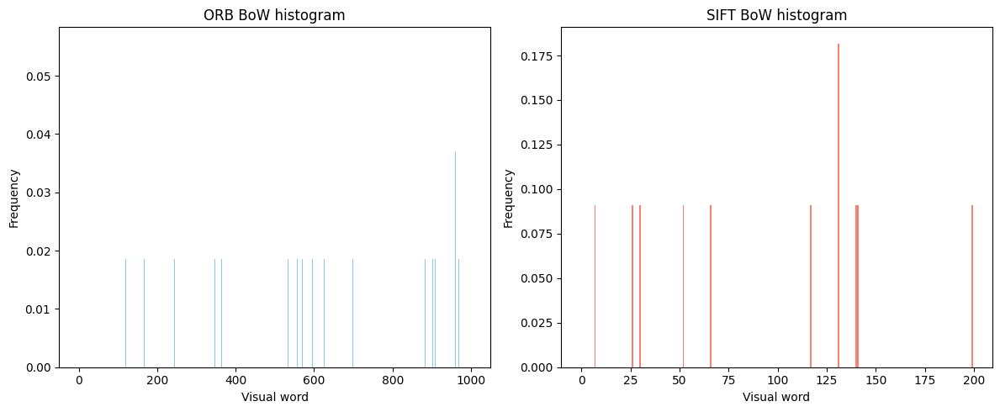

In [173]:
img_idx = 200

plt.figure(figsize=(12, 5))

# ORB
plt.subplot(1, 2, 1)
plt.bar(range(len(orb_histograms[img_idx])), orb_histograms[img_idx], color='skyblue')
plt.title("ORB BoW histogram")
plt.xlabel("Visual word")
plt.ylabel("Frequency")

# SIFT
plt.subplot(1, 2, 2)
plt.bar(range(len(sift_histograms[img_idx])), sift_histograms[img_idx], color='salmon')
plt.title("SIFT BoW histogram")
plt.xlabel("Visual word")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()


<a id="section-5"></a>
### **Section 5: Visualizing the Bag of Visual Words for Each Class (3 points)**

In this section, the task is to visualize the Bag of Visual Words for each class using the histograms generated in the previous step. The goal is to plot the mean histogram of visual words for each class, showing the distribution of visual words across the different categories in the training set.

Use the two different extraction techniques you implemented for this visualization. For each technique, calculate the mean histogram for each class and create a bar plot to display these histograms. Ensure that the plots are labeled clearly with the class names and feature descriptor types.

In [174]:
# YOUR CODE HERE
num_classes = len(class_names)

# ORB mean histograms
orb_mean_hist = np.zeros((num_classes, orb_histograms.shape[1]), dtype=np.float32)
for c in range(num_classes):
    idxs = np.where(train_labels.numpy() == c)[0]  # indices of images in class c
    orb_mean_hist[c] = orb_histograms[idxs].mean(axis=0)

# SIFT mean histograms
sift_mean_hist = np.zeros((num_classes, sift_histograms.shape[1]), dtype=np.float32)
for c in range(num_classes):
    idxs = np.where(train_labels.numpy() == c)[0]
    sift_mean_hist[c] = sift_histograms[idxs].mean(axis=0)


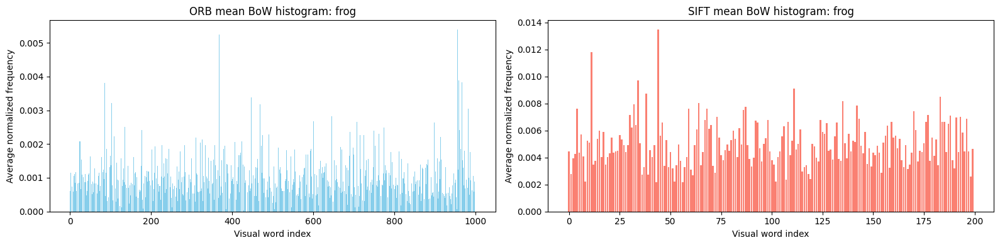

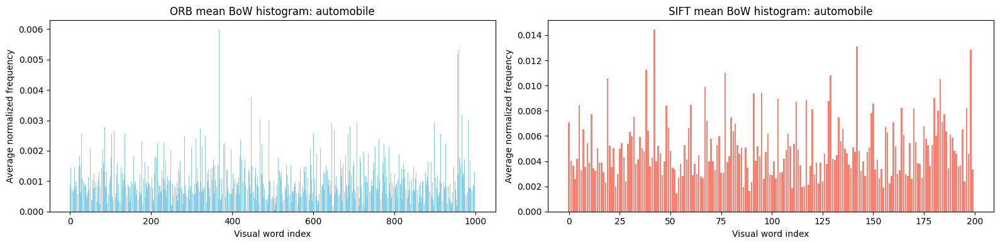

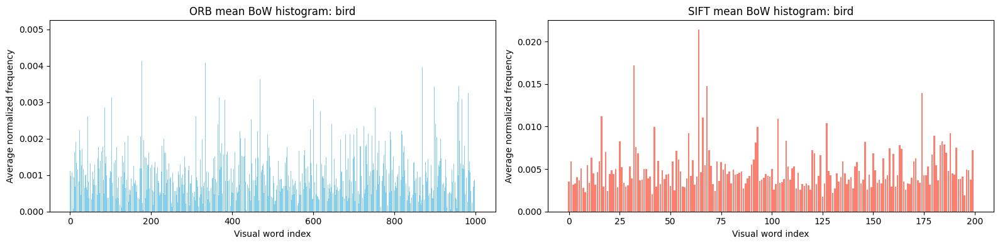

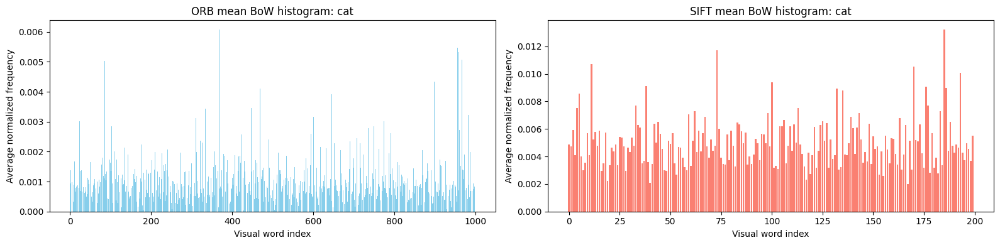

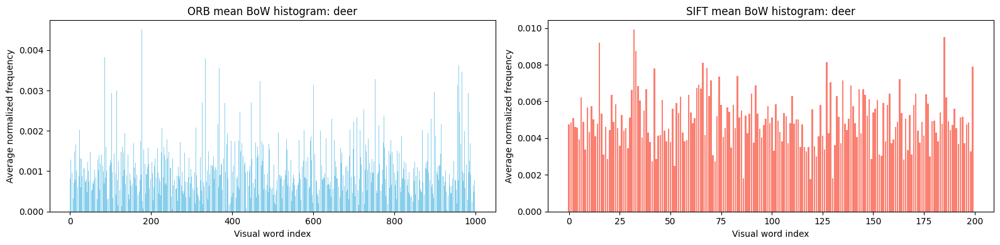

In [175]:
for c in range(num_classes):
    plt.figure(figsize=(16, 4))

    # ORB subplot
    plt.subplot(1, 2, 1)
    plt.bar(range(orb_mean_hist.shape[1]), orb_mean_hist[c], color='skyblue')
    plt.title(f"ORB mean BoW histogram: {class_names[c]}")
    plt.xlabel("Visual word index")
    plt.ylabel("Average normalized frequency")

    # SIFT subplot
    plt.subplot(1, 2, 2)
    plt.bar(range(sift_mean_hist.shape[1]), sift_mean_hist[c], color='salmon')
    plt.title(f"SIFT mean BoW histogram: {class_names[c]}")
    plt.xlabel("Visual word index")
    plt.ylabel("Average normalized frequency")

    plt.tight_layout()
    plt.show()


<a id="section-6"></a>
### **Section 6: Encoding Test Image Features (0 points)**

In this section, the task is to encode the test image features using the visual vocabulary created from the training set. Similar to the previous encoding step, each test image will be represented as a histogram of visual words, which will then be used for evaluating classification performance.

Use the same two feature extraction techniques you selected earlier. Extract keypoints and descriptors for the test images, then encode these images using the visual vocabulary. This will allow you to compare the encoded features of test images against those of the training set.

**Hint:** Reuse the functions developed earlier for extracting keypoints, descriptors, and encoding images. Ensure that you use the visual vocabulary constructed with the training images for consistency.

In [101]:
# # YOUR CODE HERE
# orb_test_histograms = []
# sift_test_histograms = []

# for img in test_images:
#     # ORB
#     _, _, desc_orb = extract_orb(img, orb)
#     hist_orb = encode_image(desc_orb, orb_index, num_clusters_orb)
#     orb_test_histograms.append(hist_orb)

#     # SIFT
#     _, _, desc_sift = extract_sift(img, sift)
#     hist_sift = encode_image(desc_sift, sift_index, num_clusters_sift)
#     sift_test_histograms.append(hist_sift)

# # Convert to numpy arrays
# orb_test_histograms = np.array(orb_test_histograms)  # shape [num_test_images, num_clusters_orb]
# sift_test_histograms = np.array(sift_test_histograms)  # shape [num_test_images, num_clusters_sift]

# print("ORB test histograms:", orb_test_histograms.shape)
# print("SIFT test histograms:", sift_test_histograms.shape)



ORB test histograms: (1000, 200)
SIFT test histograms: (1000, 200)


In [176]:
orb_test_histograms, sift_test_histograms = build_visual_vocabulary_histograms(
    test_images,
    orb_kmeans,
    sift_kmeans,
    orb,
    sift
)

ORB histograms shape: (1000, 1000)
SIFT histograms shape: (1000, 200)


<a id="section-7"></a>
### **Section 7: Training the Classifiers (5 points)**

In this section, the task is to create two one-vs-rest (OvR) SVM classifiers using the 50% of the training data that was **not** used for creating the visual dictionary. This ensures that the classifiers are trained on a different subset of data, providing a more robust evaluation of the visual vocabulary's effectiveness.

For each of the two selected feature extraction techniques, create one-vs-rest classifiers for all classes. For now, use default parameter values when training the classifiers; you will experiment with different hyperparameters in later steps.

**Note:** Training an OvR classifier can take around 5 to 7 minutes. Therefore, it's advisable to first test your code with a smaller subset of the training data to verify that your implementation works correctly before running it on the full dataset.

In [178]:
from sklearn.svm import SVC
import numpy as np

def train_orb_sift_svm(orb_histograms, sift_histograms, train_labels, svm_indices):
    """
    Train one-vs-rest SVM classifiers for ORB and SIFT histograms.

    Args:
        orb_histograms: NumPy array of ORB histograms [num_images, num_clusters_orb]
        sift_histograms: NumPy array of SIFT histograms [num_images, num_clusters_sift]
        train_labels: Tensor or array of training labels
        svm_indices: indices of images to use for SVM training

    Returns:
        orb_svm: trained SVM on ORB features
        sift_svm: trained SVM on SIFT features
    """
    # Extract features and labels for SVM training
    X_orb_svm = orb_histograms[svm_indices]
    X_sift_svm = sift_histograms[svm_indices]
    y_svm = train_labels.numpy()[svm_indices]

    # Train ORB SVM
    orb_svm = SVC(kernel='linear', decision_function_shape='ovr', probability=True)
    orb_svm.fit(X_orb_svm, y_svm)

    # Train SIFT SVM
    sift_svm = SVC(kernel='linear', decision_function_shape='ovr', probability=True)
    sift_svm.fit(X_sift_svm, y_svm)

    print("ORB SVM trained on one-vs-rest.")
    print("SIFT SVM trained on one-vs-rest.")

    return orb_svm, sift_svm


In [179]:
orb_svm, sift_svm = train_orb_sift_svm(orb_histograms,
                                       sift_histograms,
                                       train_labels,
                                       svm_indices)

ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.


In [ ]:
# from sklearn.svm import SVC
# # YOUR CODE HERE
# # Extract features for this subset
# X_orb_svm = orb_histograms[svm_indices]
# X_sift_svm = sift_histograms[svm_indices]

# y_svm = train_labels.numpy()[svm_indices]

# # ORB SVM
# orb_svm = SVC(kernel='linear', decision_function_shape='ovr', probability=True)
# orb_svm.fit(X_orb_svm, y_svm)

# # SIFT SVM
# sift_svm = SVC(kernel='linear', decision_function_shape='ovr', probability=True)
# sift_svm.fit(X_sift_svm, y_svm)

# print("ORB SVM trained on one-vs-rest.")
# print("SIFT SVM trained on one-vs-rest.")

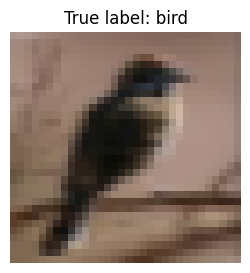

ORB prediction: automobile
SIFT prediction: bird


In [249]:
# this is just for you to see how well it is training

# 1️⃣ Choose a random test image
img_idx = np.random.randint(0, len(test_images))
img = test_images[img_idx].numpy()
true_label = class_names[test_labels[img_idx].item()]

# 2️⃣ Display the image
plt.figure(figsize=(3, 3))
plt.imshow((img * 0.5 + 0.5).clip(0,1))  # unnormalize
plt.title(f"True label: {true_label}")
plt.axis('off')
plt.show()

# 3️⃣ Predict with ORB SVM
orb_pred_idx = orb_svm.predict(orb_test_histograms[img_idx:img_idx+1])[0]
orb_pred_label = class_names[orb_pred_idx]

# 4️⃣ Predict with SIFT SVM
sift_pred_idx = sift_svm.predict(sift_test_histograms[img_idx:img_idx+1])[0]
sift_pred_label = class_names[sift_pred_idx]

# 5️⃣ Print predictions
print(f"ORB prediction: {orb_pred_label}")
print(f"SIFT prediction: {sift_pred_label}")


<a id="section-8"></a>
### **Section 8: Evaluating the Classifiers (12 points)**

In this section, you will evaluate the performance of your one-vs-rest (OvR) SVM classifiers on the test data. The goal is to classify each test image using each binary classifier and rank the images based on the classification scores, resulting in a ranked list of images for each class. Ideally, images belonging to the target class should appear at the top of the respective list. To conduct this evaluation, use the test image histograms generated earlier for the two selected feature extraction techniques. Classify each test image with each classifier, rank them based on their confidence scores, and then compute the Mean Average Precision (mAP) across all classes. The mAP for a single class $c$ is defined as:

$
\text{mAP}_c = \frac{1}{m_c} \sum_{i=1}^{n} \frac{f_c(x_i)}{i}
$

where:
- $n$ is the total number of images ($n = 50 \times 5 = 250$),
- $m_c$ is the number of images of class $c$ ($m_c = 50$),
- $x_i$ is the $i^{th}$ image in the ranked list $X = \{ x_1, x_2, \dots, x_n \}$,
- $f_c$ is a function that returns the number of images of class $c$ in the first $i$ images if $x_i$ is of class $c$, and 0 otherwise.

For instance, if you are retrieving images of class "R" and the sequence of ranked images is $[R, R, T, R, T, T, R, T]$, then $n = 8$, $m_c = 4$, and:

$
AP = \frac{1}{4} \left( \frac{1}{1} + \frac{2}{2} + \frac{0}{3} + \frac{3}{4} + \frac{0}{5} + \frac{0}{6} + \frac{4}{7} + \frac{0}{8} \right).
$

In addition to the quantitative analysis, perform a qualitative analysis by visualizing the top-5 and bottom-5 ranked test images.

In [231]:
def compute_svm_rankings(orb_svm, sift_svm, orb_test_histograms, sift_test_histograms, class_names, test_labels):
    """
    Evaluate one-vs-rest SVMs on test histograms and produce ranked image lists per class.

    Args:
        orb_svm: trained SVM on ORB histograms
        sift_svm: trained SVM on SIFT histograms
        orb_test_histograms: NumPy array of ORB histograms for test images [num_test_images, num_clusters_orb]
        sift_test_histograms: NumPy array of SIFT histograms for test images [num_test_images, num_clusters_sift]
        class_names: list of class names
        test_labels: tensor or array of true labels for test images

    Returns:
        orb_rankings: dict mapping class_name -> list of test indices ranked by confidence (ORB)
        sift_rankings: dict mapping class_name -> list of test indices ranked by confidence (SIFT)
    """
    # Convert test labels to numpy
    y_true = test_labels.numpy()

    # --- ORB Evaluation ---
    orb_scores = orb_svm.decision_function(orb_test_histograms)  # [num_images, num_classes]
    orb_rankings = {}
    for c, class_name in enumerate(class_names):
        scores_c = orb_scores[:, c]
        ranked_indices = np.argsort(scores_c)[::-1]  # descending order
        orb_rankings[class_name] = ranked_indices

    # --- SIFT Evaluation ---
    sift_scores = sift_svm.decision_function(sift_test_histograms)  # [num_images, num_classes]
    sift_rankings = {}
    for c, class_name in enumerate(class_names):
        scores_c = sift_scores[:, c]
        ranked_indices = np.argsort(scores_c)[::-1]
        sift_rankings[class_name] = ranked_indices

    return y_true, orb_rankings, sift_rankings


In [ ]:
y_true, orb_rankings, sift_rankings = compute_svm_rankings(orb_svm,
                                                           sift_svm,
                                                           orb_test_histograms,
                                                           sift_test_histograms,
                                                           class_names,
                                                           test_labels)

In [ ]:
# # YOUR CODE HERE

# # Convert test labels to numpy
# y_true = test_labels.numpy()

# # --- ORB Evaluation ---
# orb_scores = orb_svm.decision_function(orb_test_histograms)  # shape: [num_images, num_classes]

# # Rank images for each class based on classifier confidence
# orb_rankings = {}
# for c, class_name in enumerate(class_names):
#     scores_c = orb_scores[:, c]
#     ranked_indices = np.argsort(scores_c)[::-1]  # descending order
#     orb_rankings[class_name] = ranked_indices

# # --- SIFT Evaluation ---
# sift_scores = sift_svm.decision_function(sift_test_histograms)

# sift_rankings = {}
# for c, class_name in enumerate(class_names):
#     scores_c = sift_scores[:, c]
#     ranked_indices = np.argsort(scores_c)[::-1]
#     sift_rankings[class_name] = ranked_indices


In [218]:
def compute_map_c(class_label, y_true, sift_rankings, orb_rankings, class_names):
    """
    Compute the Average Precision (AP) for a single class for SIFT and ORB rankings.

    Args:
        class_label (str): The class name to evaluate.
        y_true (np.ndarray): True labels of test images (integers).
        sift_rankings (dict): Ranked indices for each class from SIFT.
        orb_rankings (dict): Ranked indices for each class from ORB.
        class_names (list): List of class names to map string -> int.

    Returns:
        ap_sift (float), ap_orb (float)
    """
    class_idx = class_names.index(class_label)
    n_images = len(y_true)

    # --- Helper function to compute AP given ranked indices ---
    def average_precision(ranked_indices):
        mc = np.sum(y_true == class_idx)  # number of relevant images
        if mc == 0:
            return 0.0
        count = 0
        sum_ap = 0.0
        for i, idx in enumerate(ranked_indices, start=1):  # 1-based indexing
            if y_true[idx] == class_idx:
                count += 1
                sum_ap += count / i
        return sum_ap / mc

    ap_sift = average_precision(sift_rankings[class_label])
    ap_orb = average_precision(orb_rankings[class_label])
    return ap_sift, ap_orb


In [229]:
for label in class_names:
    ap_sift, ap_orb = compute_map_c(label, y_true, sift_rankings, orb_rankings, class_names)
    print(f"Class: {label}")
    print(f"  SIFT AP: {ap_sift:.4f}")
    print(f"  ORB AP : {ap_orb:.4f}")
    print("-" * 40)


Class: frog
  SIFT AP: 0.2544
  ORB AP : 0.2644
----------------------------------------
Class: automobile
  SIFT AP: 0.4400
  ORB AP : 0.3275
----------------------------------------
Class: bird
  SIFT AP: 0.3838
  ORB AP : 0.3502
----------------------------------------
Class: cat
  SIFT AP: 0.2519
  ORB AP : 0.2745
----------------------------------------
Class: deer
  SIFT AP: 0.2845
  ORB AP : 0.2951
----------------------------------------


In [240]:
def plot_top_bottom_ranked_images(target_class, class_names, orb_rankings, sift_rankings, test_images, top_k=5):
    """
    Plots top and bottom ranked images for a given class using ORB and SIFT rankings.

    Args:
        target_class (str): Class name to visualize.
        class_names (list of str): List of all class names.
        orb_rankings (dict): Dictionary mapping class index to ranked indices (ORB).
        sift_rankings (dict): Dictionary mapping class index to ranked indices (SIFT).
        test_images (list or tensor): List/tensor of images.
        top_k (int, optional): Number of top/bottom images to display. Defaults to 5.
    """
    
    #class_idx = class_names.index(target_class)

    # ---- ORB ----
    orb_top_indices = orb_rankings[target_class][:top_k]
    orb_bottom_indices = orb_rankings[target_class][-top_k:]

    # ---- SIFT ----
    sift_top_indices = sift_rankings[target_class][:top_k]
    sift_bottom_indices = sift_rankings[target_class][-top_k:]

    fig, axes = plt.subplots(4, top_k, figsize=(15, 8))
    fig.suptitle(f"Top and Bottom {top_k} Ranked Images for Class '{target_class}' (ORB vs SIFT)", fontsize=16)

    # Helper function to plot images
    def plot_images(indices, row, method_name):
        for i, idx in enumerate(indices):
            img = test_images[idx].numpy() if hasattr(test_images[idx], "numpy") else test_images[idx]
            img = (img * 0.5 + 0.5).clip(0, 1)  # normalize if in [-1, 1]
            axes[row, i].imshow(img)
            axes[row, i].set_title(f"{method_name} {i+1}", fontsize=10)
            axes[row, i].axis("off")

    plot_images(orb_top_indices, 0, "ORB Top")
    plot_images(orb_bottom_indices, 1, "ORB Bottom")
    plot_images(sift_top_indices, 2, "SIFT Top")
    plot_images(sift_bottom_indices, 3, "SIFT Bottom")

    plt.tight_layout()
    plt.show()


In [ ]:
# # YOUR CODE HERE

# # Convert test labels to numpy
# y_true = test_labels.numpy()

# # --- ORB Evaluation ---
# orb_scores = orb_svm.decision_function(orb_test_histograms)  # shape: [num_images, num_classes]

# # Rank images for each class based on classifier confidence
# orb_rankings = {}
# for c, class_name in enumerate(class_names):
#     scores_c = orb_scores[:, c]
#     ranked_indices = np.argsort(scores_c)[::-1]  # descending order
#     orb_rankings[class_name] = ranked_indices

# # --- SIFT Evaluation ---
# sift_scores = sift_svm.decision_function(sift_test_histograms)

# sift_rankings = {}
# for c, class_name in enumerate(class_names):
#     scores_c = sift_scores[:, c]
#     ranked_indices = np.argsort(scores_c)[::-1]
#     sift_rankings[class_name] = ranked_indices





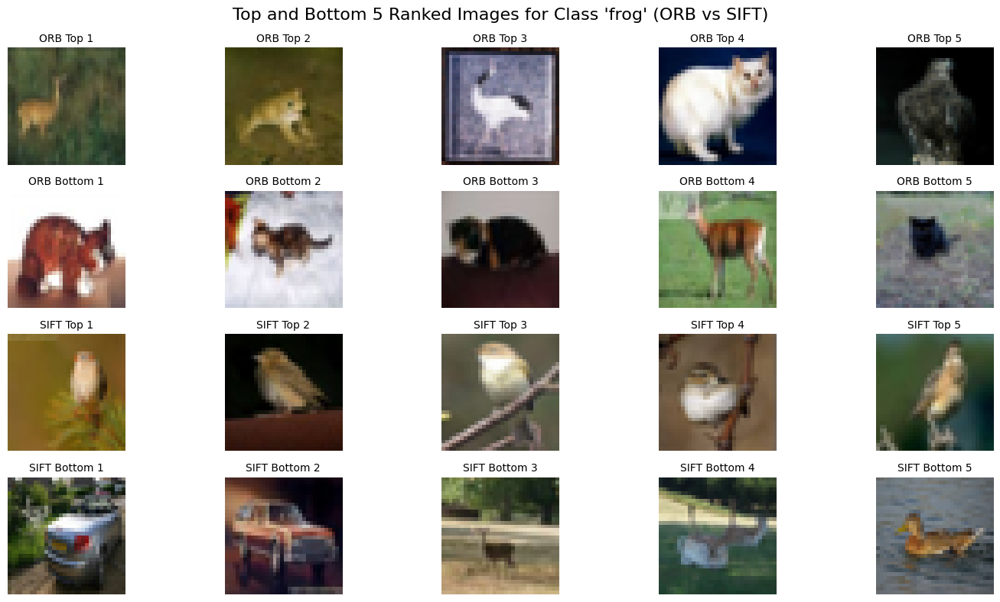

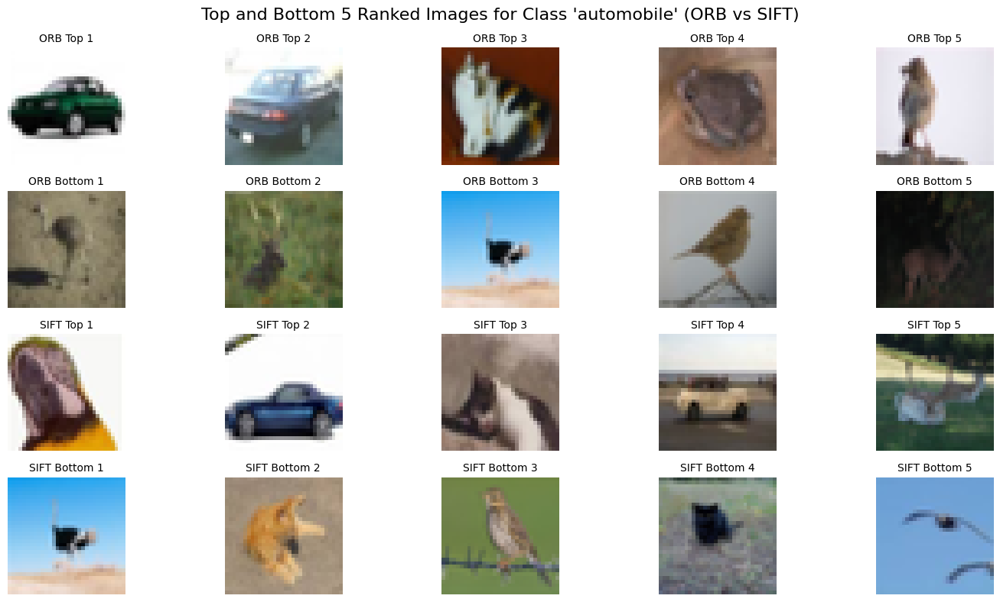

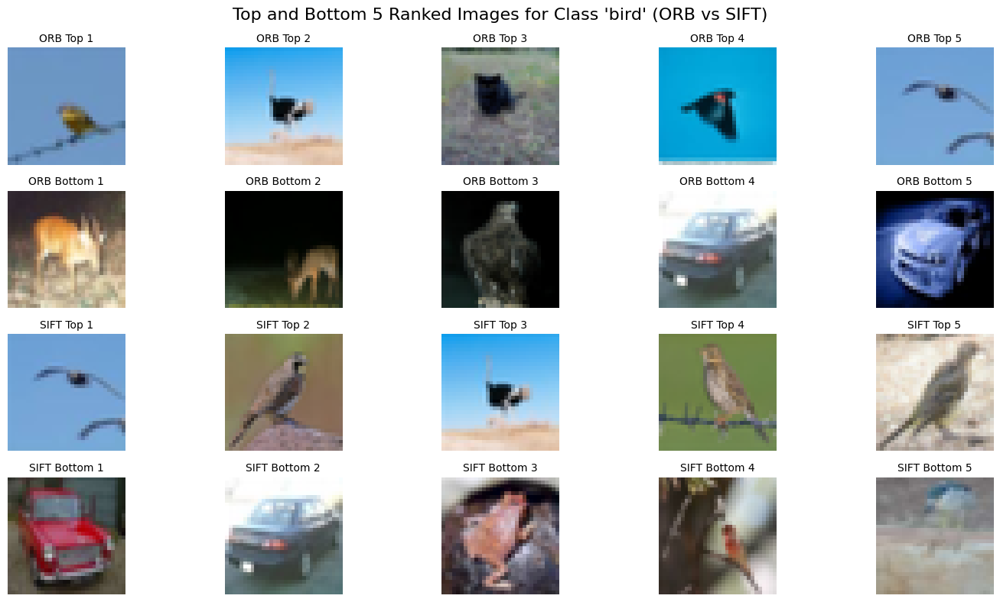

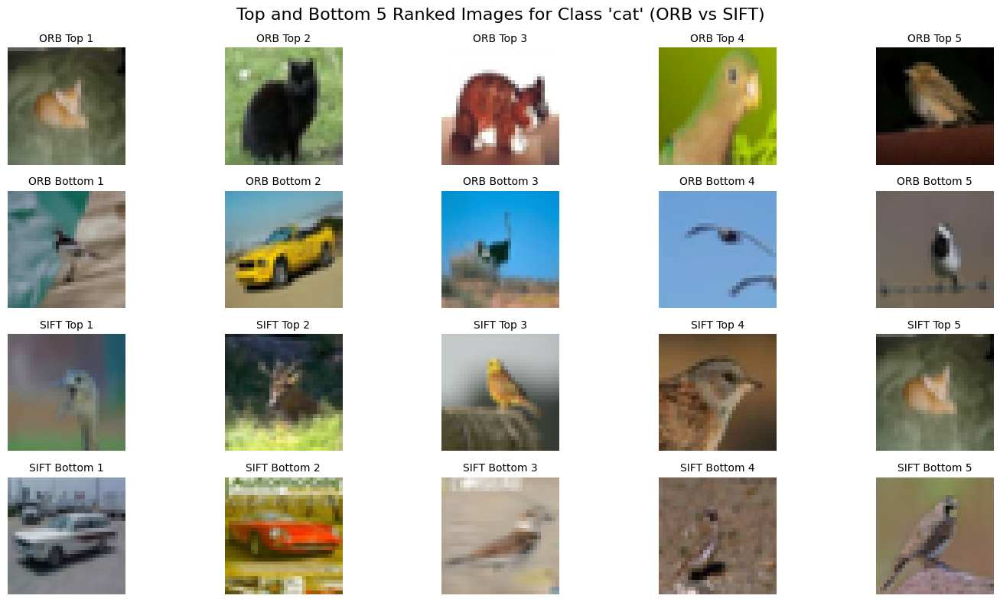

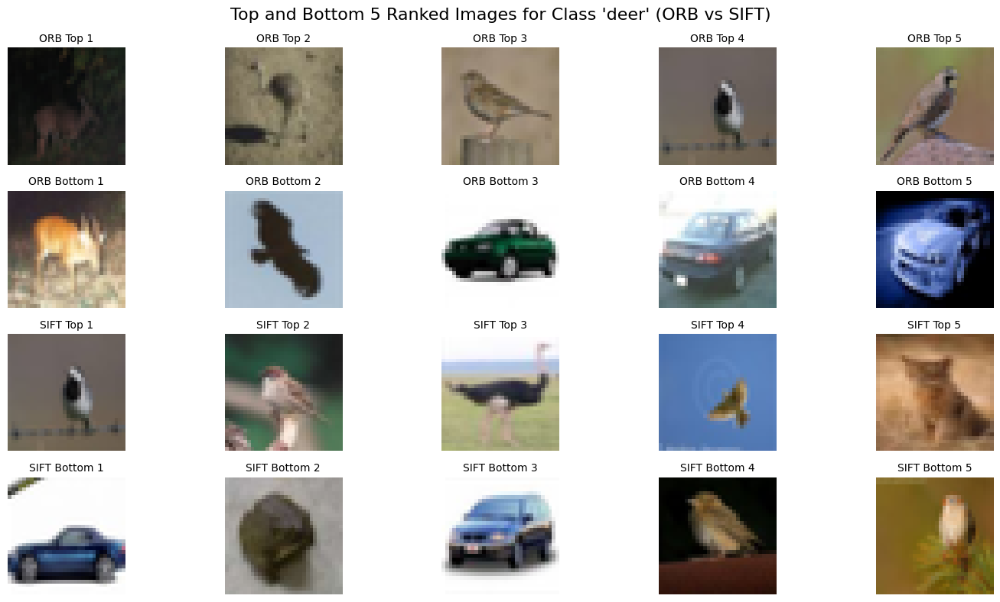

In [242]:
for target_class in class_names:
    plot_top_bottom_ranked_images(target_class, class_names, orb_rankings, sift_rankings, test_images, top_k=5)

0


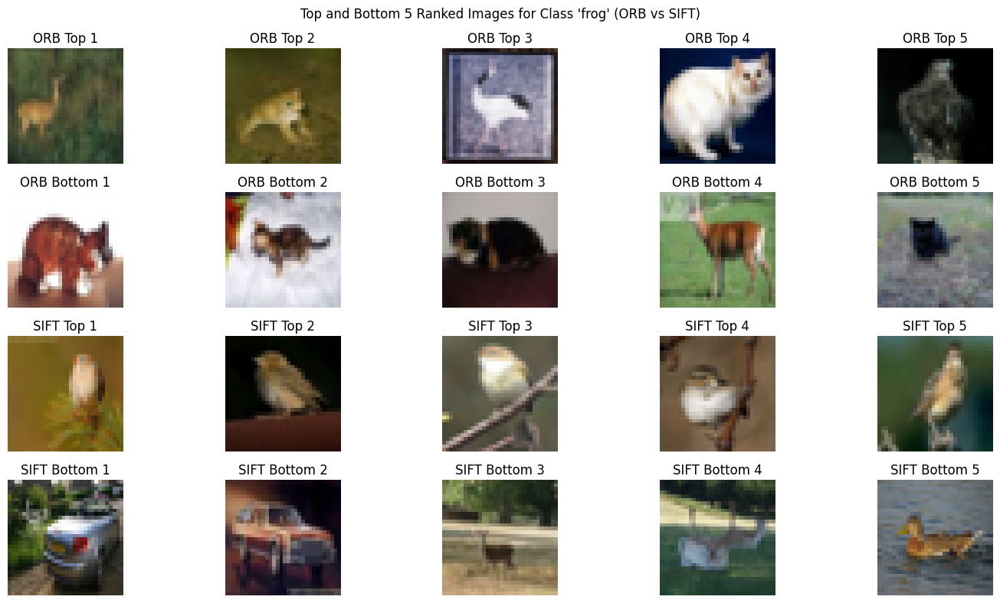

In [238]:
# # --- Example visualization: Top 5 images for one class ---
# target_class = "frog"  # pick any class
# class_idx = class_names.index(target_class)
# print(class_idx)
# top_k = 5

# # ---- ORB ----
# orb_top_indices = orb_rankings[target_class][:top_k]
# orb_bottom_indices = orb_rankings[target_class][-top_k:]

# # ---- SIFT ----
# sift_top_indices = sift_rankings[target_class][:top_k]
# sift_bottom_indices = sift_rankings[target_class][-top_k:]

# fig, axes = plt.subplots(4, top_k, figsize=(15, 8))
# fig.suptitle(f"Top and Bottom {top_k} Ranked Images for Class '{target_class}' (ORB vs SIFT)")

# # ORB top
# for i, idx in enumerate(orb_top_indices):
#     img = test_images[idx].numpy()
#     img = (img * 0.5 + 0.5).clip(0, 1)
#     axes[0, i].imshow(img)
#     axes[0, i].set_title(f"ORB Top {i+1}")
#     axes[0, i].axis("off")

# # ORB bottom
# for i, idx in enumerate(orb_bottom_indices):
#     img = test_images[idx].numpy()
#     img = (img * 0.5 + 0.5).clip(0, 1)
#     axes[1, i].imshow(img)
#     axes[1, i].set_title(f"ORB Bottom {i+1}")
#     axes[1, i].axis("off")

# # SIFT top
# for i, idx in enumerate(sift_top_indices):
#     img = test_images[idx].numpy()
#     img = (img * 0.5 + 0.5).clip(0, 1)
#     axes[2, i].imshow(img)
#     axes[2, i].set_title(f"SIFT Top {i+1}")
#     axes[2, i].axis("off")

# # SIFT bottom
# for i, idx in enumerate(sift_bottom_indices):
#     img = test_images[idx].numpy()
#     img = (img * 0.5 + 0.5).clip(0, 1)
#     axes[3, i].imshow(img)
#     axes[3, i].set_title(f"SIFT Bottom {i+1}")
#     axes[3, i].axis("off")

# plt.tight_layout()
# plt.show()


<a id="section-9"></a>
### **Section 9: Hyperparameter Search (16 points)**

In this section, the task is to perform an extensive hyperparameter search to optimize the performance of your classifiers. You will experiment with various parameters, including the number of visual words (e.g., 500, 1000, 1500), different training subset sizes (e.g., 30%, 40%, 50%), SVM parameters (e.g., kernel types like 'linear' or 'rbf', regularization parameter $C$ values such as 0.1, 1, 10, and gamma settings like 'scale' or specific values such as 0.01, 0.001), and settings of the feature extractors (e.g., the number of keypoints or scale levels). Start by testing your code on the smallest subset to ensure it functions correctly before proceeding with a full hyperparameter search. Once validated, conduct the search using larger subsets and systematically iterate through the different parameter combinations, potentially using nested loops or grid search. Be sure to record the performance results for each combination to identify the best settings based on metrics like the Mean Average Precision (mAP).

In [252]:
copy_train_images = train_images
copy_train_labels = train_labels

In [253]:

train_images = train_images[:500]
train_labels = train_labels[:500]

In [270]:
# --- ORB variants ---
orbs = [
    # Original ORB 1
    cv2.ORB_create(
        nfeatures=100,
        scaleFactor=1.2,
        nlevels=3,
        edgeThreshold=5,
        firstLevel=0,
        WTA_K=2,
        scoreType=cv2.ORB_HARRIS_SCORE,
        patchSize=8,
        fastThreshold=25
    ),
    # Original ORB 2
    cv2.ORB_create(
        nfeatures=100,
        scaleFactor=1.2,
        nlevels=3,
        edgeThreshold=8,
        firstLevel=0,
        WTA_K=3,
        scoreType=cv2.ORB_HARRIS_SCORE,
        patchSize=8,
        fastThreshold=25
    ),
    # New ORB 3: more features, larger patch, fewer pyramid levels
    cv2.ORB_create(
        nfeatures=150,
        scaleFactor=1.1,
        nlevels=2,
        edgeThreshold=4,
        firstLevel=0,
        WTA_K=2,
        scoreType=cv2.ORB_HARRIS_SCORE,
        patchSize=12,
        fastThreshold=20
    ),
]

# --- SIFT variants ---
sifts = [
    # Original SIFT 1
    cv2.SIFT_create(nfeatures=100),
    # Original SIFT 2
    cv2.SIFT_create(
        nfeatures=150,
        contrastThreshold=0.003,
        edgeThreshold=3,
        sigma=0.6
    ),
    # New SIFT 3: more sensitive to low contrast (good for small images)
    cv2.SIFT_create(
        nfeatures=150,
        contrastThreshold=0.001,
        edgeThreshold=2,
        sigma=1.0
    )
]

# Optional: print counts
print(f"Total ORB variants: {len(orbs)}")
print(f"Total SIFT variants: {len(sifts)}")


Total ORB variants: 3
Total SIFT variants: 3


Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (5069, 32)
Average ORB descriptors per image: 34.25
SIFT descriptors shape: (1850, 128)
Average SIFT descriptors per image: 12.50
Clustering 5069 points in 32D to 25 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 (0.01 s, search 0.01 s): objective=2.24796e+08 imbalance=1.145 nsplit=0       
Clustering 1850 points in 128D to 200 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s


WARNING clustering 1850 points to 200 centroids: please provide at least 7800 training points


  Iteration 19 (0.04 s, search 0.03 s): objective=1.36862e+08 imbalance=1.359 nsplit=0       


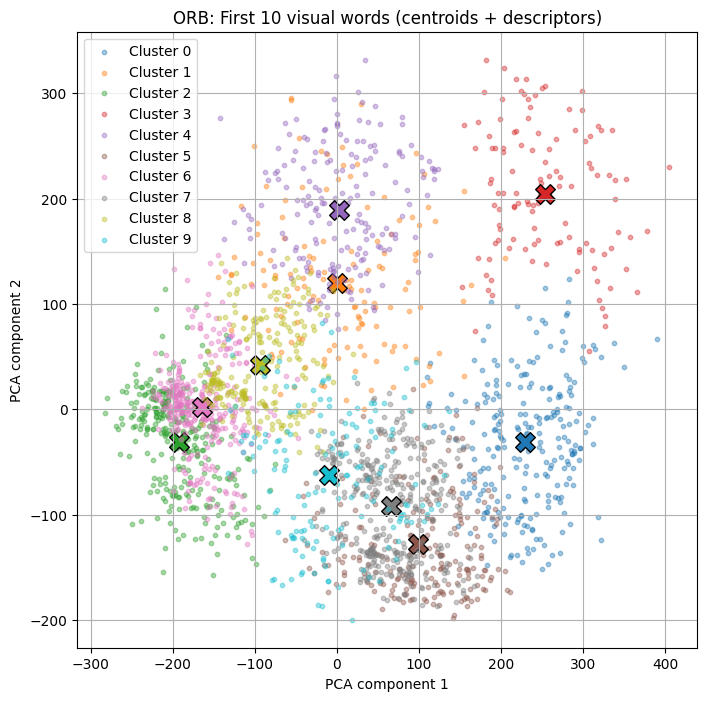

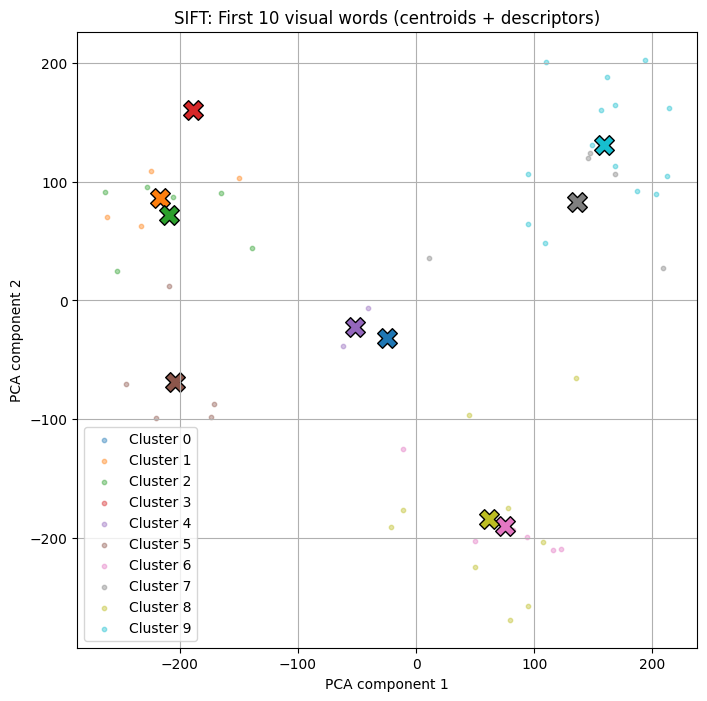

ORB histograms shape: (500, 25)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 25)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2310
  ORB AP : 0.2469
----------------------------------------
Class: automobile
  SIFT AP: 0.3627
  ORB AP : 0.2646
----------------------------------------
Class: bird
  SIFT AP: 0.3632
  ORB AP : 0.3240
----------------------------------------
Class: cat
  SIFT AP: 0.2310
  ORB AP : 0.2358
----------------------------------------
Class: deer
  SIFT AP: 0.2364
  ORB AP : 0.2713
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (6805, 32)
Average ORB descriptors per image: 34.37
SIFT descriptors shape: (2481, 128)
Average SIFT descriptors per image: 12.53
Sampling a subset of 6400 / 6805 for training
Clustering 6400 points in 32D to 25 clusters, redo 1 times, 20 iterat

WARNING clustering 2481 points to 200 centroids: please provide at least 7800 training points


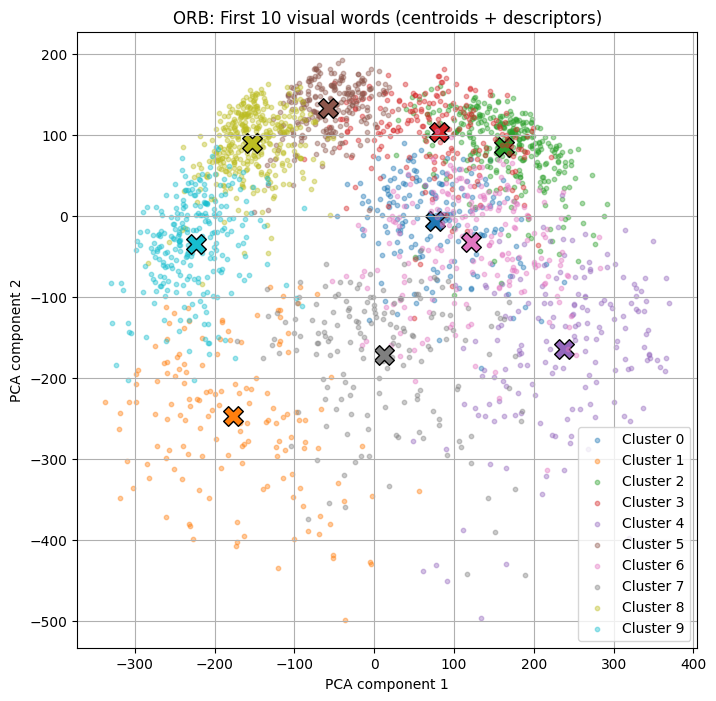

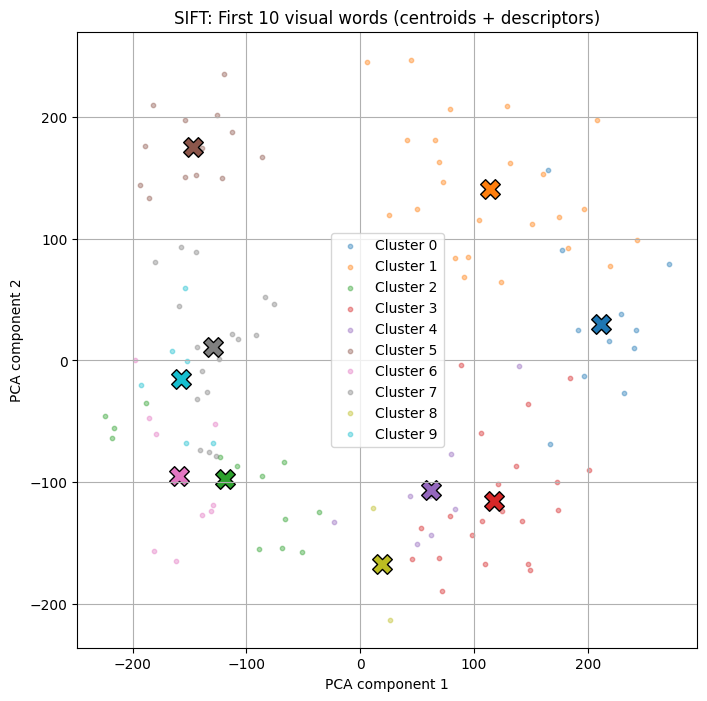

ORB histograms shape: (500, 25)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 25)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2395
  ORB AP : 0.2383
----------------------------------------
Class: automobile
  SIFT AP: 0.4231
  ORB AP : 0.2526
----------------------------------------
Class: bird
  SIFT AP: 0.3395
  ORB AP : 0.3101
----------------------------------------
Class: cat
  SIFT AP: 0.2381
  ORB AP : 0.2516
----------------------------------------
Class: deer
  SIFT AP: 0.2206
  ORB AP : 0.1819
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (8335, 32)
Average ORB descriptors per image: 33.47
SIFT descriptors shape: (3117, 128)
Average SIFT descriptors per image: 12.52
Sampling a subset of 6400 / 8335 for training
Clustering 6400 points in 32D to 25 clusters, redo 1 times, 20 iterat

WARNING clustering 3117 points to 200 centroids: please provide at least 7800 training points


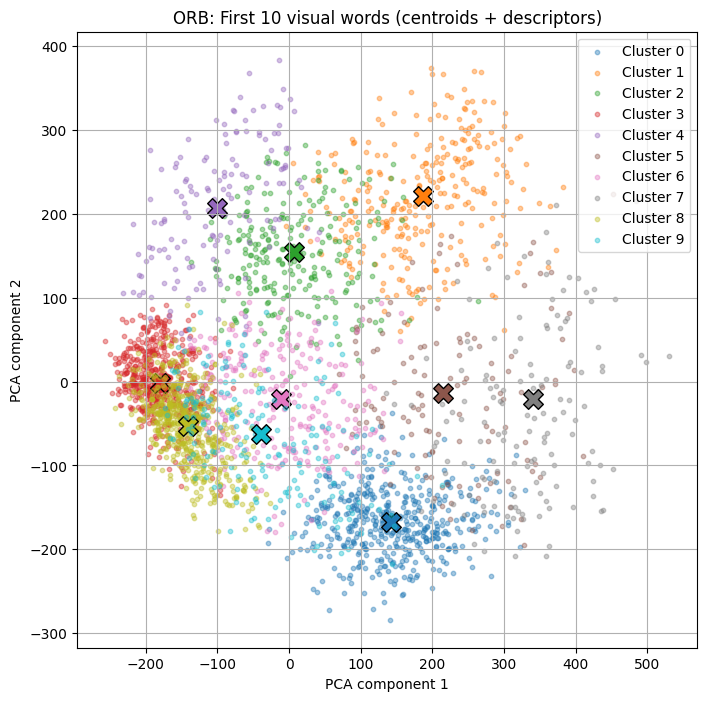

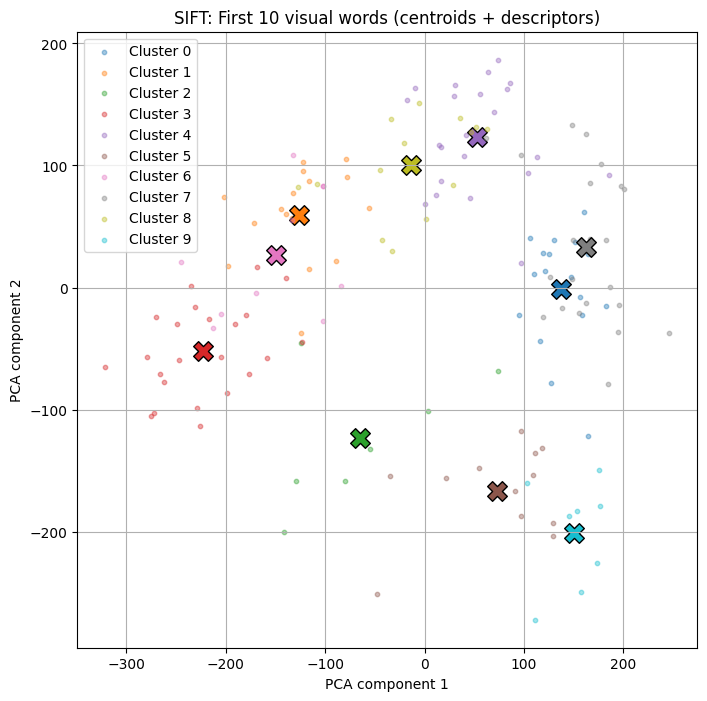

ORB histograms shape: (500, 25)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 25)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2672
  ORB AP : 0.2690
----------------------------------------
Class: automobile
  SIFT AP: 0.3526
  ORB AP : 0.2519
----------------------------------------
Class: bird
  SIFT AP: 0.3313
  ORB AP : 0.2771
----------------------------------------
Class: cat
  SIFT AP: 0.2347
  ORB AP : 0.1981
----------------------------------------
Class: deer
  SIFT AP: 0.1935
  ORB AP : 0.1849
----------------------------------------
Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (2511, 32)
Average ORB descriptors per image: 16.97
SIFT descriptors shape: (8269, 128)
Average SIFT descriptors per image: 55.87
Clustering 2511 points in 32D to 25 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

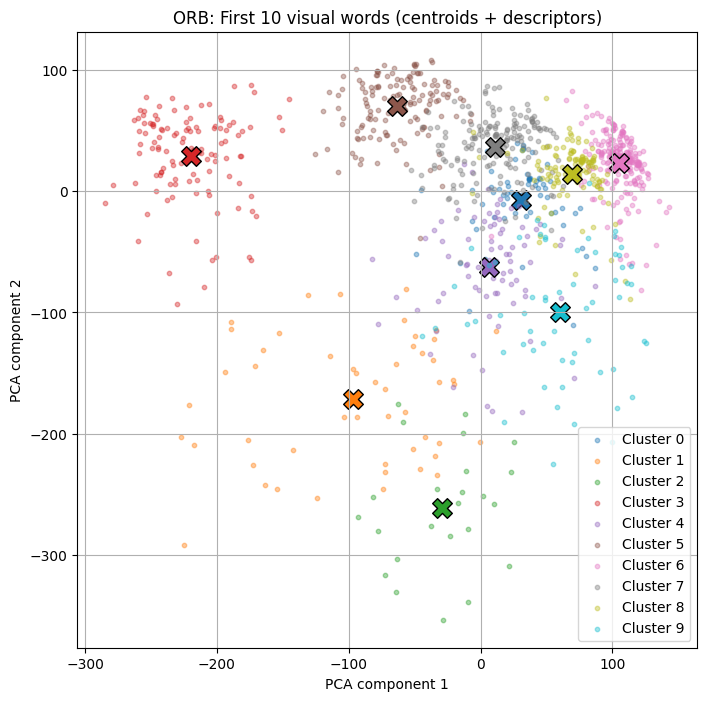

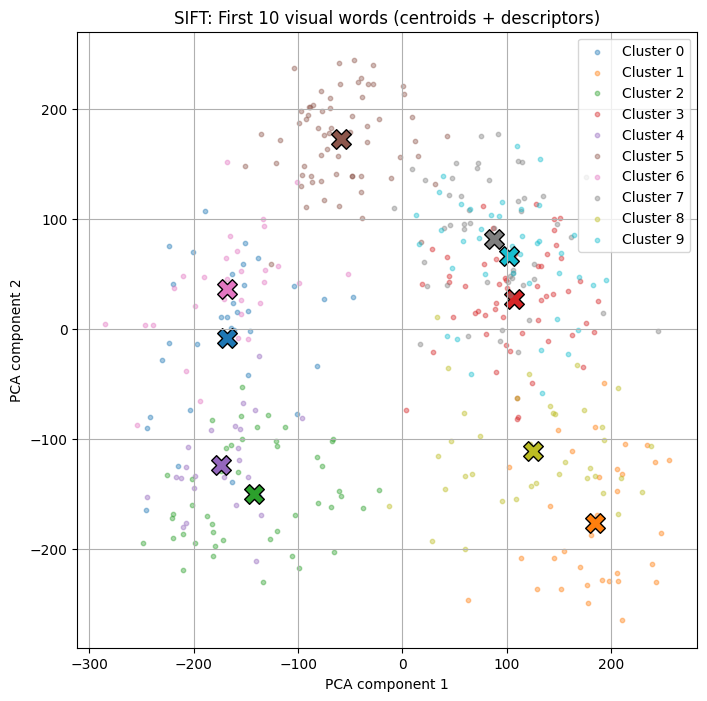

ORB histograms shape: (500, 25)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 25)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2827
  ORB AP : 0.2579
----------------------------------------
Class: automobile
  SIFT AP: 0.3696
  ORB AP : 0.2631
----------------------------------------
Class: bird
  SIFT AP: 0.3586
  ORB AP : 0.2728
----------------------------------------
Class: cat
  SIFT AP: 0.2551
  ORB AP : 0.2034
----------------------------------------
Class: deer
  SIFT AP: 0.2163
  ORB AP : 0.2253
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (3351, 32)
Average ORB descriptors per image: 16.92
SIFT descriptors shape: (11578, 128)
Average SIFT descriptors per image: 58.47
Clustering 3351 points in 32D to 25 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19

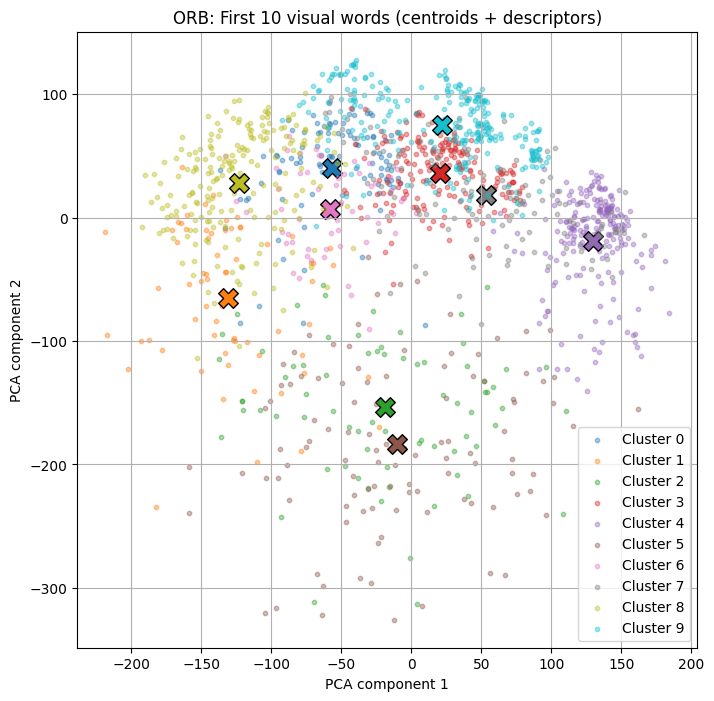

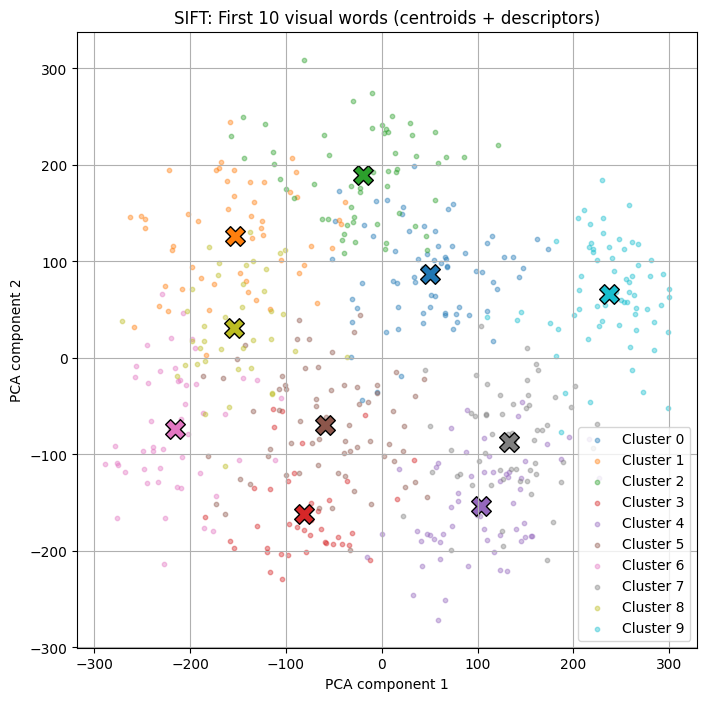

ORB histograms shape: (500, 25)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 25)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2704
  ORB AP : 0.2654
----------------------------------------
Class: automobile
  SIFT AP: 0.3766
  ORB AP : 0.2601
----------------------------------------
Class: bird
  SIFT AP: 0.3465
  ORB AP : 0.2726
----------------------------------------
Class: cat
  SIFT AP: 0.2503
  ORB AP : 0.2022
----------------------------------------
Class: deer
  SIFT AP: 0.2183
  ORB AP : 0.2001
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (4137, 32)
Average ORB descriptors per image: 16.61
SIFT descriptors shape: (14056, 128)
Average SIFT descriptors per image: 56.45
Clustering 4137 points in 32D to 25 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19

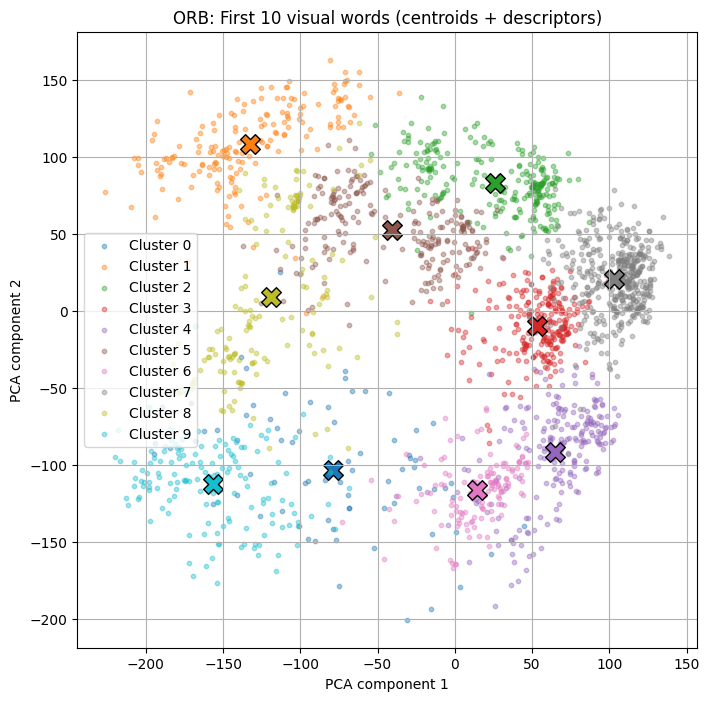

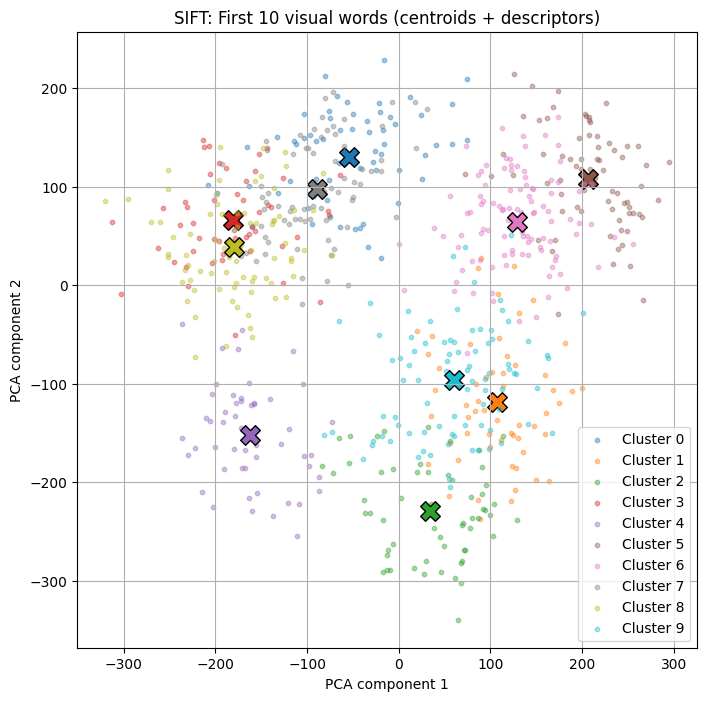

ORB histograms shape: (500, 25)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 25)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2907
  ORB AP : 0.2585
----------------------------------------
Class: automobile
  SIFT AP: 0.4107
  ORB AP : 0.2558
----------------------------------------
Class: bird
  SIFT AP: 0.3645
  ORB AP : 0.2785
----------------------------------------
Class: cat
  SIFT AP: 0.2997
  ORB AP : 0.1971
----------------------------------------
Class: deer
  SIFT AP: 0.2061
  ORB AP : 0.2103
----------------------------------------
Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (6167, 32)
Average ORB descriptors per image: 41.67
SIFT descriptors shape: (2041, 128)
Average SIFT descriptors per image: 13.79
Clustering 6167 points in 32D to 25 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 2041 points to 200 centroids: please provide at least 7800 training points


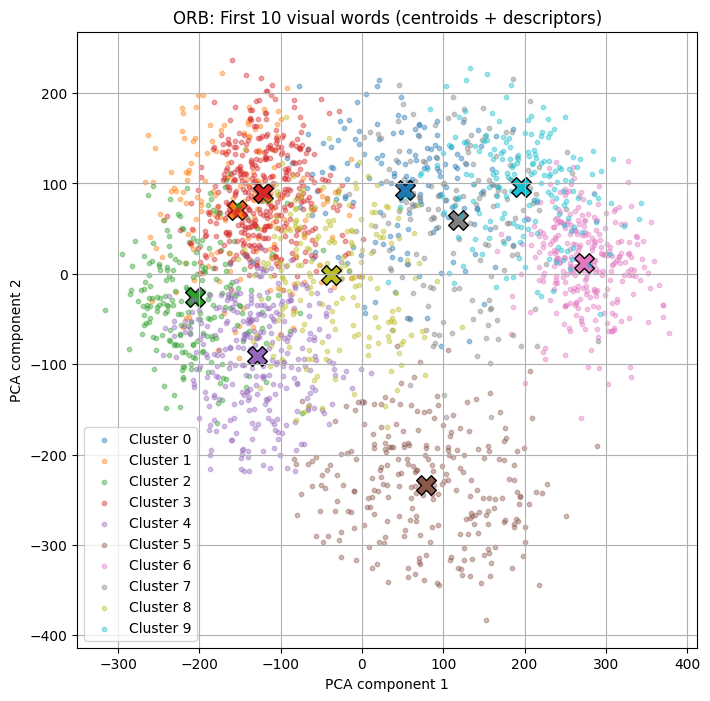

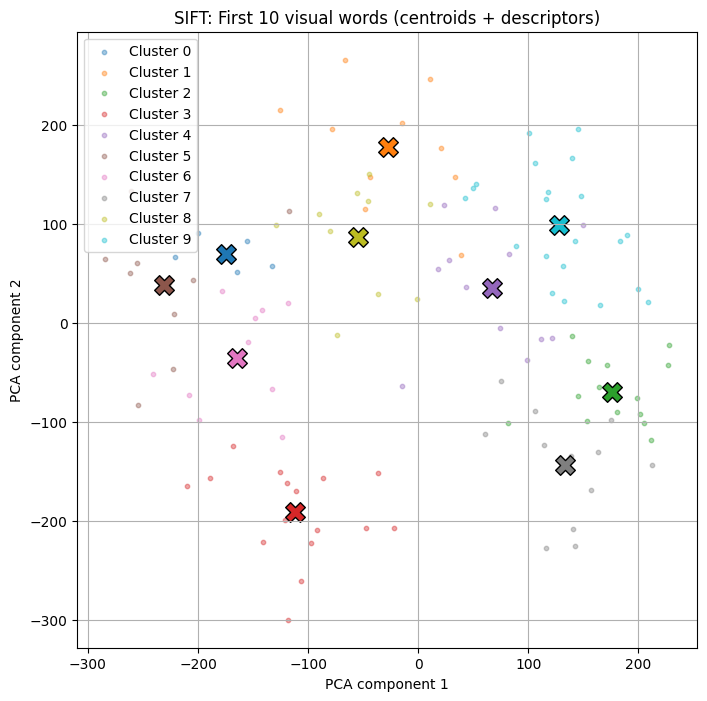

ORB histograms shape: (500, 25)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 25)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2498
  ORB AP : 0.2565
----------------------------------------
Class: automobile
  SIFT AP: 0.3231
  ORB AP : 0.2829
----------------------------------------
Class: bird
  SIFT AP: 0.2285
  ORB AP : 0.3166
----------------------------------------
Class: cat
  SIFT AP: 0.2243
  ORB AP : 0.2415
----------------------------------------
Class: deer
  SIFT AP: 0.1941
  ORB AP : 0.2290
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (7945, 32)
Average ORB descriptors per image: 40.13
SIFT descriptors shape: (2656, 128)
Average SIFT descriptors per image: 13.41
Sampling a subset of 6400 / 7945 for training
Clustering 6400 points in 32D to 25 clusters, redo 1 times, 20 iterat

WARNING clustering 2656 points to 200 centroids: please provide at least 7800 training points


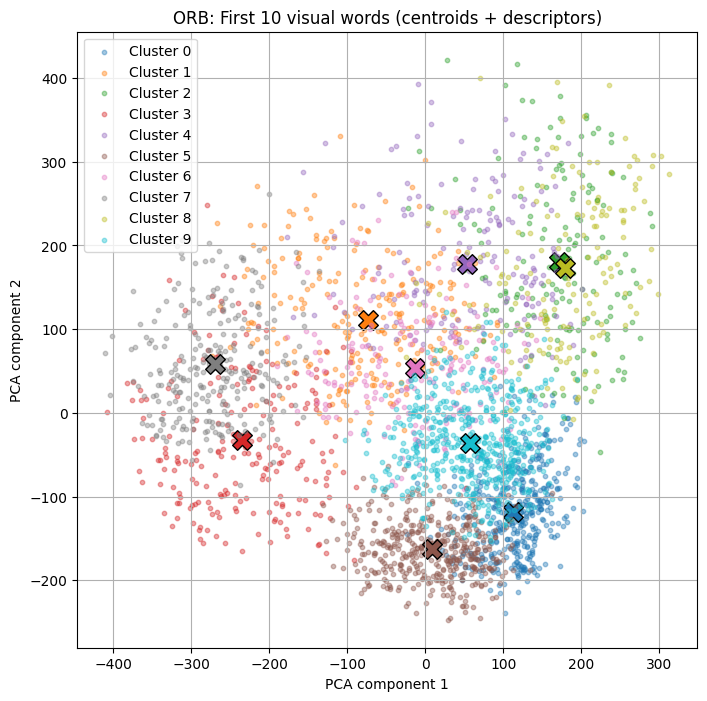

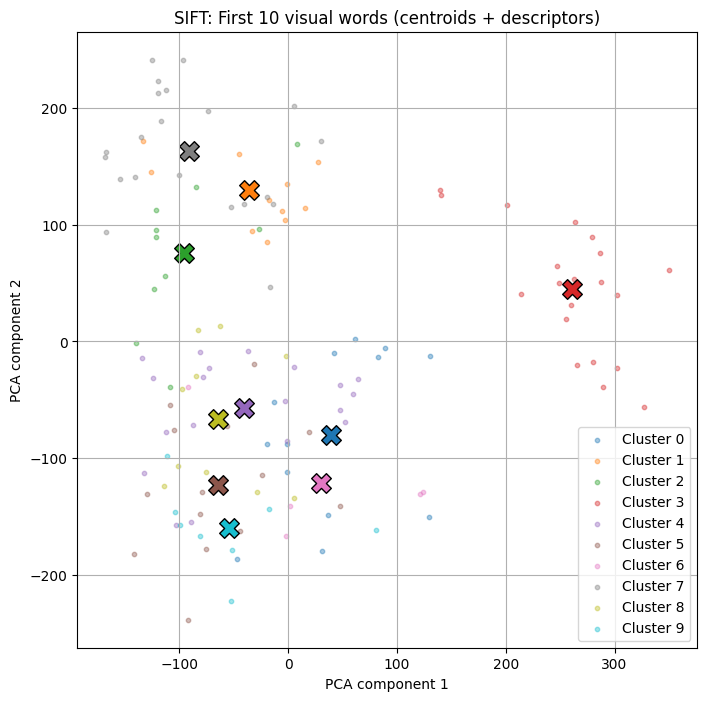

ORB histograms shape: (500, 25)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 25)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2536
  ORB AP : 0.2261
----------------------------------------
Class: automobile
  SIFT AP: 0.3229
  ORB AP : 0.2615
----------------------------------------
Class: bird
  SIFT AP: 0.2581
  ORB AP : 0.3064
----------------------------------------
Class: cat
  SIFT AP: 0.2472
  ORB AP : 0.2201
----------------------------------------
Class: deer
  SIFT AP: 0.2094
  ORB AP : 0.1945
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (10168, 32)
Average ORB descriptors per image: 40.84
SIFT descriptors shape: (3359, 128)
Average SIFT descriptors per image: 13.49
Sampling a subset of 6400 / 10168 for training
Clustering 6400 points in 32D to 25 clusters, redo 1 times, 20 iter

WARNING clustering 3359 points to 200 centroids: please provide at least 7800 training points


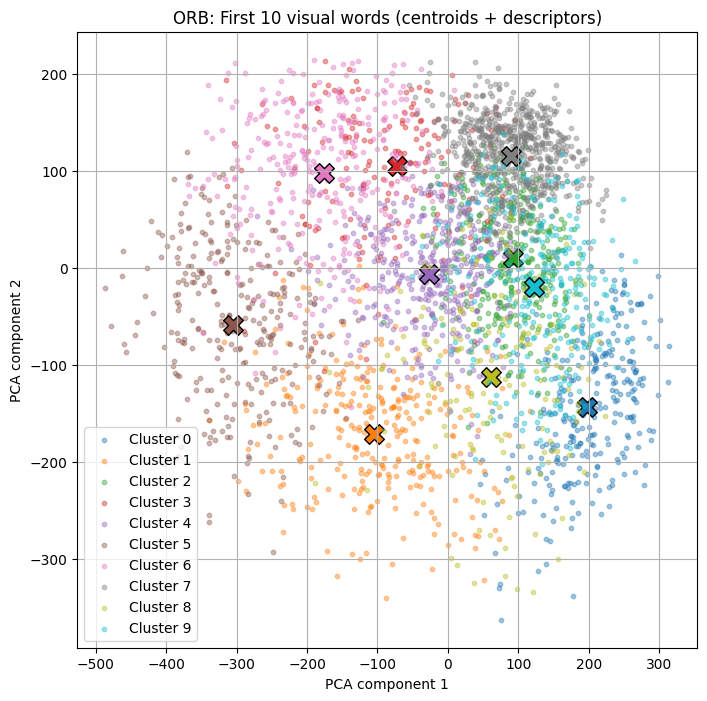

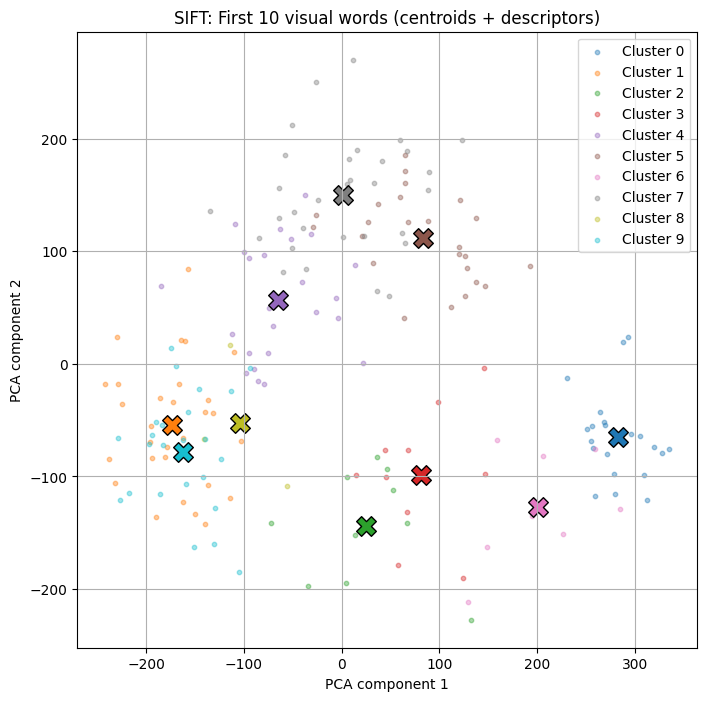

ORB histograms shape: (500, 25)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 25)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2345
  ORB AP : 0.2447
----------------------------------------
Class: automobile
  SIFT AP: 0.2935
  ORB AP : 0.2759
----------------------------------------
Class: bird
  SIFT AP: 0.2652
  ORB AP : 0.3073
----------------------------------------
Class: cat
  SIFT AP: 0.2038
  ORB AP : 0.2666
----------------------------------------
Class: deer
  SIFT AP: 0.1945
  ORB AP : 0.1934
----------------------------------------
Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (5082, 32)
Average ORB descriptors per image: 34.34
SIFT descriptors shape: (2014, 128)
Average SIFT descriptors per image: 13.61
Clustering 5082 points in 32D to 50 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 2014 points to 200 centroids: please provide at least 7800 training points


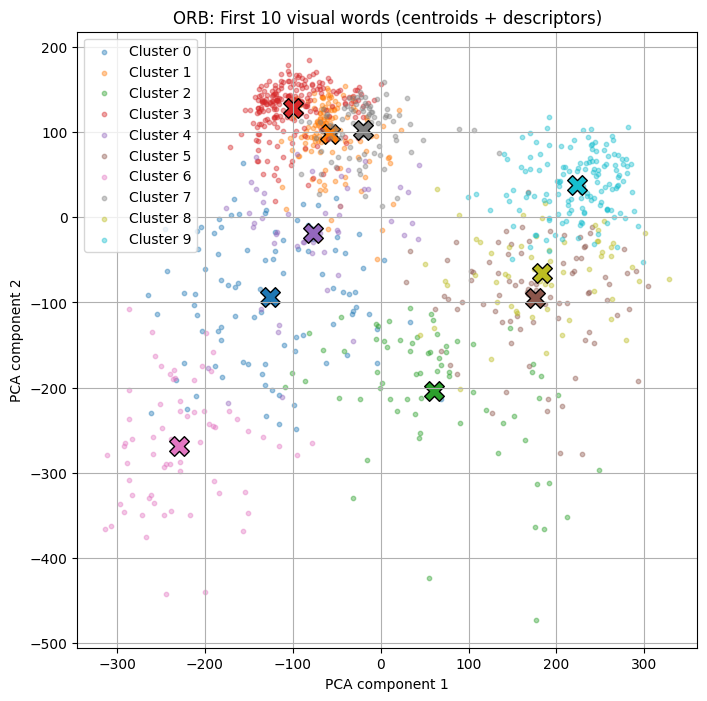

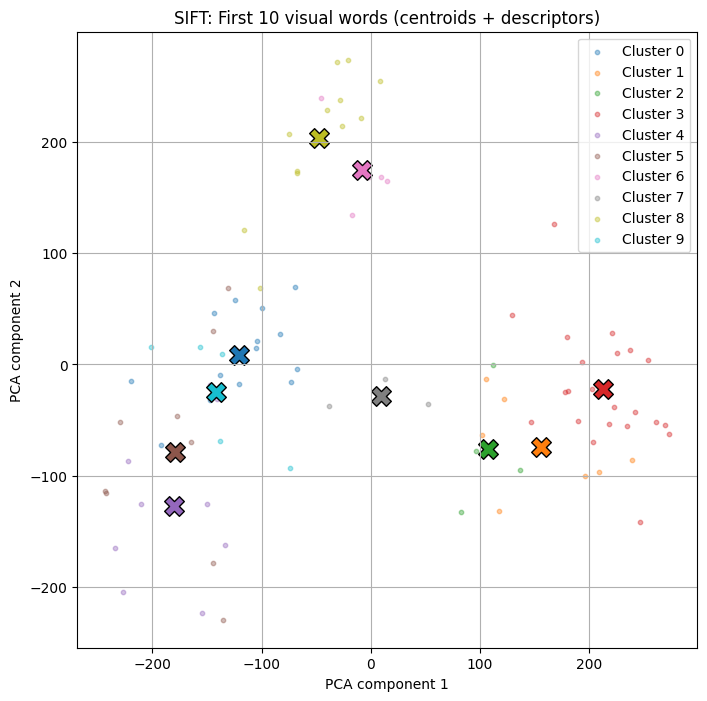

ORB histograms shape: (500, 50)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 50)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2308
  ORB AP : 0.2535
----------------------------------------
Class: automobile
  SIFT AP: 0.3515
  ORB AP : 0.2653
----------------------------------------
Class: bird
  SIFT AP: 0.3698
  ORB AP : 0.3158
----------------------------------------
Class: cat
  SIFT AP: 0.2284
  ORB AP : 0.2308
----------------------------------------
Class: deer
  SIFT AP: 0.2230
  ORB AP : 0.2478
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (6784, 32)
Average ORB descriptors per image: 34.26
SIFT descriptors shape: (2590, 128)
Average SIFT descriptors per image: 13.08
Clustering 6784 points in 32D to 50 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 2590 points to 200 centroids: please provide at least 7800 training points


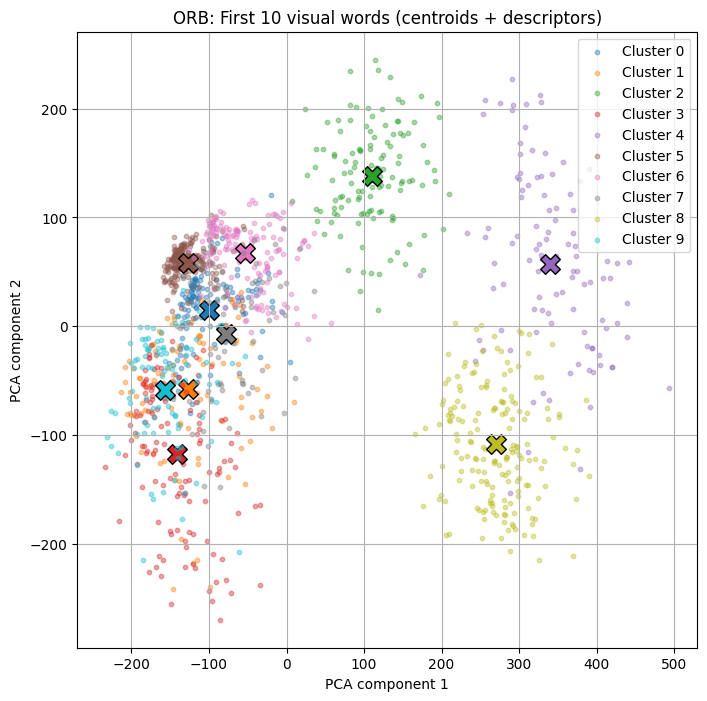

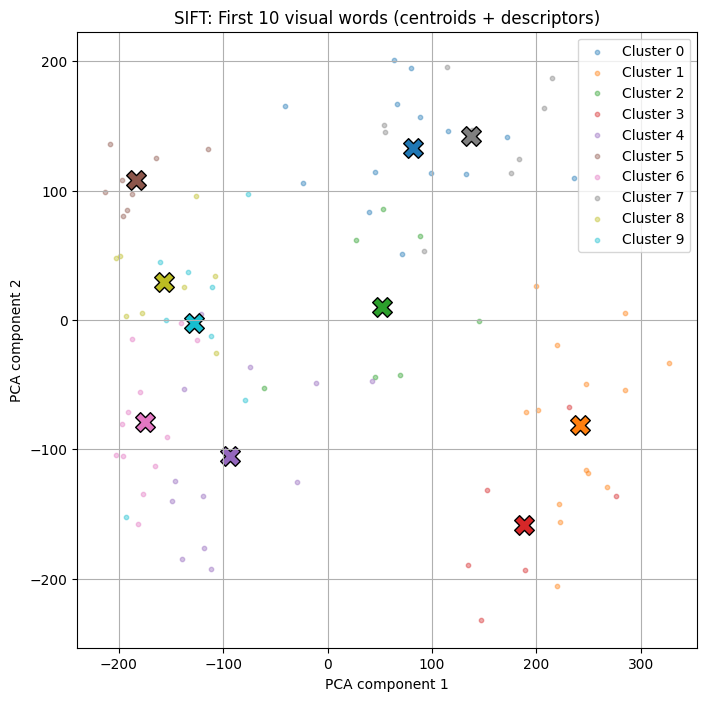

ORB histograms shape: (500, 50)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 50)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2511
  ORB AP : 0.2627
----------------------------------------
Class: automobile
  SIFT AP: 0.3972
  ORB AP : 0.2515
----------------------------------------
Class: bird
  SIFT AP: 0.3892
  ORB AP : 0.3276
----------------------------------------
Class: cat
  SIFT AP: 0.2502
  ORB AP : 0.2231
----------------------------------------
Class: deer
  SIFT AP: 0.1998
  ORB AP : 0.2049
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (8627, 32)
Average ORB descriptors per image: 34.65
SIFT descriptors shape: (3241, 128)
Average SIFT descriptors per image: 13.02
Clustering 8627 points in 32D to 50 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 3241 points to 200 centroids: please provide at least 7800 training points


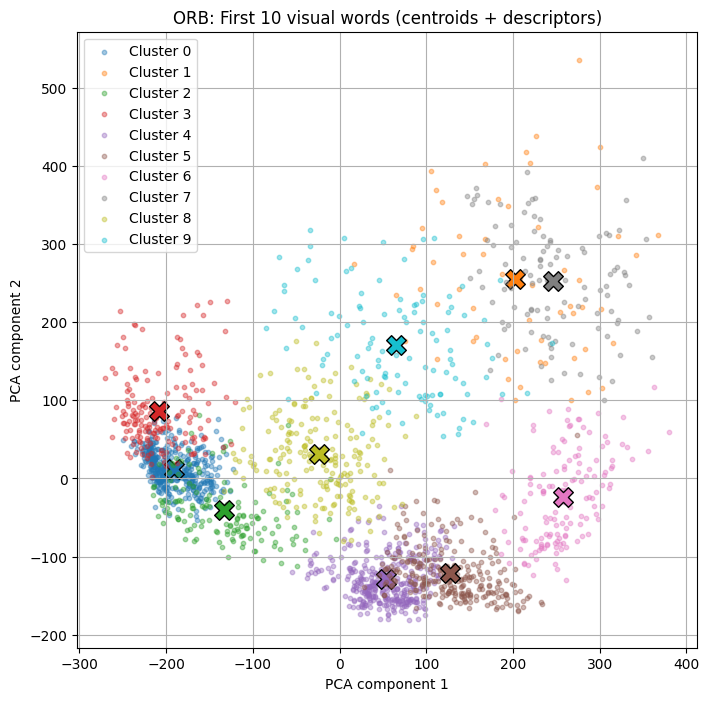

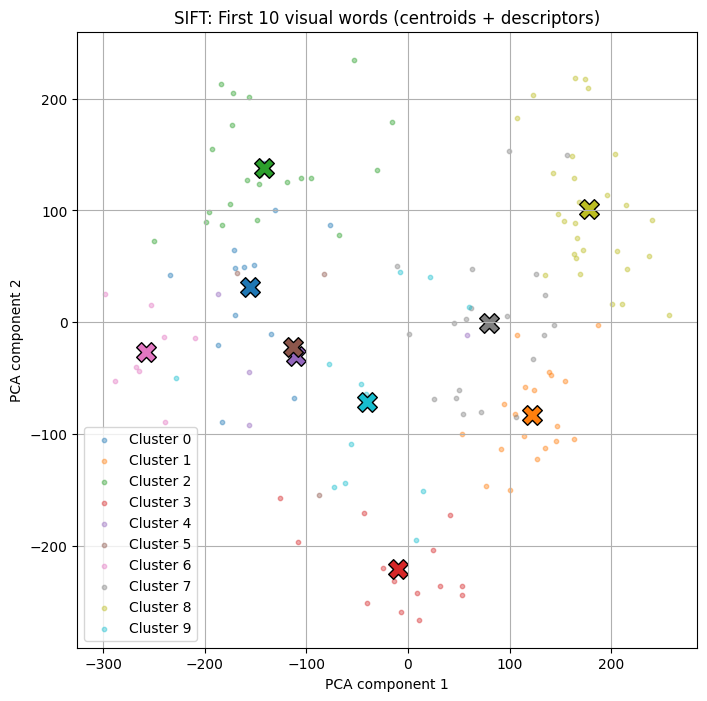

ORB histograms shape: (500, 50)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 50)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2297
  ORB AP : 0.2482
----------------------------------------
Class: automobile
  SIFT AP: 0.3738
  ORB AP : 0.2818
----------------------------------------
Class: bird
  SIFT AP: 0.3477
  ORB AP : 0.3042
----------------------------------------
Class: cat
  SIFT AP: 0.2193
  ORB AP : 0.2440
----------------------------------------
Class: deer
  SIFT AP: 0.2141
  ORB AP : 0.1882
----------------------------------------
Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (2513, 32)
Average ORB descriptors per image: 16.98
SIFT descriptors shape: (8075, 128)
Average SIFT descriptors per image: 54.56
Clustering 2513 points in 32D to 50 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

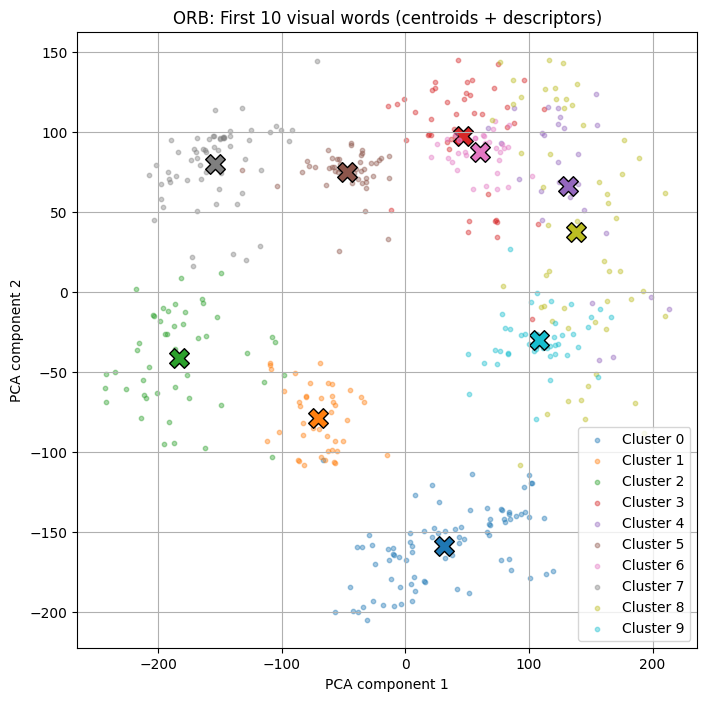

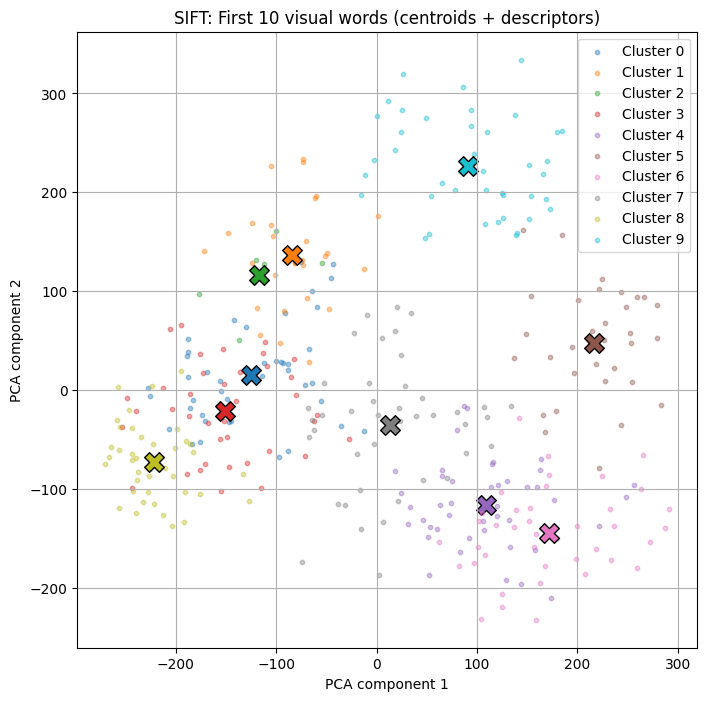

ORB histograms shape: (500, 50)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 50)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2959
  ORB AP : 0.2625
----------------------------------------
Class: automobile
  SIFT AP: 0.4071
  ORB AP : 0.2596
----------------------------------------
Class: bird
  SIFT AP: 0.3527
  ORB AP : 0.2782
----------------------------------------
Class: cat
  SIFT AP: 0.2266
  ORB AP : 0.1955
----------------------------------------
Class: deer
  SIFT AP: 0.2257
  ORB AP : 0.2169
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (3446, 32)
Average ORB descriptors per image: 17.40
SIFT descriptors shape: (11548, 128)
Average SIFT descriptors per image: 58.32
Clustering 3446 points in 32D to 50 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19

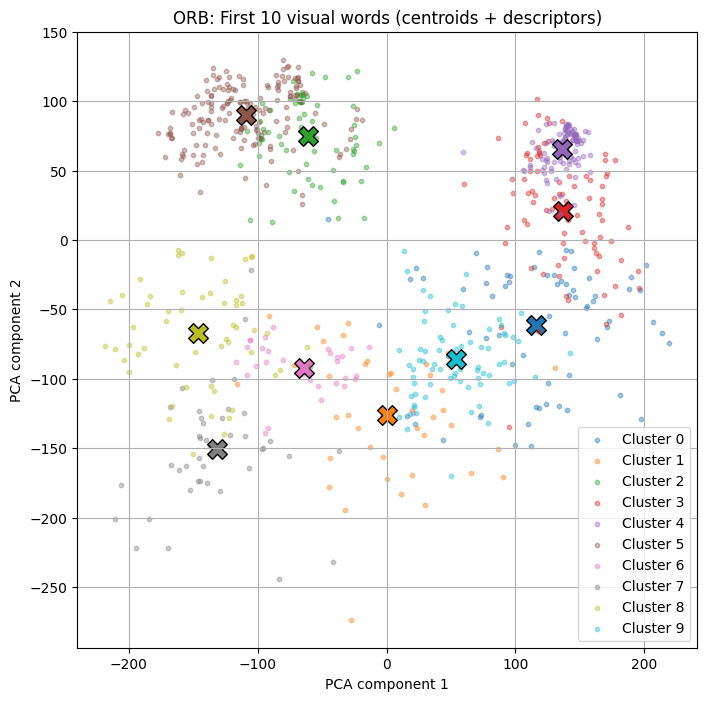

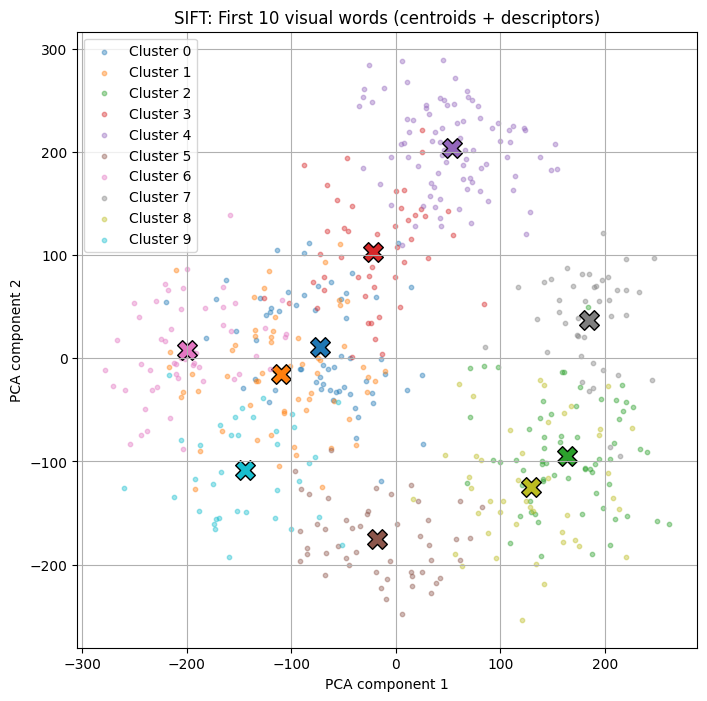

ORB histograms shape: (500, 50)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 50)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.3029
  ORB AP : 0.2612
----------------------------------------
Class: automobile
  SIFT AP: 0.3414
  ORB AP : 0.2460
----------------------------------------
Class: bird
  SIFT AP: 0.3747
  ORB AP : 0.2771
----------------------------------------
Class: cat
  SIFT AP: 0.2598
  ORB AP : 0.2068
----------------------------------------
Class: deer
  SIFT AP: 0.2269
  ORB AP : 0.2282
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (4130, 32)
Average ORB descriptors per image: 16.59
SIFT descriptors shape: (14072, 128)
Average SIFT descriptors per image: 56.51
Clustering 4130 points in 32D to 50 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19

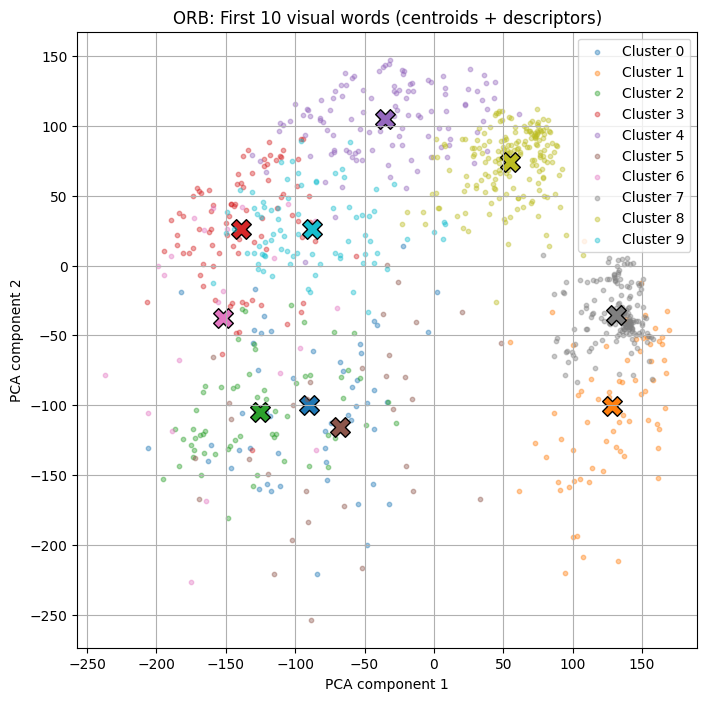

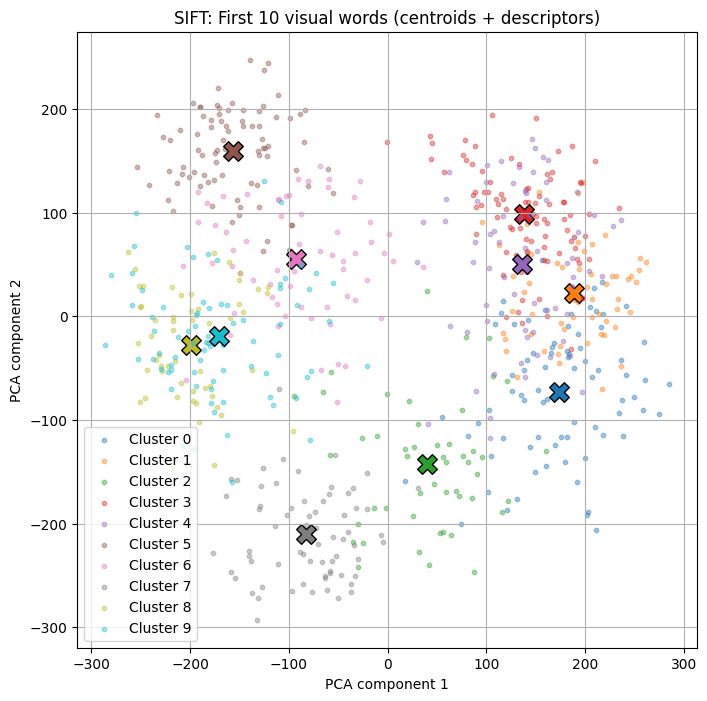

ORB histograms shape: (500, 50)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 50)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2678
  ORB AP : 0.2676
----------------------------------------
Class: automobile
  SIFT AP: 0.3982
  ORB AP : 0.2288
----------------------------------------
Class: bird
  SIFT AP: 0.3946
  ORB AP : 0.2551
----------------------------------------
Class: cat
  SIFT AP: 0.2629
  ORB AP : 0.2169
----------------------------------------
Class: deer
  SIFT AP: 0.2311
  ORB AP : 0.2248
----------------------------------------
Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (6197, 32)
Average ORB descriptors per image: 41.87
SIFT descriptors shape: (2105, 128)
Average SIFT descriptors per image: 14.22
Clustering 6197 points in 32D to 50 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 2105 points to 200 centroids: please provide at least 7800 training points


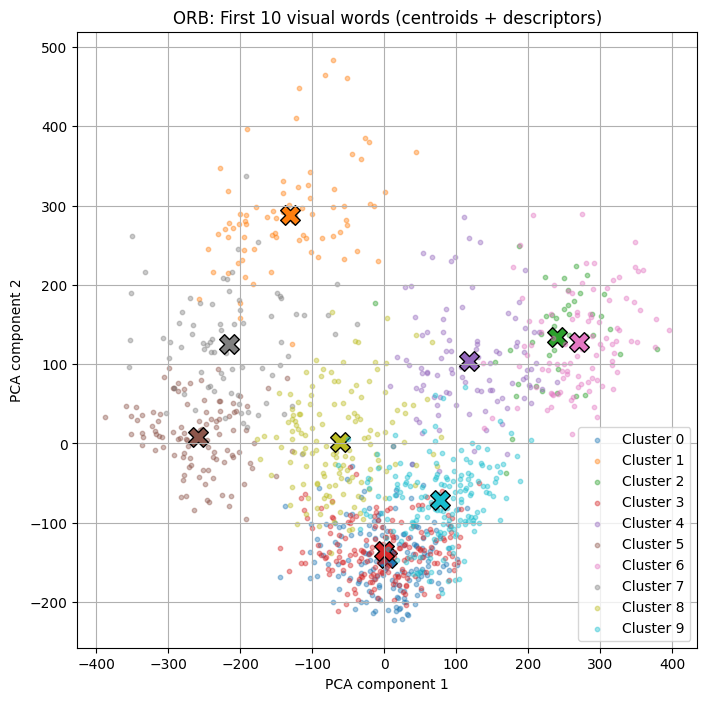

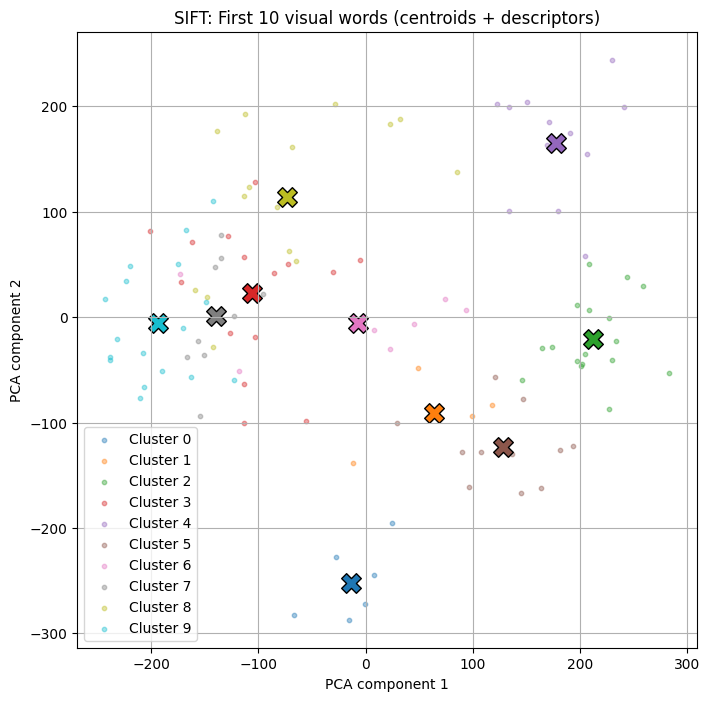

ORB histograms shape: (500, 50)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 50)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2421
  ORB AP : 0.2330
----------------------------------------
Class: automobile
  SIFT AP: 0.3033
  ORB AP : 0.2740
----------------------------------------
Class: bird
  SIFT AP: 0.3008
  ORB AP : 0.2795
----------------------------------------
Class: cat
  SIFT AP: 0.2402
  ORB AP : 0.2366
----------------------------------------
Class: deer
  SIFT AP: 0.1894
  ORB AP : 0.2366
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (8083, 32)
Average ORB descriptors per image: 40.82
SIFT descriptors shape: (2753, 128)
Average SIFT descriptors per image: 13.90
Clustering 8083 points in 32D to 50 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 2753 points to 200 centroids: please provide at least 7800 training points


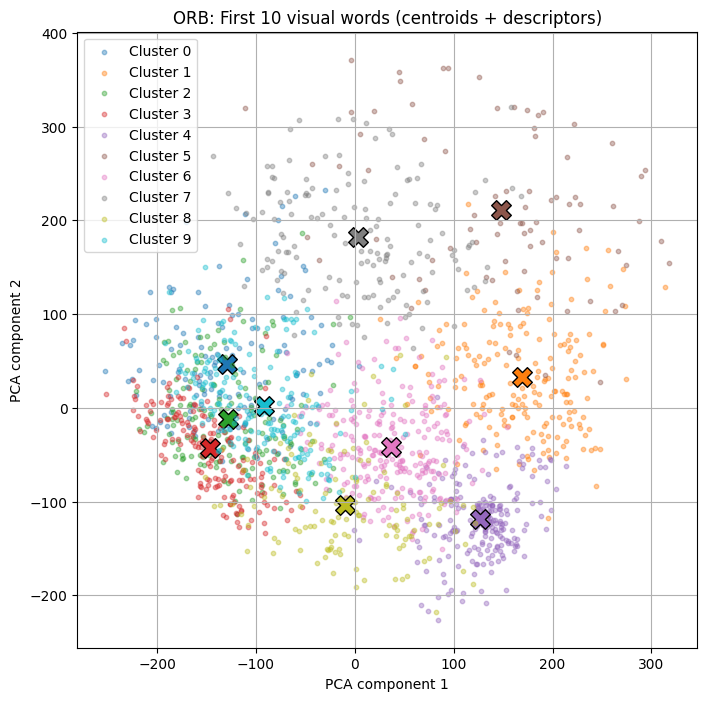

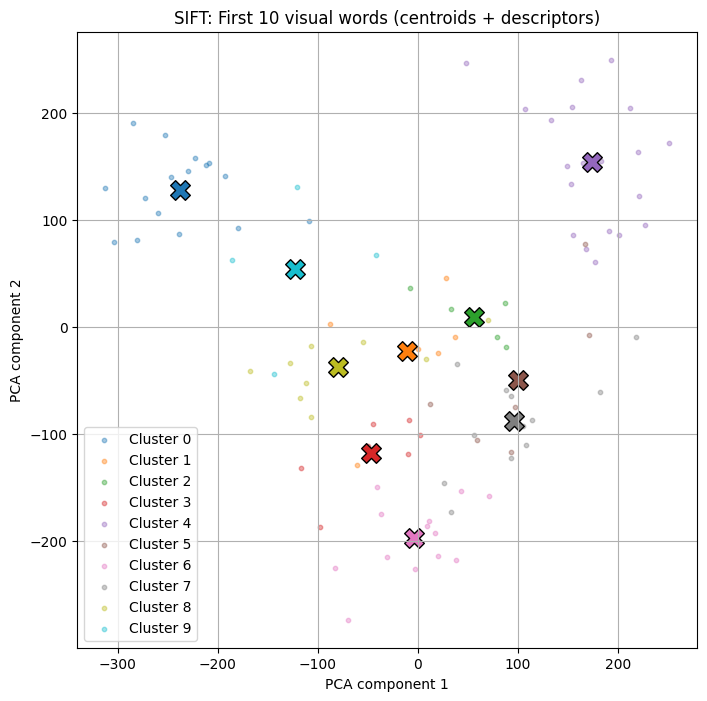

ORB histograms shape: (500, 50)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 50)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2268
  ORB AP : 0.2597
----------------------------------------
Class: automobile
  SIFT AP: 0.3186
  ORB AP : 0.2757
----------------------------------------
Class: bird
  SIFT AP: 0.2280
  ORB AP : 0.2934
----------------------------------------
Class: cat
  SIFT AP: 0.2027
  ORB AP : 0.2617
----------------------------------------
Class: deer
  SIFT AP: 0.1930
  ORB AP : 0.1956
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (9974, 32)
Average ORB descriptors per image: 40.06
SIFT descriptors shape: (3395, 128)
Average SIFT descriptors per image: 13.63
Clustering 9974 points in 32D to 50 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 3395 points to 200 centroids: please provide at least 7800 training points


  Iteration 19 (0.09 s, search 0.08 s): objective=2.76321e+08 imbalance=1.187 nsplit=0       


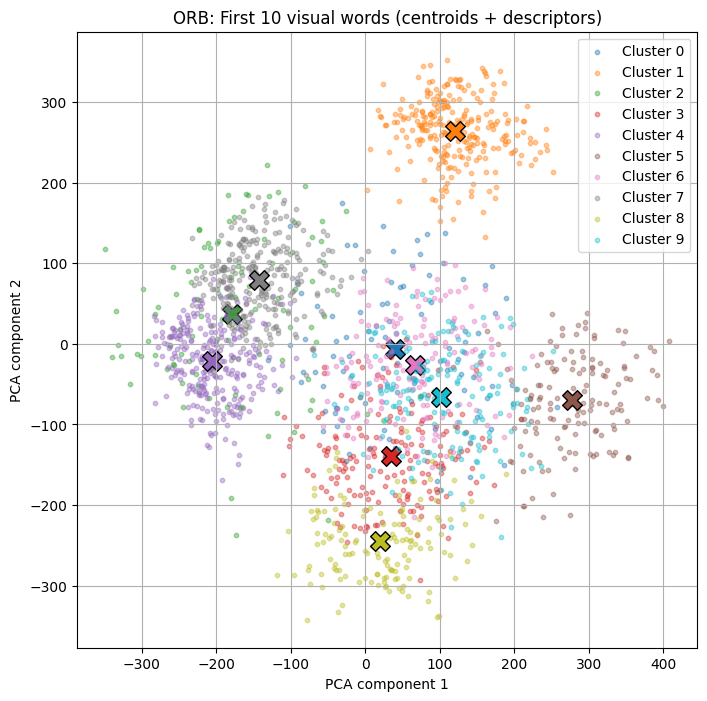

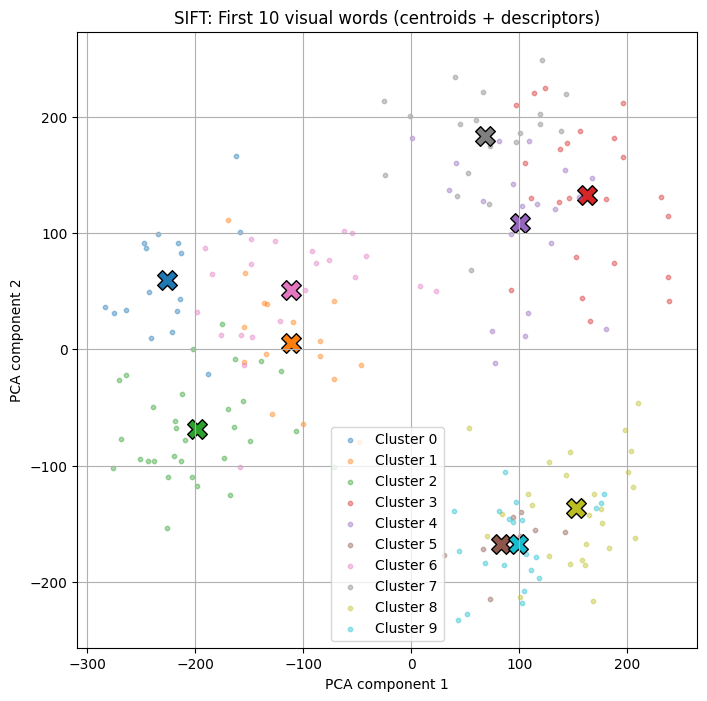

ORB histograms shape: (500, 50)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 50)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2179
  ORB AP : 0.2398
----------------------------------------
Class: automobile
  SIFT AP: 0.2946
  ORB AP : 0.2732
----------------------------------------
Class: bird
  SIFT AP: 0.2755
  ORB AP : 0.2849
----------------------------------------
Class: cat
  SIFT AP: 0.2367
  ORB AP : 0.2377
----------------------------------------
Class: deer
  SIFT AP: 0.1963
  ORB AP : 0.2158
----------------------------------------
Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (4794, 32)
Average ORB descriptors per image: 32.39
SIFT descriptors shape: (1803, 128)
Average SIFT descriptors per image: 12.18
Clustering 4794 points in 32D to 75 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 1803 points to 200 centroids: please provide at least 7800 training points


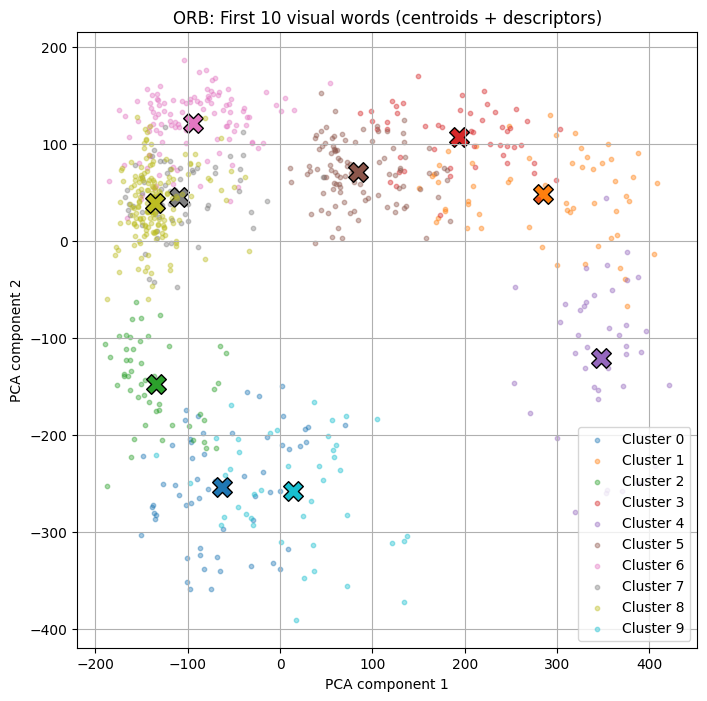

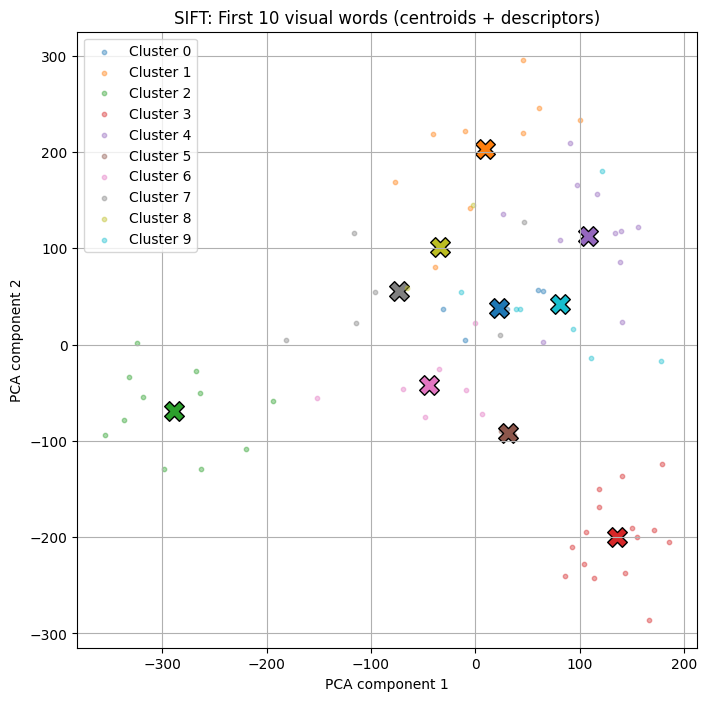

ORB histograms shape: (500, 75)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 75)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2355
  ORB AP : 0.2531
----------------------------------------
Class: automobile
  SIFT AP: 0.3747
  ORB AP : 0.2615
----------------------------------------
Class: bird
  SIFT AP: 0.3277
  ORB AP : 0.3550
----------------------------------------
Class: cat
  SIFT AP: 0.2338
  ORB AP : 0.2683
----------------------------------------
Class: deer
  SIFT AP: 0.2551
  ORB AP : 0.2562
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (7043, 32)
Average ORB descriptors per image: 35.57
SIFT descriptors shape: (2581, 128)
Average SIFT descriptors per image: 13.04
Clustering 7043 points in 32D to 75 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 2581 points to 200 centroids: please provide at least 7800 training points


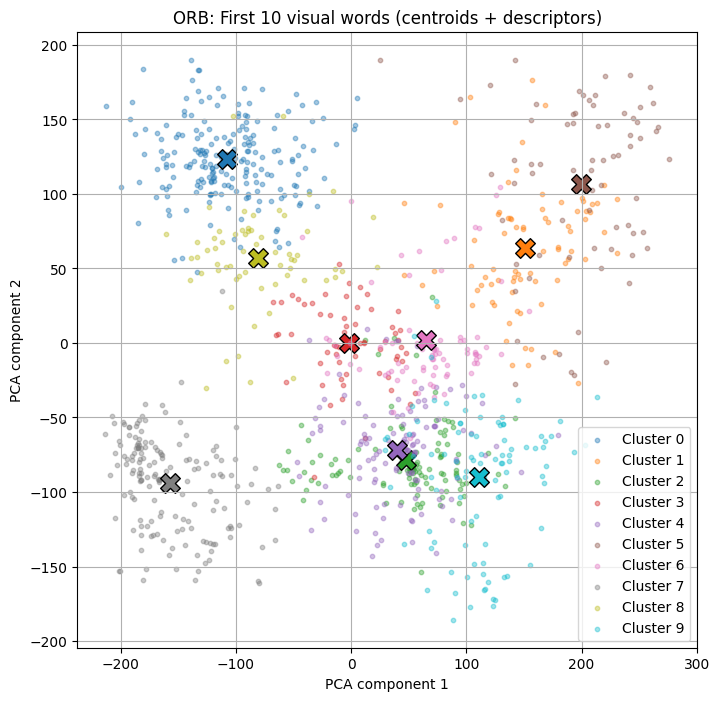

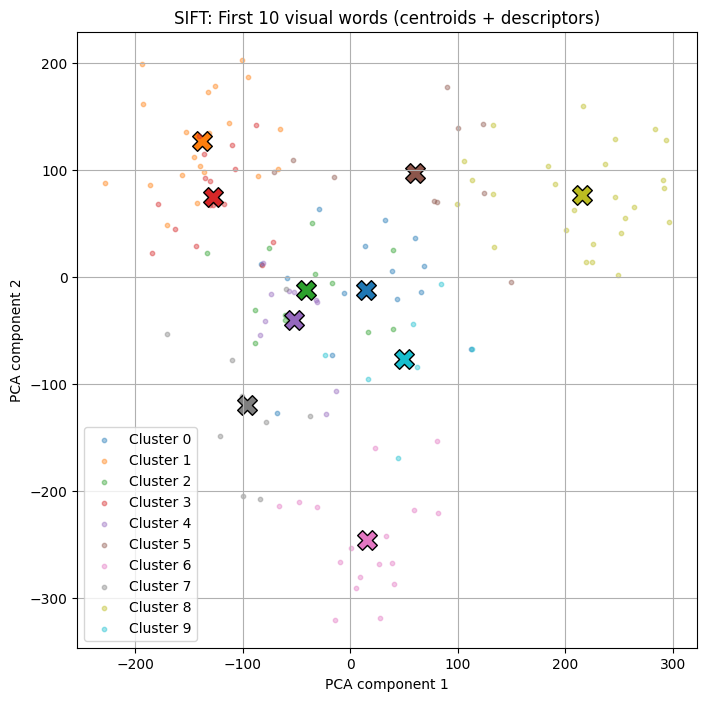

ORB histograms shape: (500, 75)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 75)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2425
  ORB AP : 0.2466
----------------------------------------
Class: automobile
  SIFT AP: 0.3552
  ORB AP : 0.2822
----------------------------------------
Class: bird
  SIFT AP: 0.3597
  ORB AP : 0.2977
----------------------------------------
Class: cat
  SIFT AP: 0.2241
  ORB AP : 0.2320
----------------------------------------
Class: deer
  SIFT AP: 0.2305
  ORB AP : 0.2079
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (8645, 32)
Average ORB descriptors per image: 34.72
SIFT descriptors shape: (3195, 128)
Average SIFT descriptors per image: 12.83
Clustering 8645 points in 32D to 75 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 3195 points to 200 centroids: please provide at least 7800 training points


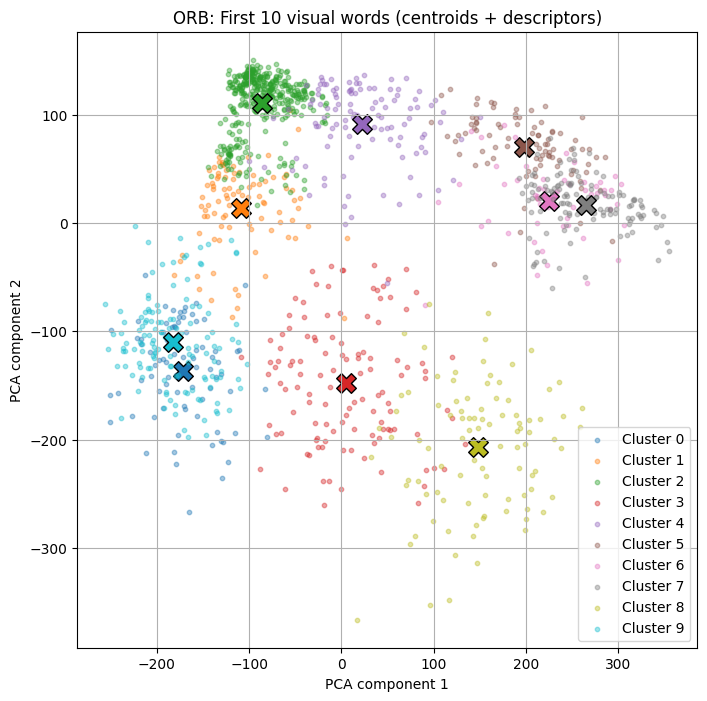

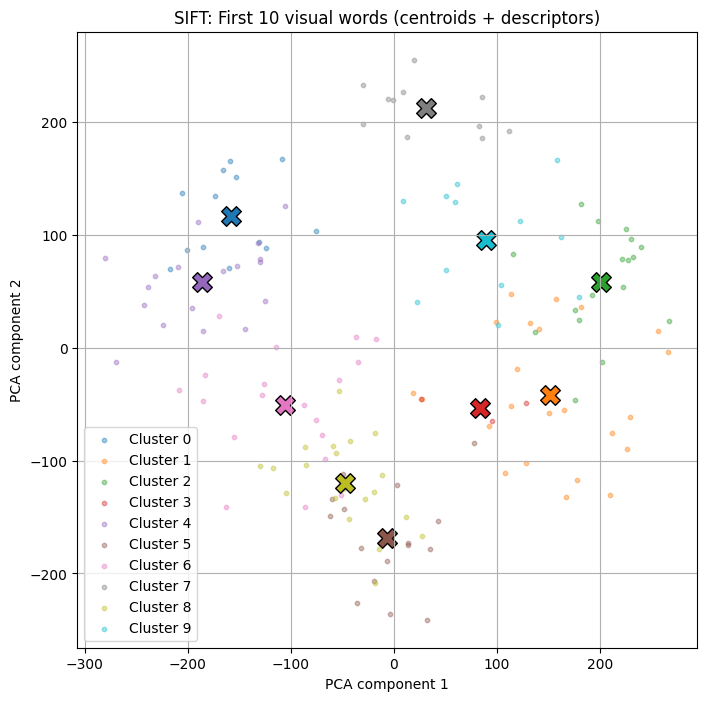

ORB histograms shape: (500, 75)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 75)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2589
  ORB AP : 0.2674
----------------------------------------
Class: automobile
  SIFT AP: 0.3549
  ORB AP : 0.2777
----------------------------------------
Class: bird
  SIFT AP: 0.3549
  ORB AP : 0.3176
----------------------------------------
Class: cat
  SIFT AP: 0.2528
  ORB AP : 0.2372
----------------------------------------
Class: deer
  SIFT AP: 0.2476
  ORB AP : 0.2075
----------------------------------------
Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (2447, 32)
Average ORB descriptors per image: 16.53
SIFT descriptors shape: (7692, 128)
Average SIFT descriptors per image: 51.97
Clustering 2447 points in 32D to 75 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 2447 points to 75 centroids: please provide at least 2925 training points
WARNING clustering 7692 points to 200 centroids: please provide at least 7800 training points


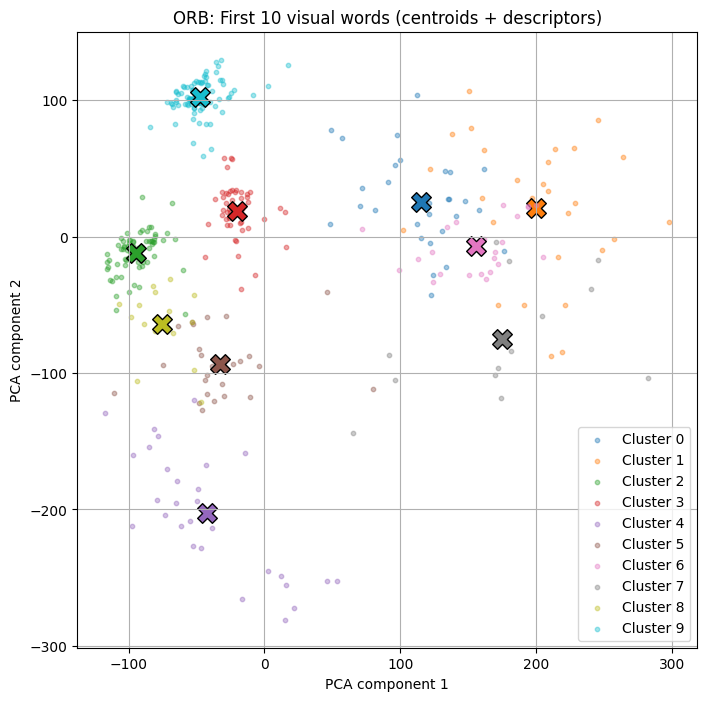

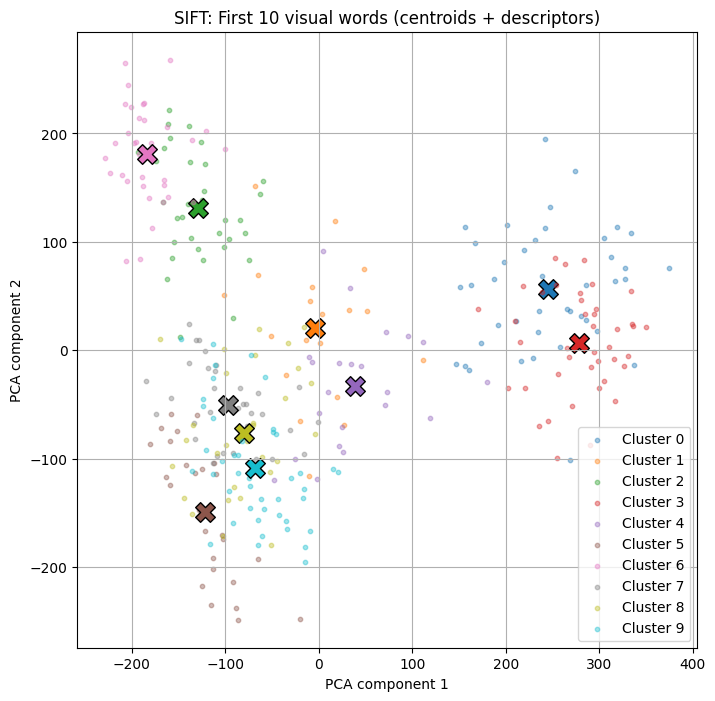

ORB histograms shape: (500, 75)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 75)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2779
  ORB AP : 0.2511
----------------------------------------
Class: automobile
  SIFT AP: 0.3600
  ORB AP : 0.2462
----------------------------------------
Class: bird
  SIFT AP: 0.3279
  ORB AP : 0.2743
----------------------------------------
Class: cat
  SIFT AP: 0.2410
  ORB AP : 0.2328
----------------------------------------
Class: deer
  SIFT AP: 0.2639
  ORB AP : 0.2374
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (3308, 32)
Average ORB descriptors per image: 16.71
SIFT descriptors shape: (10922, 128)
Average SIFT descriptors per image: 55.16
Clustering 3308 points in 32D to 75 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19

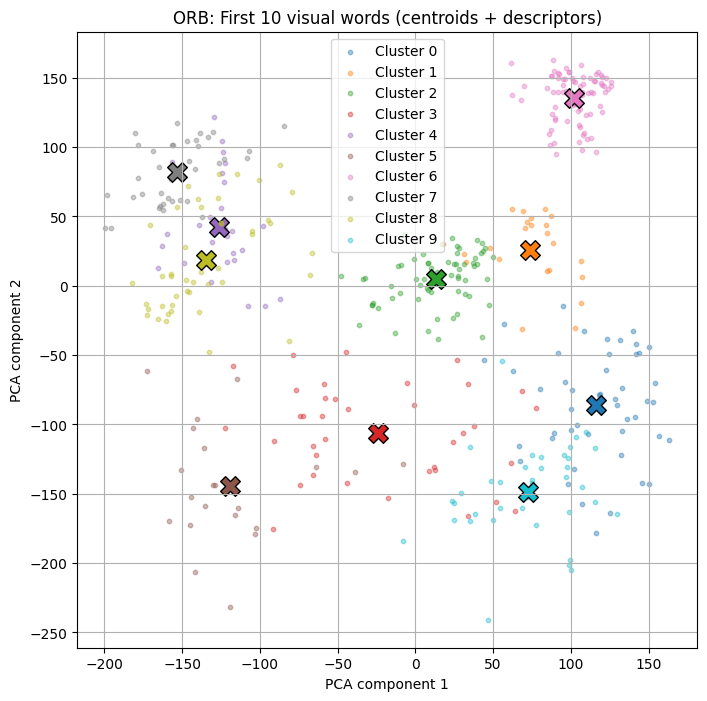

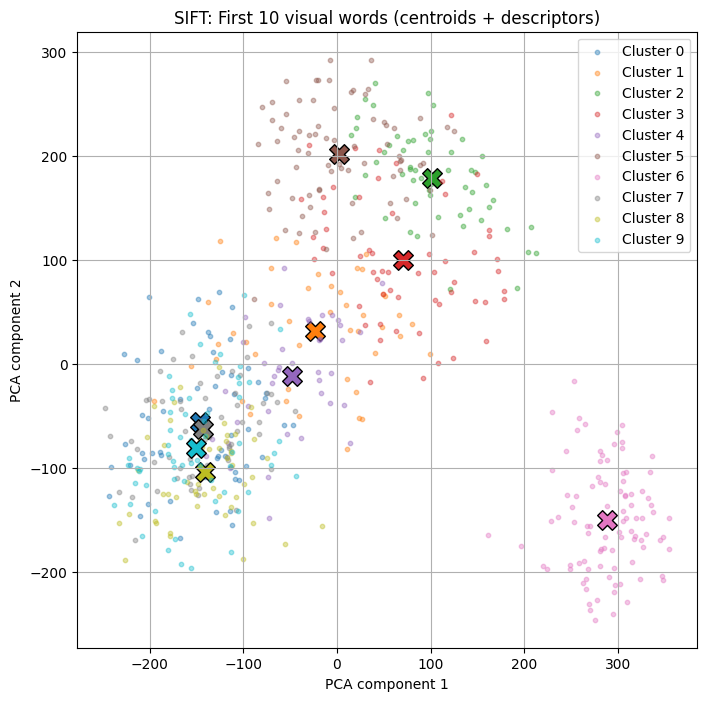

ORB histograms shape: (500, 75)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 75)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2960
  ORB AP : 0.2673
----------------------------------------
Class: automobile
  SIFT AP: 0.3774
  ORB AP : 0.2385
----------------------------------------
Class: bird
  SIFT AP: 0.3656
  ORB AP : 0.2628
----------------------------------------
Class: cat
  SIFT AP: 0.2582
  ORB AP : 0.2147
----------------------------------------
Class: deer
  SIFT AP: 0.2448
  ORB AP : 0.2272
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (4133, 32)
Average ORB descriptors per image: 16.60
SIFT descriptors shape: (13791, 128)
Average SIFT descriptors per image: 55.39
Clustering 4133 points in 32D to 75 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19

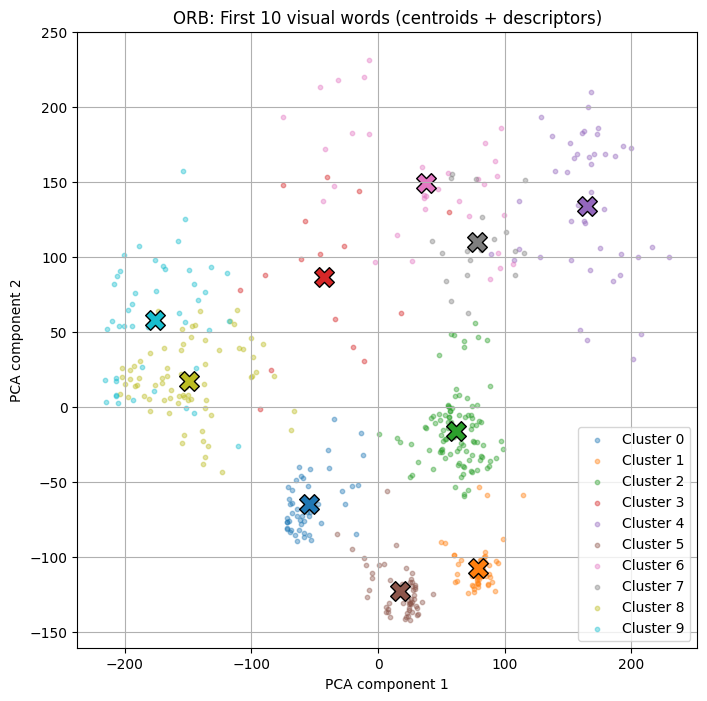

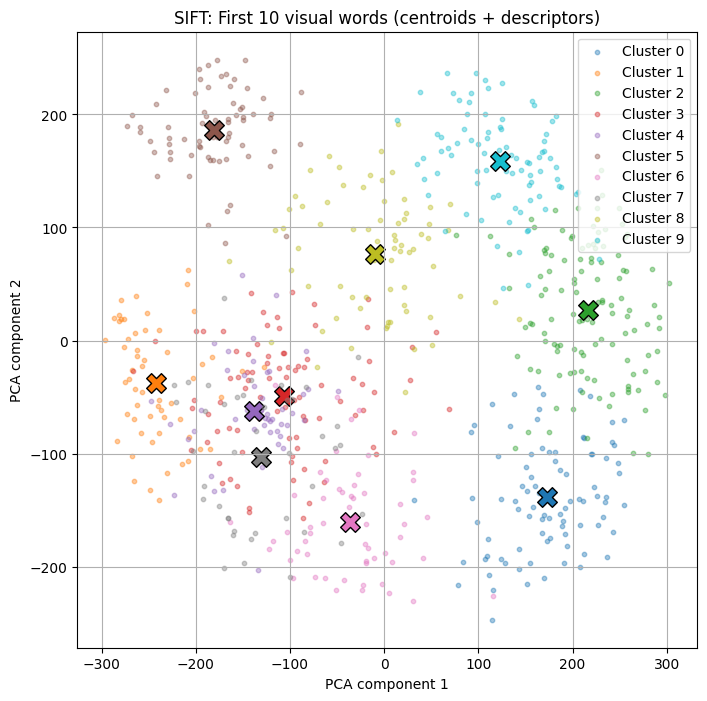

ORB histograms shape: (500, 75)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 75)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.3082
  ORB AP : 0.2743
----------------------------------------
Class: automobile
  SIFT AP: 0.3618
  ORB AP : 0.2260
----------------------------------------
Class: bird
  SIFT AP: 0.3548
  ORB AP : 0.2581
----------------------------------------
Class: cat
  SIFT AP: 0.2553
  ORB AP : 0.2056
----------------------------------------
Class: deer
  SIFT AP: 0.2210
  ORB AP : 0.2107
----------------------------------------
Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (5956, 32)
Average ORB descriptors per image: 40.24
SIFT descriptors shape: (2017, 128)
Average SIFT descriptors per image: 13.63
Clustering 5956 points in 32D to 75 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 2017 points to 200 centroids: please provide at least 7800 training points


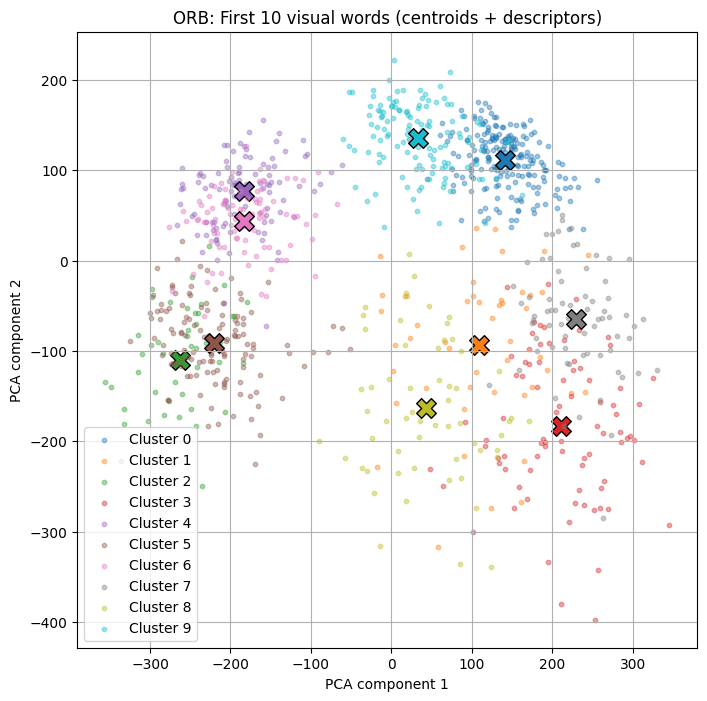

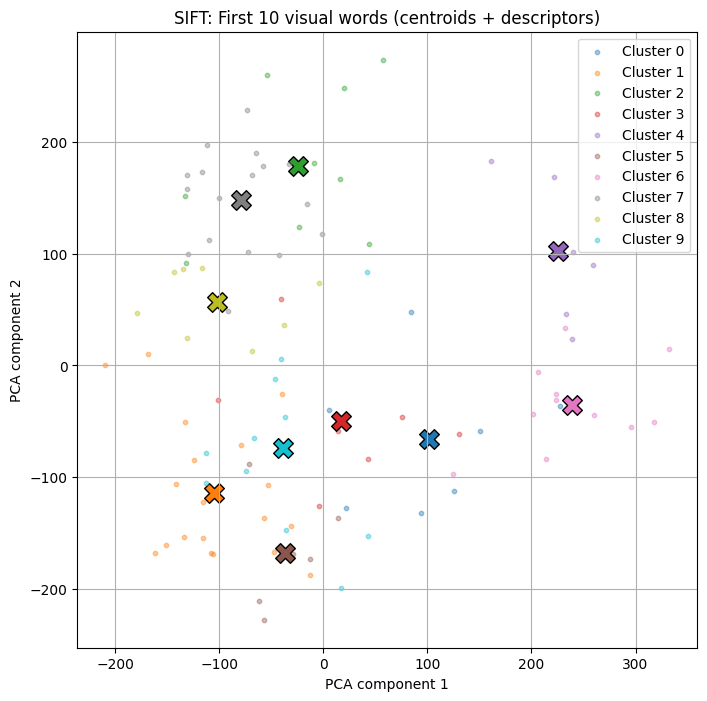

ORB histograms shape: (500, 75)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 75)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2581
  ORB AP : 0.2497
----------------------------------------
Class: automobile
  SIFT AP: 0.2976
  ORB AP : 0.2873
----------------------------------------
Class: bird
  SIFT AP: 0.3100
  ORB AP : 0.3160
----------------------------------------
Class: cat
  SIFT AP: 0.2536
  ORB AP : 0.2345
----------------------------------------
Class: deer
  SIFT AP: 0.2073
  ORB AP : 0.2013
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (8045, 32)
Average ORB descriptors per image: 40.63
SIFT descriptors shape: (2708, 128)
Average SIFT descriptors per image: 13.68
Clustering 8045 points in 32D to 75 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 

WARNING clustering 2708 points to 200 centroids: please provide at least 7800 training points


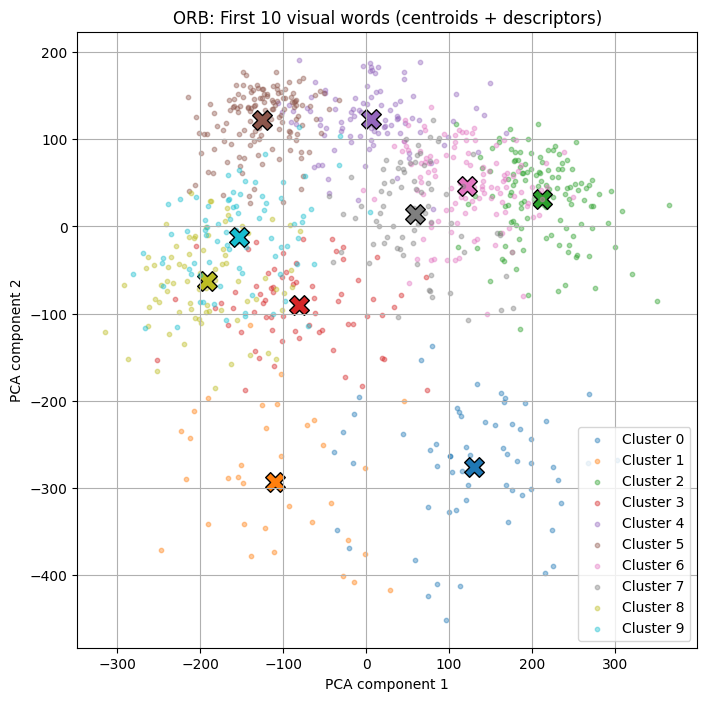

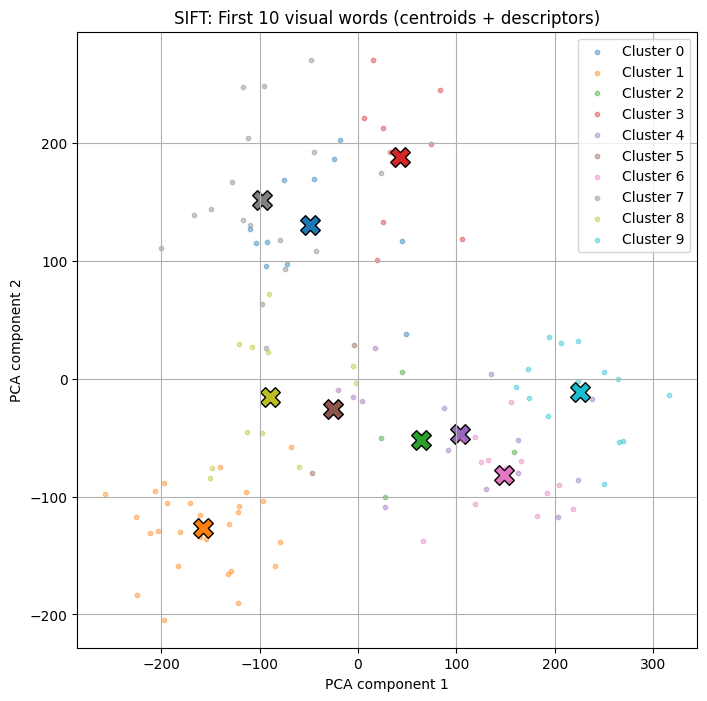

ORB histograms shape: (500, 75)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 75)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2149
  ORB AP : 0.2470
----------------------------------------
Class: automobile
  SIFT AP: 0.3088
  ORB AP : 0.2797
----------------------------------------
Class: bird
  SIFT AP: 0.2856
  ORB AP : 0.2795
----------------------------------------
Class: cat
  SIFT AP: 0.2182
  ORB AP : 0.2386
----------------------------------------
Class: deer
  SIFT AP: 0.1949
  ORB AP : 0.2070
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (10158, 32)
Average ORB descriptors per image: 40.80
SIFT descriptors shape: (3394, 128)
Average SIFT descriptors per image: 13.63
Clustering 10158 points in 32D to 75 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 1

WARNING clustering 3394 points to 200 centroids: please provide at least 7800 training points


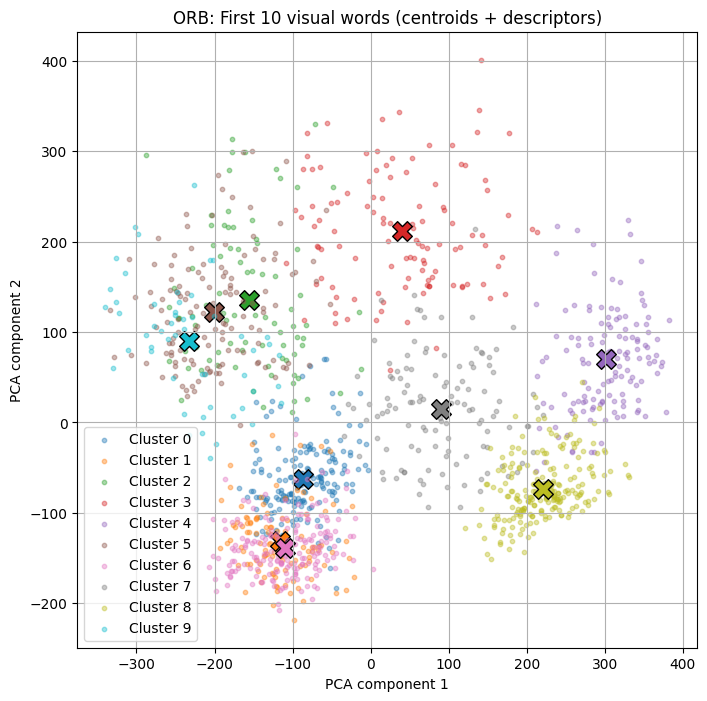

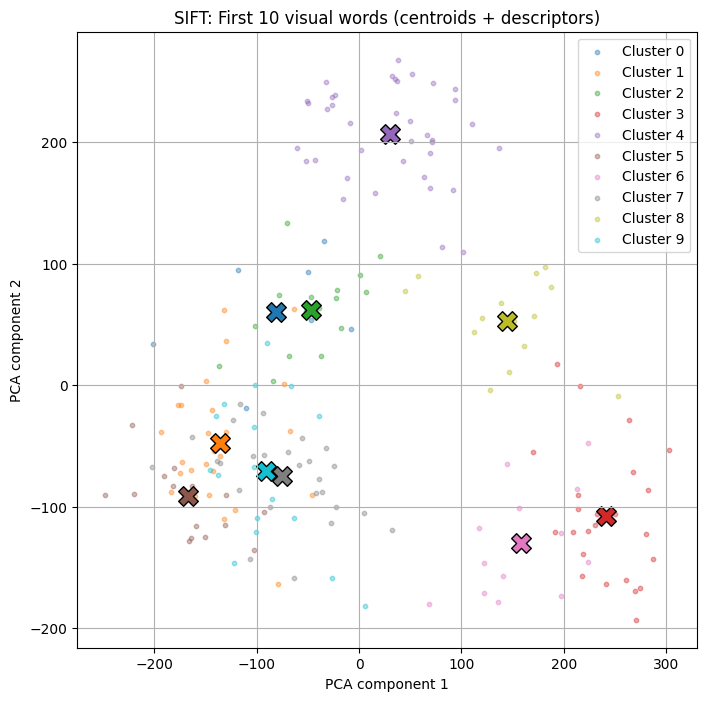

ORB histograms shape: (500, 75)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 75)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2324
  ORB AP : 0.2387
----------------------------------------
Class: automobile
  SIFT AP: 0.2900
  ORB AP : 0.2820
----------------------------------------
Class: bird
  SIFT AP: 0.2842
  ORB AP : 0.2956
----------------------------------------
Class: cat
  SIFT AP: 0.2312
  ORB AP : 0.2251
----------------------------------------
Class: deer
  SIFT AP: 0.2132
  ORB AP : 0.2080
----------------------------------------
Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (4957, 32)
Average ORB descriptors per image: 33.49
SIFT descriptors shape: (1884, 128)
Average SIFT descriptors per image: 12.73
Clustering 4957 points in 32D to 100 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19

WARNING clustering 1884 points to 200 centroids: please provide at least 7800 training points


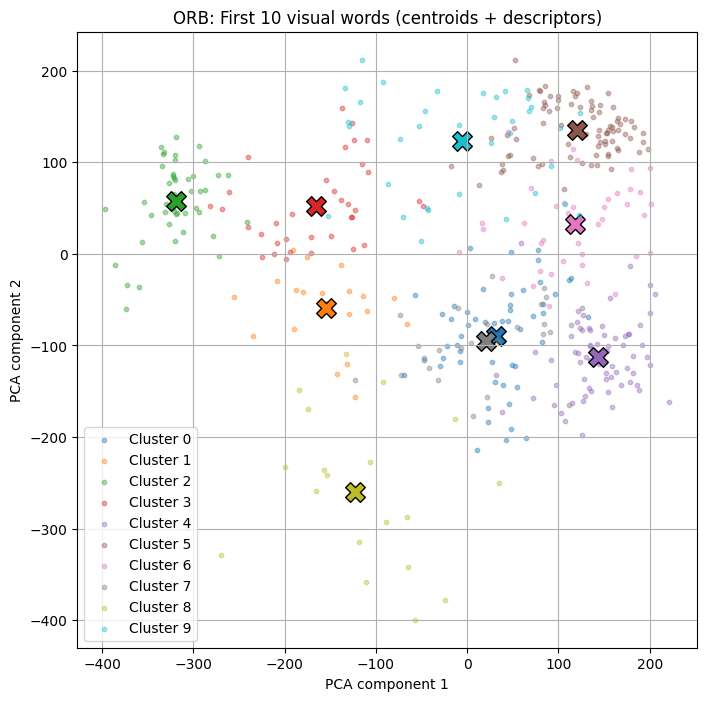

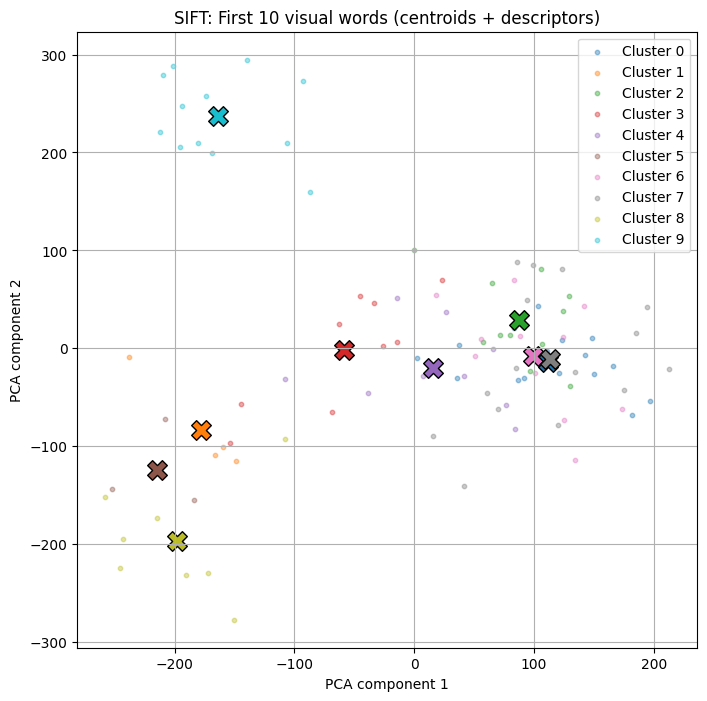

ORB histograms shape: (500, 100)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 100)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2287
  ORB AP : 0.2664
----------------------------------------
Class: automobile
  SIFT AP: 0.4136
  ORB AP : 0.2735
----------------------------------------
Class: bird
  SIFT AP: 0.3734
  ORB AP : 0.2938
----------------------------------------
Class: cat
  SIFT AP: 0.2363
  ORB AP : 0.2327
----------------------------------------
Class: deer
  SIFT AP: 0.2201
  ORB AP : 0.2360
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (6547, 32)
Average ORB descriptors per image: 33.07
SIFT descriptors shape: (2516, 128)
Average SIFT descriptors per image: 12.71
Clustering 6547 points in 32D to 100 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 

WARNING clustering 2516 points to 200 centroids: please provide at least 7800 training points


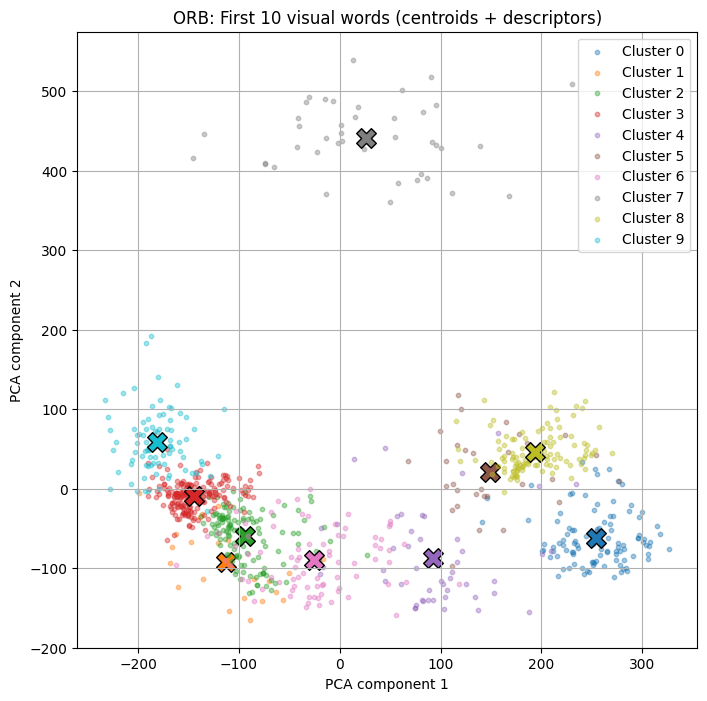

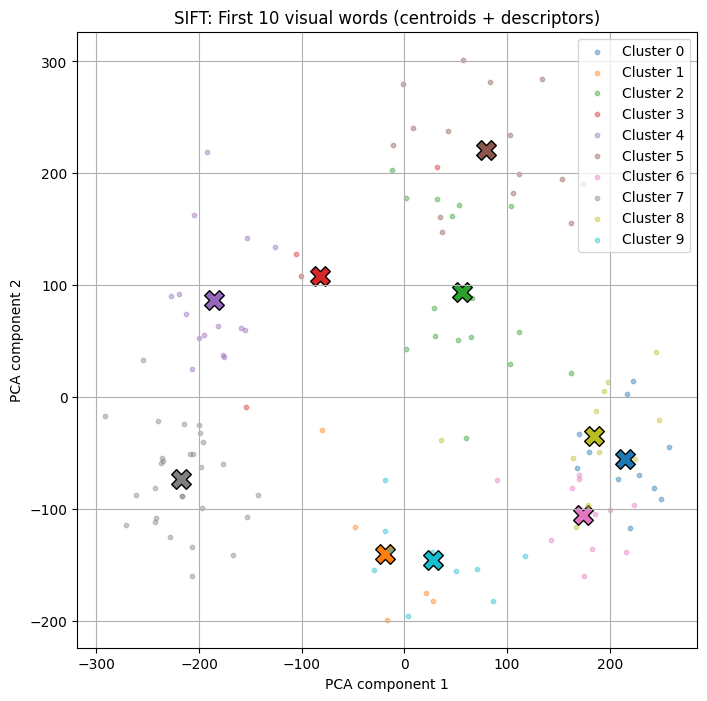

ORB histograms shape: (500, 100)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 100)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2390
  ORB AP : 0.2482
----------------------------------------
Class: automobile
  SIFT AP: 0.3906
  ORB AP : 0.2724
----------------------------------------
Class: bird
  SIFT AP: 0.3756
  ORB AP : 0.2878
----------------------------------------
Class: cat
  SIFT AP: 0.2144
  ORB AP : 0.2299
----------------------------------------
Class: deer
  SIFT AP: 0.2419
  ORB AP : 0.2113
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (8407, 32)
Average ORB descriptors per image: 33.76
SIFT descriptors shape: (3181, 128)
Average SIFT descriptors per image: 12.78
Clustering 8407 points in 32D to 100 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 

WARNING clustering 3181 points to 200 centroids: please provide at least 7800 training points


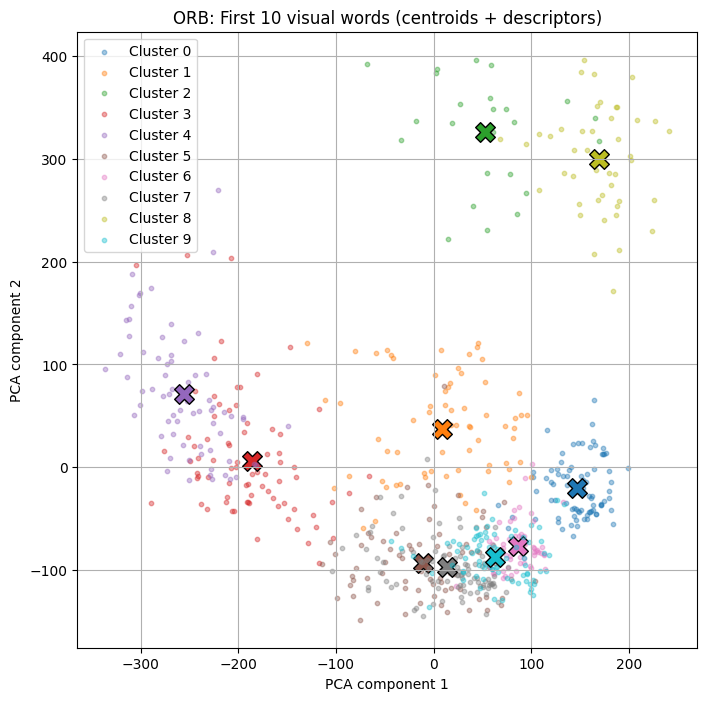

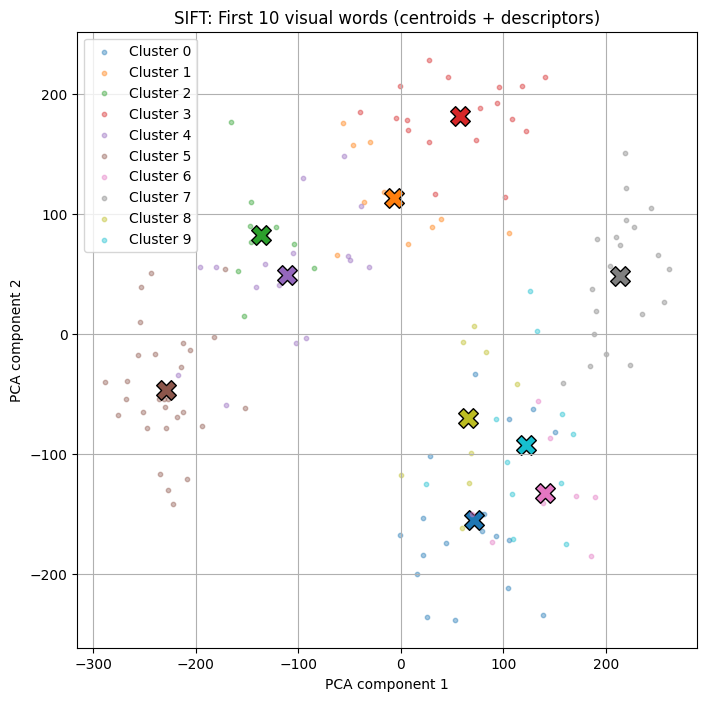

ORB histograms shape: (500, 100)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 100)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2249
  ORB AP : 0.2466
----------------------------------------
Class: automobile
  SIFT AP: 0.3861
  ORB AP : 0.2891
----------------------------------------
Class: bird
  SIFT AP: 0.3390
  ORB AP : 0.3264
----------------------------------------
Class: cat
  SIFT AP: 0.2288
  ORB AP : 0.2233
----------------------------------------
Class: deer
  SIFT AP: 0.2150
  ORB AP : 0.1985
----------------------------------------
Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (2455, 32)
Average ORB descriptors per image: 16.59
SIFT descriptors shape: (7940, 128)
Average SIFT descriptors per image: 53.65
Clustering 2455 points in 32D to 100 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 

WARNING clustering 2455 points to 100 centroids: please provide at least 3900 training points


  Iteration 19 (0.19 s, search 0.18 s): objective=6.5458e+08 imbalance=1.088 nsplit=0       


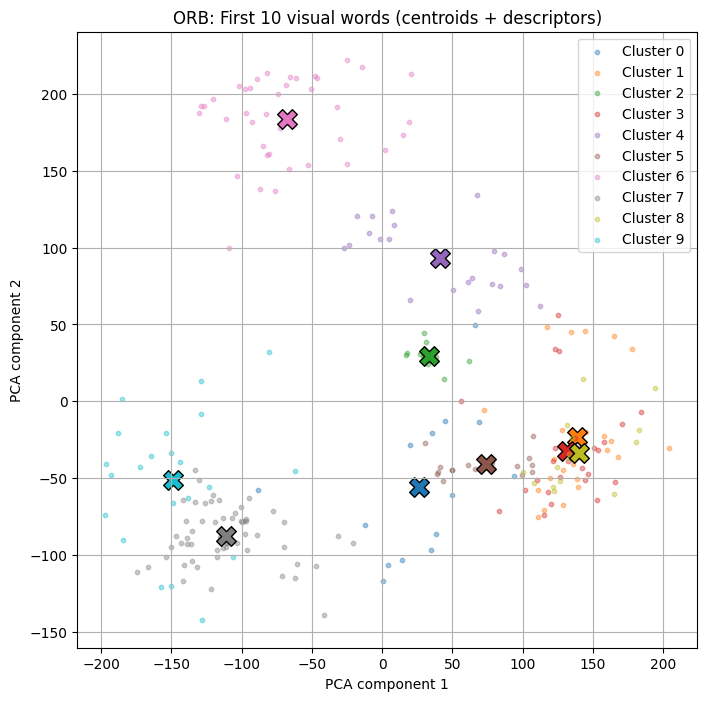

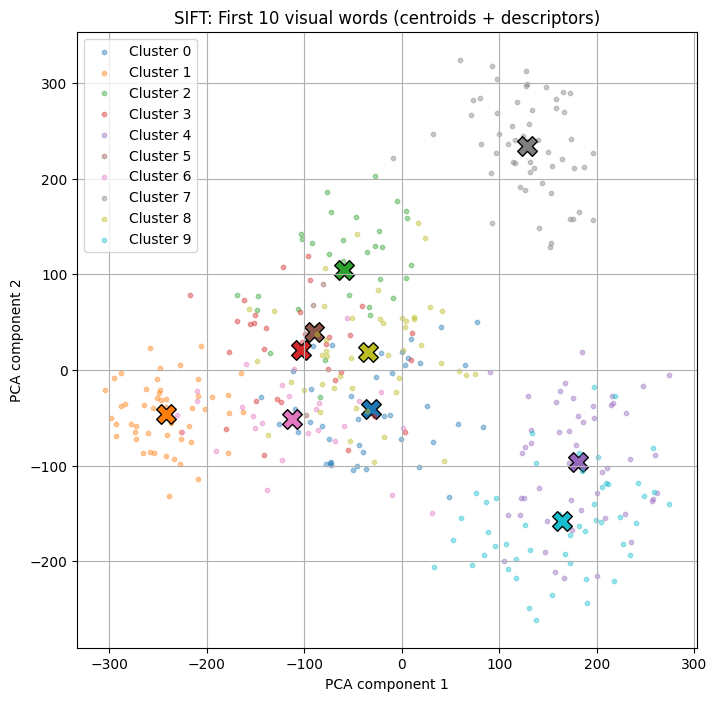

ORB histograms shape: (500, 100)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 100)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2794
  ORB AP : 0.2648
----------------------------------------
Class: automobile
  SIFT AP: 0.3380
  ORB AP : 0.2506
----------------------------------------
Class: bird
  SIFT AP: 0.3085
  ORB AP : 0.2700
----------------------------------------
Class: cat
  SIFT AP: 0.2502
  ORB AP : 0.2398
----------------------------------------
Class: deer
  SIFT AP: 0.2373
  ORB AP : 0.2416
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (3313, 32)
Average ORB descriptors per image: 16.73
SIFT descriptors shape: (11112, 128)
Average SIFT descriptors per image: 56.12
Clustering 3313 points in 32D to 100 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration

WARNING clustering 3313 points to 100 centroids: please provide at least 3900 training points


  Iteration 19 (0.28 s, search 0.26 s): objective=9.26561e+08 imbalance=1.064 nsplit=0       


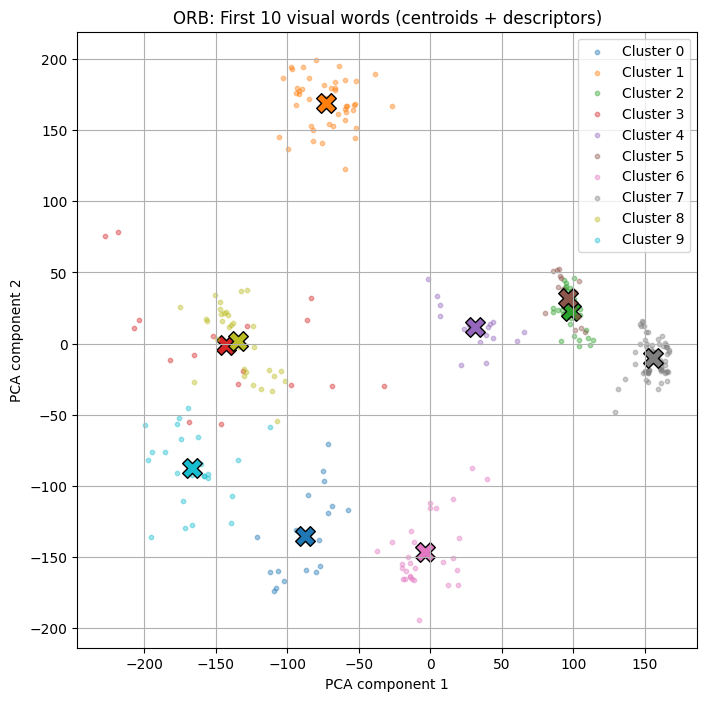

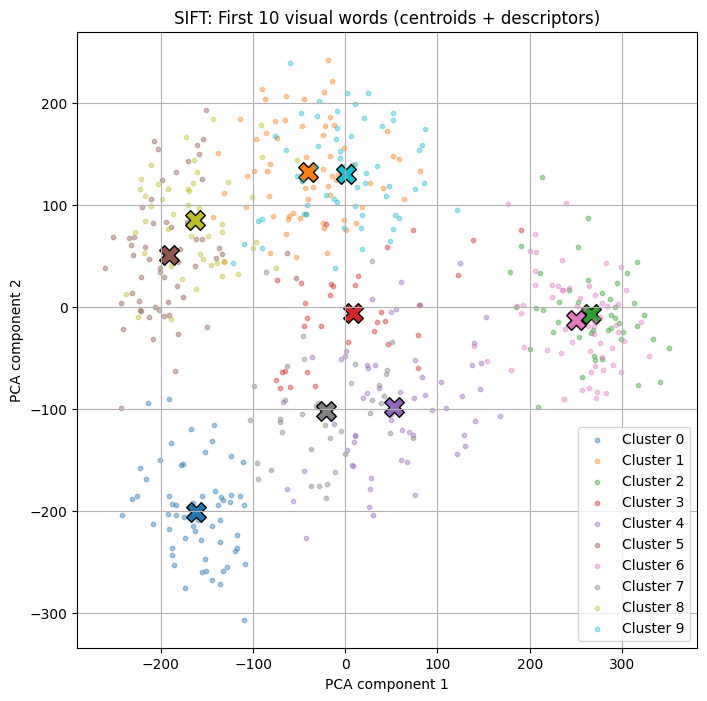

ORB histograms shape: (500, 100)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 100)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2737
  ORB AP : 0.2608
----------------------------------------
Class: automobile
  SIFT AP: 0.3720
  ORB AP : 0.2109
----------------------------------------
Class: bird
  SIFT AP: 0.3543
  ORB AP : 0.2591
----------------------------------------
Class: cat
  SIFT AP: 0.2746
  ORB AP : 0.2370
----------------------------------------
Class: deer
  SIFT AP: 0.2159
  ORB AP : 0.2038
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (4138, 32)
Average ORB descriptors per image: 16.62
SIFT descriptors shape: (14071, 128)
Average SIFT descriptors per image: 56.51
Clustering 4138 points in 32D to 100 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration

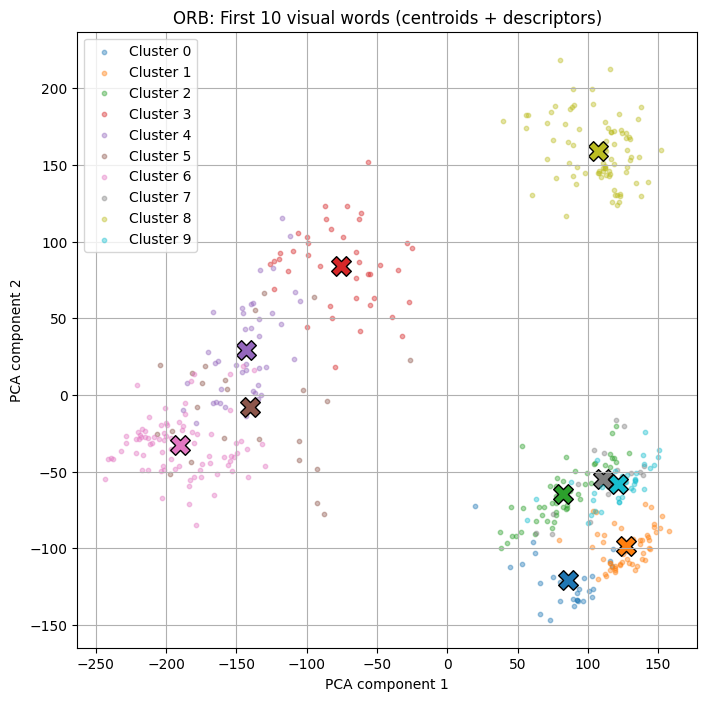

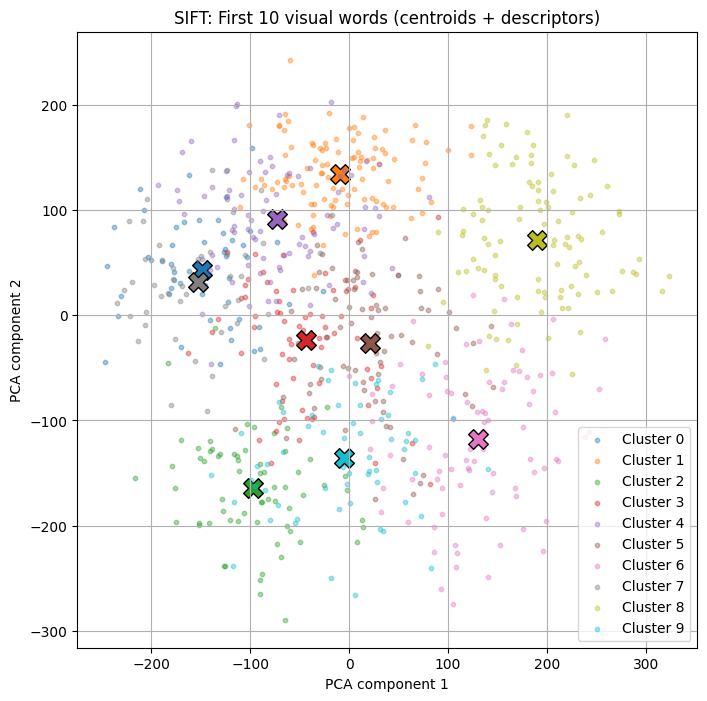

ORB histograms shape: (500, 100)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 100)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2414
  ORB AP : 0.2456
----------------------------------------
Class: automobile
  SIFT AP: 0.3456
  ORB AP : 0.2201
----------------------------------------
Class: bird
  SIFT AP: 0.3364
  ORB AP : 0.2618
----------------------------------------
Class: cat
  SIFT AP: 0.2432
  ORB AP : 0.2066
----------------------------------------
Class: deer
  SIFT AP: 0.2058
  ORB AP : 0.2073
----------------------------------------
Number of images for visual vocabulary: 148
Number of images for SVM training: 352
ORB descriptors shape: (5910, 32)
Average ORB descriptors per image: 39.93
SIFT descriptors shape: (1969, 128)
Average SIFT descriptors per image: 13.30
Clustering 5910 points in 32D to 100 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 

WARNING clustering 1969 points to 200 centroids: please provide at least 7800 training points


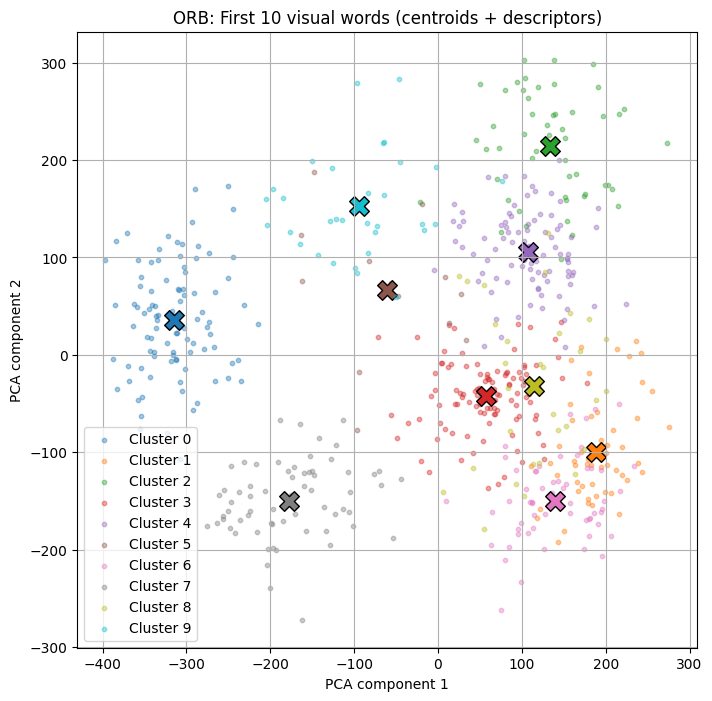

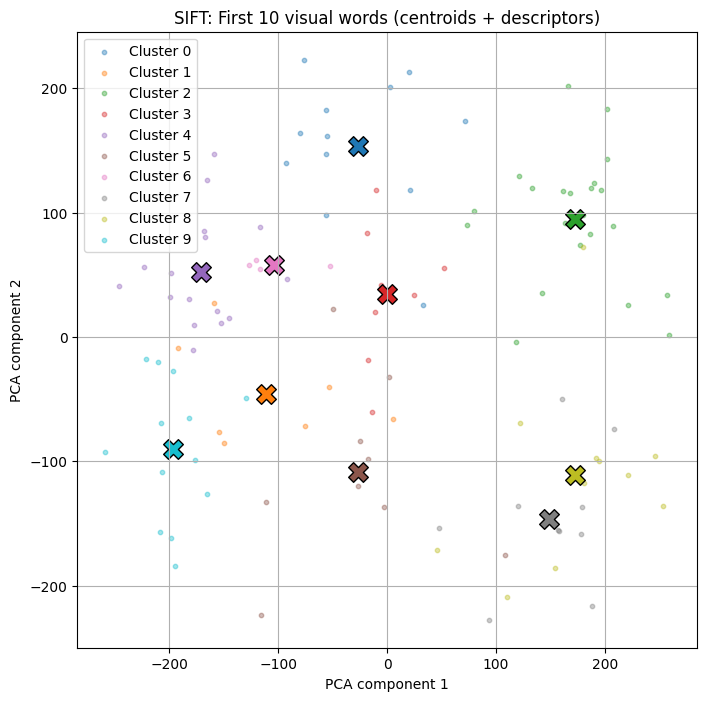

ORB histograms shape: (500, 100)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 100)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2260
  ORB AP : 0.2498
----------------------------------------
Class: automobile
  SIFT AP: 0.2943
  ORB AP : 0.3139
----------------------------------------
Class: bird
  SIFT AP: 0.2736
  ORB AP : 0.2739
----------------------------------------
Class: cat
  SIFT AP: 0.2444
  ORB AP : 0.2261
----------------------------------------
Class: deer
  SIFT AP: 0.2128
  ORB AP : 0.2031
----------------------------------------
Number of images for visual vocabulary: 198
Number of images for SVM training: 302
ORB descriptors shape: (8040, 32)
Average ORB descriptors per image: 40.61
SIFT descriptors shape: (2750, 128)
Average SIFT descriptors per image: 13.89
Clustering 8040 points in 32D to 100 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 

WARNING clustering 2750 points to 200 centroids: please provide at least 7800 training points


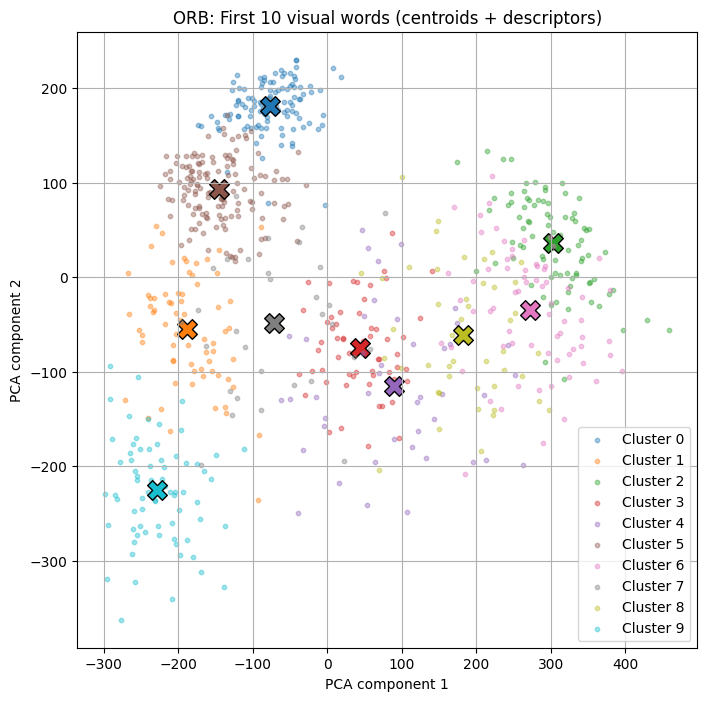

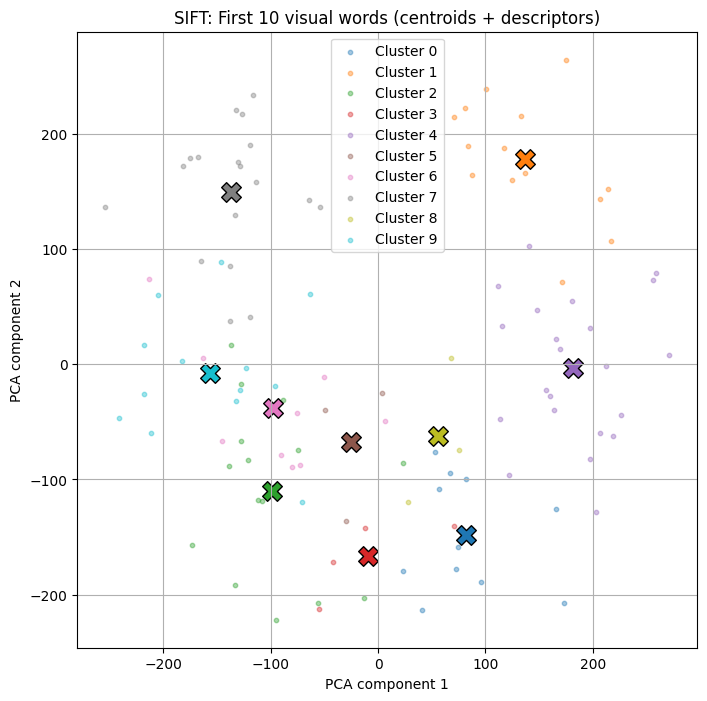

ORB histograms shape: (500, 100)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 100)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2280
  ORB AP : 0.2376
----------------------------------------
Class: automobile
  SIFT AP: 0.2908
  ORB AP : 0.2933
----------------------------------------
Class: bird
  SIFT AP: 0.2521
  ORB AP : 0.2908
----------------------------------------
Class: cat
  SIFT AP: 0.2451
  ORB AP : 0.2368
----------------------------------------
Class: deer
  SIFT AP: 0.2100
  ORB AP : 0.2377
----------------------------------------
Number of images for visual vocabulary: 249
Number of images for SVM training: 251
ORB descriptors shape: (9965, 32)
Average ORB descriptors per image: 40.02
SIFT descriptors shape: (3308, 128)
Average SIFT descriptors per image: 13.29
Clustering 9965 points in 32D to 100 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 

WARNING clustering 3308 points to 200 centroids: please provide at least 7800 training points


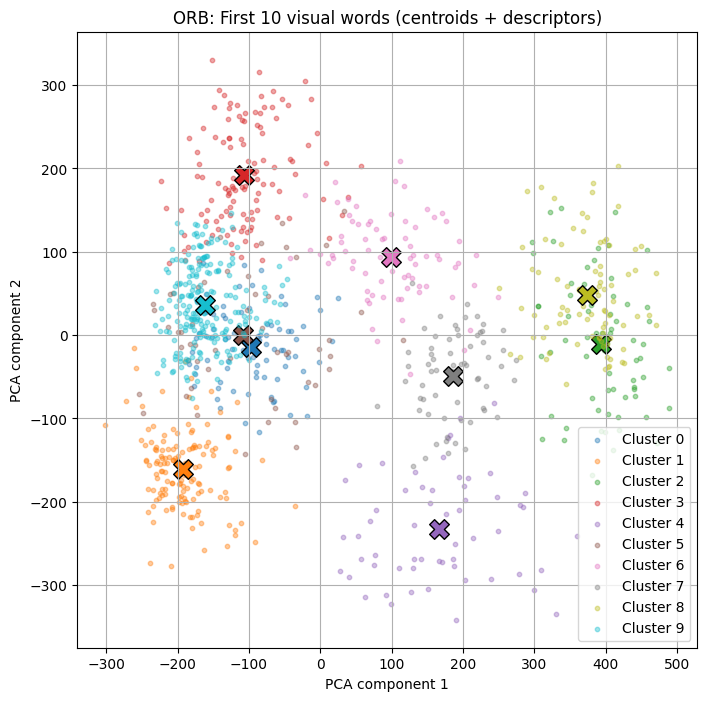

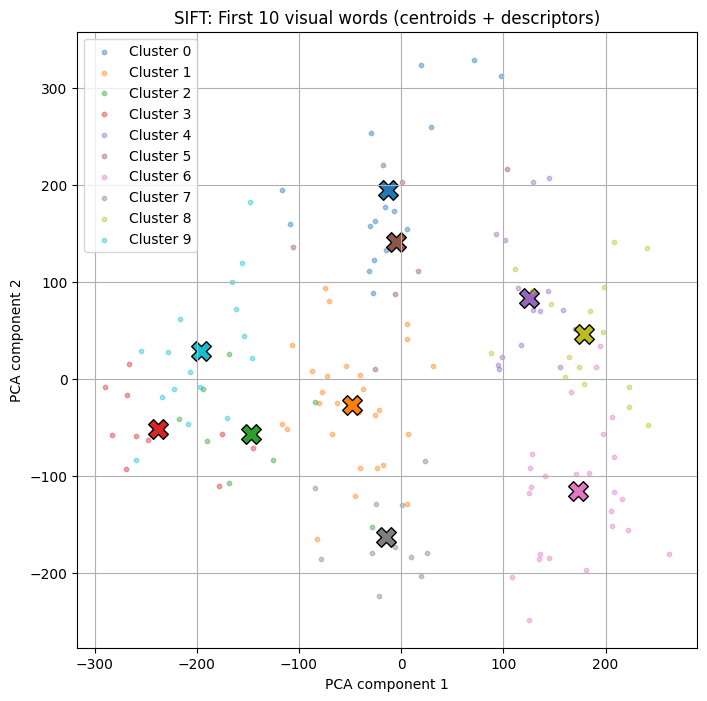

ORB histograms shape: (500, 100)
SIFT histograms shape: (500, 200)
ORB histograms shape: (1000, 100)
SIFT histograms shape: (1000, 200)
ORB SVM trained on one-vs-rest.
SIFT SVM trained on one-vs-rest.
Class: frog
  SIFT AP: 0.2195
  ORB AP : 0.2361
----------------------------------------
Class: automobile
  SIFT AP: 0.3146
  ORB AP : 0.3236
----------------------------------------
Class: bird
  SIFT AP: 0.2217
  ORB AP : 0.3067
----------------------------------------
Class: cat
  SIFT AP: 0.2149
  ORB AP : 0.2588
----------------------------------------
Class: deer
  SIFT AP: 0.2315
  ORB AP : 0.2055
----------------------------------------


In [272]:
# YOUR CODE HERE
# visual_words = [250, 500, 750, 1000]
visual_words = [25 ,50, 75, 100]
training_subset_size = [0.3, 0.4, 0.5]


for num_visual_w in visual_words:
    for orb, sift in zip(orbs, sifts):
        for subset_size in training_subset_size:
            vocab_images, vocab_indices, svm_images, svm_indices = split_train_for_vocab_svm(train_images,
                                                                                        train_labels,
                                                                                        class_names,
                                                                                        vocab_fraction=subset_size,
                                                                                        seed=None)
            
            orb_descriptors, sift_descriptors = extract_orb_sift_from_images(vocab_images, orb, sift)

            orb_kmeans, sift_kmeans = train_kmeans(orb_descriptors,
                                            sift_descriptors,
                                            num_clusters_orb=num_visual_w)
            
            plot_visual_words(orb_descriptors, orb_kmeans, n_clusters_to_show=10, title_prefix="ORB")
            plot_visual_words(sift_descriptors, sift_kmeans, n_clusters_to_show=10, title_prefix="SIFT")

            orb_histograms, sift_histograms = build_visual_vocabulary_histograms(train_images,
                                                                                orb_kmeans,
                                                                                sift_kmeans,
                                                                                orb,
                                                                                sift)

            orb_test_histograms, sift_test_histograms = build_visual_vocabulary_histograms(test_images,
                                                                                            orb_kmeans,
                                                                                            sift_kmeans,
                                                                                            orb,
                                                                                            sift)

            orb_svm, sift_svm = train_orb_sift_svm(orb_histograms,
                                                sift_histograms,
                                                train_labels,
                                                svm_indices)

            y_true, orb_rankings, sift_rankings = compute_svm_rankings(orb_svm,
                                                                    sift_svm,
                                                                    orb_test_histograms,
                                                                    sift_test_histograms,
                                                                    class_names,
                                                                    test_labels)

            for label in class_names:
                ap_sift, ap_orb = compute_map_c(label, y_true, sift_rankings, orb_rankings, class_names)
                print(f"Class: {label}")
                print(f"  SIFT AP: {ap_sift:.4f}")
                print(f"  ORB AP : {ap_orb:.4f}")
                print("-" * 40)

            # for target_class in class_names:
            #     plot_top_bottom_ranked_images(target_class, class_names, orb_rankings, sift_rankings, test_images, top_k=5)

<a id="section-10"></a>
### **Section 10: Using CLIP for Image Classification (5 points)**

**<span style="color:red">⚠️ NOTE: This section should NOT be included in the report. It is only meant to be completed in the code cells. The purpose of this task is to introduce you to a more state-of-the-art model (CLIP) compared to Bag of Visual Words (BoVW). Vision Transformers (ViT) will be covered in more detail in the Deep Learning 1 course next period!</span>**

In this section, you will use a pre-trained CLIP model for image classification. CLIP (Contrastive Language-Image Pretraining) is a vision-language transformer model trained on a large dataset of images and text. It consists of two main components: a Vision Transformer (ViT) and a text Transformer. The ViT encodes images by dividing them into patches (tokens), flattening each patch into a vector, and passing them through a sequence of Transformer layers to produce an encoded representation of the image.

For this task, you will use the visual transformer component of CLIP to extract encoded representations of the input images. While this is not the typical way to use CLIP (which involves encoding both images and text for similarity comparison), it provides an interesting application of this state-of-the-art model for image classification.

**To Install CLIP:**
```python
pip install git+https://github.com/openai/CLIP.git
```

**Additional Reading (if you're interested):**
- [OpenAI CLIP Overview](https://openai.com/clip)
- [Vision Transformer (ViT) Paper](https://arxiv.org/abs/2010.11929)
- [Tutorial on Vision Transformers](https://d2l.ai/chapter_attention-mechanisms-and-transformers/vision-transformer.html)
- [UvA's Deep Learning Introduction to ViTs](https://uvadlc-notebooks.readthedocs.io/en/latest/tutorial_notebooks/tutorial15/Vision_Transformer.html)

First, create DataLoaders for both the training and test datasets by filtering the CIFAR-10 dataset to include only the selected classes: frog, automobile, bird, cat, and deer. Use a batch size of 16 for both DataLoaders, and resize the images to 224x224 to match the input size requirements for CLIP. Remember to normalize the images using the appropriate mean and standard deviation. Use a training set size of 1000 images per class and a test set size of 200 images per class.

In [ ]:
# YOUR CODE HERE

Next, we load a pre-trained CLIP model, which is a vision-language transformer designed to predict the text that describes an image and vice versa. The model consists of two components: a Vision Transformer (ViT) for encoding images and a text Transformer for encoding text. 

In [ ]:
import clip

# Setup the model and the preprocessor
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load the pre-trained CLIP model
model, preprocess = clip.load("ViT-B/32", device=device)

To extract the visual tokens using the CLIP model, start by initializing two empty lists: one for storing the image features and another for the labels. Use `tqdm` to create a progress bar that tracks the extraction process over the DataLoader. Iterate through the DataLoader, extracting images and labels. Disable gradient computation, and then encode the images with `model.encode_image(images)`. Append the encoded features and labels to their respective lists. Remember, the output from the model will have the shape `(batch_size, 512)` due to batched processing, if your are using a single you should reshape the output to `(512,)` to remove the batch dimension.

In this example, we will use the class token as the visual representation of the image. The class token is a 512-dimensional vector that represents the image. We will use this vector to train a classifier to classify the images.

**Note:** The CLIP model is quite large and may take some time to extract features from the images. You can use the `tqdm` library to create a progress bar that shows the extraction progress. It is recommended to test the code with a smaller subset of images to ensure it functions correctly before running it on the full dataset. With the default batch size of 16 and a training set size of 1000 images, the extraction process may take a 10-20 minutes.

In [ ]:
# YOUR CODE HERE

In [ ]:
# Stack the (batched) visual tokens extracted from the images. The resulting shape will be (number_of_images, 512).
stacked_image_features = torch.cat(image_features_list)
stacked_target_labels = torch.cat(target_labels_list)

To train a classifier using the visual tokens, start by initializing an SVM classifier using `SVC()` from `scikit-learn`. You can play around with different hyperparameters such as kernel type, regularization parameter, and gamma to find the best configuration. Finally, use the `fit` method to train the classifier on the visual image features and labels.

In [ ]:
# YOUR CODE HERE

To evaluate the classifier, start by extracting the visual tokens from the test images using the same method applied to the training set. Loop through the test DataLoader, encode each batch of images using the model (e.g., `model.encode_image(images)`), and store the results in separate lists for the features and labels. After extracting all the features, stack them into a single tensor for both the features and labels. This process will prepare the test data for use in evaluating the classifier's performance.

In [ ]:
# YOUR CODE HERE

To evaluate the performance of your classifier, use the test set features you extracted earlier. First, generate predictions for the test set by passing the stacked test features into your trained classifier's `predict` method. Next, use the `classification_report` function from `sklearn.metrics` to create a detailed report that includes metrics such as precision, recall, and F1-score for each class. Finally, print the report to analyze how well your classifier performs across the different classes.

In [ ]:
# YOUR CODE HERE

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
|  | - % | - % | - % |
|  | - % | - % | - % |
|  | - % | - % | - % |
|  | - % | - % | - % |

### - End of Notebook -